# Aplicación Inteligente para el Pronóstico de Presupuesto Empresarial con Machine Learning e Integración en Power BI


## Resumen del Proyecto

Este proyecto desarrolla una aplicación inteligente de pronóstico presupuestario para empresas, integrando técnicas avanzadas de aprendizaje automático, análisis exploratorio de datos y modelos predictivos de series temporales. A través de la limpieza, transformación y modelado de dos grandes datasets financieros —costos e ingresos—, la solución permite estimar con precisión el total cost y net profit, identificando además patrones, anomalías y variables clave que impactan en el presupuesto.

Se incluye una API opcional y una visualización automatizada mediante Power BI, permitiendo que los resultados se integren fácilmente en los flujos de trabajo empresariales.

## Objetivo del Proyecto
Desarrollar un sistema inteligente y automatizado de pronóstico de presupuesto que utilice técnicas de aprendizaje automático y análisis de datos para predecir con precisión los ingresos, costos y utilidades de una empresa.
El sistema busca:

- Identificar los principales impulsores financieros.

- Detectar patrones y anomalías en los datos históricos.

- Construir modelos predictivos explicables que faciliten la toma de decisiones.

- Integrar los resultados en herramientas de visualización como Power BI.

- Automatizar el proceso de análisis y generación de reportes para uso empresarial continuo.

## Plan de Trabajo
Comprensión y Preprocesamiento de Datos

1. Limpieza, transformación y fusión de los datasets df_costs y df_earnings.

    - Análisis Exploratorio de Datos (EDA)

2. Visualización de patrones temporales, correlaciones, y distribución de variables clave.

    - Ingeniería de Características

3. Creación de nuevas variables relevantes, codificación de categorías y manejo de valores faltantes.

    - Desarrollo del Modelo de Pronóstico

4. Entrenamiento y comparación de modelos como Random Forest, XGBoost, LightGBM y Prophet para pronóstico de múltiples variables objetivo.

    - Evaluación y Validación

5. Validación cruzada, análisis de errores y métricas como MAE, RMSE y R² para evaluar el desempeño.

    - Construcción de una API

6. Desarrollo de una API REST con Streamlit para integrar el modelo en aplicaciones externas.

    - Integración con Power BI

7. Exportación de predicciones y variables clave para su visualización dinámica en paneles interactivos.

    - Automatización y Generación de Reportes

8. Implementación de procesos automáticos de análisis y generación de reportes financieros resumidos.


## Cargar Librerías

In [ ]:
# Bibliotecas utilizadas en el proyecto

## Bibliotecas incorporadas (biblioteca estándar)
import math
import os
import warnings
from datetime import timedelta

## Manipulación y análisis de datos
import numpy as np
import pandas as pd

## Visualización
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

## Aprendizaje automático y preprocesamiento (scikit-learn, etc.)
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
from sklearn.decomposition import PCA
from sklearn.ensemble import (
    IsolationForest,
    RandomForestRegressor,
    StackingRegressor,
    VotingRegressor,
)
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_selection import VarianceThreshold, mutual_info_regression
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.manifold import TSNE
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import (
    KFold,
    RandomizedSearchCV,
    TimeSeriesSplit,
    cross_val_score,
    train_test_split,
)
from sklearn.multioutput import MultiOutputRegressor
from sklearn.neighbors import LocalOutlierFactor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import (
    FunctionTransformer,
    LabelEncoder,
    PowerTransformer,
    RobustScaler,
    StandardScaler,
)

## Codificación
from category_encoders import TargetEncoder


## Series temporales
from pandas.tseries.holiday import USFederalHolidayCalendar
from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tools.eval_measures import rmse


## Estadísticas
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant


## Utilidades
import joblib
import shap
import streamlit as st
from joblib import dump, load


## Modelos adicionales
import lightgbm as lgb
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor


## Configuración
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

## Cargar Datos

In [2]:
# Carga el archivo de datos en un DataFrame
DATA_DIR = os.path.join(os.getcwd(), 'data')  # Uses current working directory
df_costs = pd.read_csv(os.path.join(DATA_DIR, 'costs_dataset.csv'))
df_earnings = pd.read_csv(os.path.join(DATA_DIR, 'earnings_dataset.csv'))

## Preprocesamiento de Datos

### Evaluación Inicial de Datos

### DataFrame df_costs

In [3]:
# imprime la información general/resumida sobre el DataFrame
print(df_costs.head())
print(df_costs.shape)
df_costs.info()
df_costs.describe()

                             service_id service_date service_type  \
0  9e693312-a4da-40fe-a567-ef0e60b28661   2022-01-20   commercial   
1  21570c02-afdb-49b6-a545-bc807fabe138   2020-09-08   commercial   
2  2270f48a-4974-4855-999c-a5c2b12db157   2021-02-14    hazardous   
3  03c1a1e4-e8ae-4456-9280-0822de508a86   2020-08-15    recycling   
4  98ccdc50-c1f1-4bea-979e-142ea0c3a536   2021-07-02    recycling   

  service_subtype customer_type contract_type service_region  \
0      subtype_23      business      one-time       region_4   
1       subtype_9   residential       monthly       region_1   
2      subtype_23   residential      one-time       region_2   
3       subtype_8      business      one-time       region_4   
4       subtype_6    industrial        annual       region_7   

   service_duration_hours                                     equipment_used  \
0                     0.6  equipment_8, equipment_1, equipment_5, equipme...   
1                     7.5  equipment_1, 

,service_duration_hours,waste_volume_tons,recyclable_percentage,contamination_level,labor_cost,equipment_cost,transportation_cost,disposal_fees,regulatory_fees,fuel_price,staff_availability,economic_index,service_delay,total_cost
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,4.254154,25.044061,50.174441,2.993680,2523.900675,5044.717237,1006.548993,1507.832373,749.881910,4.006097,100.050028,100.003308,6.957940,10833.087863
std,2.163938,14.412374,28.881274,1.419789,1426.322651,2849.934524,572.251722,862.982011,434.105045,0.867551,17.338051,11.514118,4.318859,3390.771750
min,0.500000,0.100000,0.000000,1.000000,50.030000,100.340000,20.010000,10.030000,0.040000,2.500000,70.000000,80.000000,0.000000,1323.610000
25%,2.400000,12.590000,25.070000,2.000000,1296.502500,2573.820000,510.870000,759.180000,373.467500,3.260000,85.100000,90.080000,3.000000,8285.565000
50%,4.300000,25.020000,50.120000,3.000000,2523.470000,5058.050000,1005.305000,1508.515000,747.990000,4.010000,100.100000,100.040000,7.000000,10835.715000
75%,6.100000,37.530000,75.270000,4.000000,3755.150000,7492.960000,1500.200000,2254.140000,1128.602500,4.760000,114.980000,109.950000,11.000000,13362.570000
max,8.000000,50.000000,100.000000,5.000000,4999.970000,9999.880000,1999.960000,2999.900000,1500.000000,5.500000,130.000000,120.000000,14.000000,20329.210000


- El DataFrame consta de **50,000 filas** y **25 columnas**.  
- Campos incluidos:  
  - `service_id`  
  - `service_date`  
  - `service_type`  
  - `service_subtype`  
  - `customer_type`  
  - `contract_type`  
  - `service_region`  
  - `service_duration_hours`  
  - `equipment_used`  
  - `waste_volume_tons`  
  - `waste_density`  
  - `hazardous_material`  
  - `recyclable_percentage`  
  - `contamination_level`  
  - `labor_cost`  
  - `equipment_cost`  
  - `transportation_cost`  
  - `disposal_fees`  
  - `regulatory_fees`  
  - `fuel_price`  
  - `weather_conditions`  
  - `staff_availability`  
  - `economic_index`  
  - `service_delay`  
  - `total_cost`  

**Problemas identificados**:  
- La columna `service_date` tiene el tipo de dato "object" y debe convertirse al formato DateTime.


In [4]:
# Cambiar la columna al formato de fecha y hora
df_costs['service_date'] = pd.to_datetime(df_costs['service_date'])
print("df_costs['service_date'] =", df_costs['service_date'])

df_costs['service_date'] = 0       2022-01-20
1       2020-09-08
2       2021-02-14
3       2020-08-15
4       2021-07-02
           ...    
49995   2019-06-28
49996   2019-04-02
49997   2019-06-12
49998   2023-09-27
49999   2021-03-07
Name: service_date, Length: 50000, dtype: datetime64[ns]


#### DataFrame `df_earnings`

In [5]:
# imprime la información general/resumida sobre el DataFrame
print(df_earnings.head())
print(df_earnings.shape)
df_earnings.info()
df_earnings.describe()

                             service_id service_date   revenue  \
0  9e693312-a4da-40fe-a567-ef0e60b28661   2022-01-20  13572.38   
1  21570c02-afdb-49b6-a545-bc807fabe138   2020-09-08   7908.73   
2  2270f48a-4974-4855-999c-a5c2b12db157   2021-02-14  15810.62   
3  03c1a1e4-e8ae-4456-9280-0822de508a86   2020-08-15  16969.14   
4  98ccdc50-c1f1-4bea-979e-142ea0c3a536   2021-07-02   9074.00   

   profit_margin_percentage  net_profit billing_status payment_method  \
0                     16.26     1898.22    written_off    credit_card   
1                     25.08     1585.79    written_off          check   
2                     28.75     3530.53        overdue           cash   
3                      8.50     1329.38        pending           cash   
4                     24.52     1786.82        overdue          check   

                             invoice_id payment_date  late_payment_days  \
0  c136b943-3fe3-4b26-af68-f5aa558f228d   2022-02-01                 12   
1  32ff6fb6-c7

,revenue,profit_margin_percentage,net_profit,late_payment_days,discount_amount
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,13274.202692,22.546619,2441.114829,29.956100,76.746244
std,4308.701105,10.118921,1378.791042,17.581389,139.731658
min,1580.530000,5.000000,116.830000,0.000000,0.000000
25%,10041.090000,13.780000,1322.292500,15.000000,0.000000
50%,13189.480000,22.600000,2218.345000,30.000000,0.000000
75%,16379.590000,31.330000,3351.037500,45.000000,96.177500
max,27957.170000,40.000000,7977.770000,60.000000,500.000000


- El DataFrame consta de **50,000 filas** y **13 columnas**.  
- Campos incluidos:  
  - `service_id`  
  - `service_date`  
  - `revenue`  
  - `profit_margin_percentage`  
  - `net_profit`  
  - `billing_status`  
  - `payment_method`  
  - `invoice_id`  
  - `payment_date`  
  - `late_payment_days`  
  - `discount_applied`  
  - `discount_amount`  
  - `currency`  

**Problemas identificados**:  
- Las columnas `service_date` y `payment_date` tienen el tipo de dato "object" y deben convertirse al formato DateTime.

**Nota**: Ambos DataFrames comparten las columnas `service_id` y `service_date`, que se utilizarán para fusionar más adelante.


In [6]:
# Cambiar la columna al formato de fecha y hora
df_earnings['service_date'] = pd.to_datetime(df_earnings['service_date'])
print("df_earnings['service_date'] =", df_earnings['service_date'])
df_earnings['payment_date'] = pd.to_datetime(df_earnings['payment_date'])
print("df_earnings['payment_date'] =", df_earnings['payment_date'])

df_earnings['service_date'] = 0       2022-01-20
1       2020-09-08
2       2021-02-14
3       2020-08-15
4       2021-07-02
           ...    
49995   2019-06-28
49996   2019-04-02
49997   2019-06-12
49998   2023-09-27
49999   2021-03-07
Name: service_date, Length: 50000, dtype: datetime64[ns]
df_earnings['payment_date'] = 0       2022-02-01
1       2020-10-01
2       2021-04-02
3       2020-08-20
4       2021-07-21
           ...    
49995   2019-08-07
49996   2019-05-17
49997   2019-07-14
49998   2023-10-23
49999   2021-03-08
Name: payment_date, Length: 50000, dtype: datetime64[ns]


### Manejo de Valores Faltantes

Valores faltantes en df_costs:
 Series([], dtype: int64)
Valores faltantes en df_earnings:
 Series([], dtype: int64)
Series([], dtype: float64)
Series([], dtype: float64)


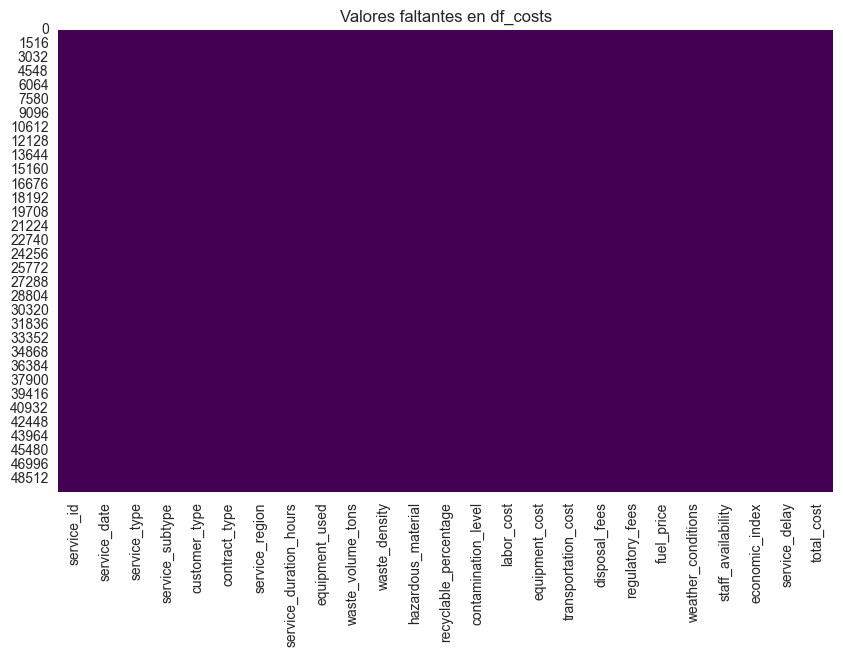

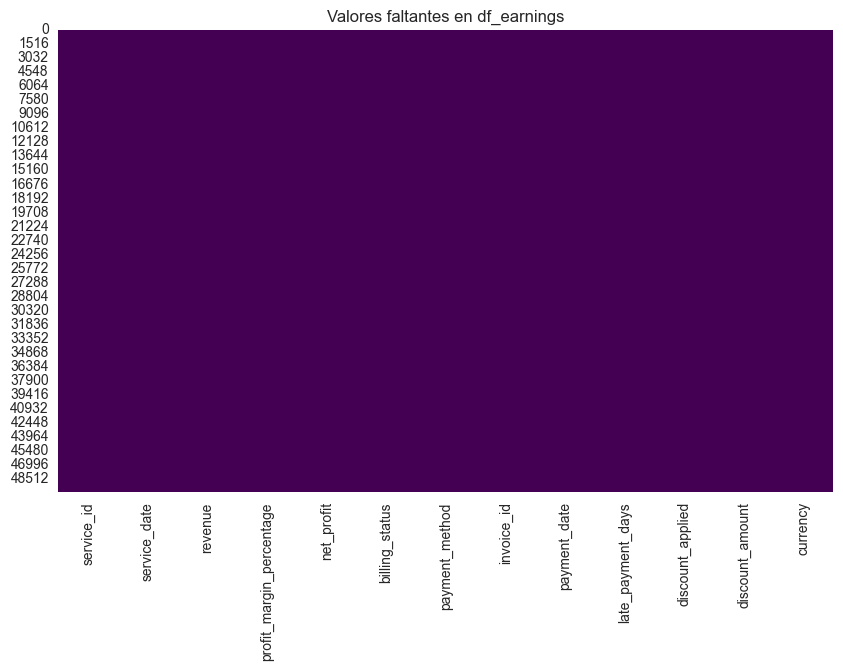

In [7]:
# Mostrar solo columnas con valores faltantes
# Para df_costs
missing_costs = df_costs.isnull().sum()
missing_costs = missing_costs[missing_costs > 0]
print("Valores faltantes en df_costs:\n", missing_costs)

# Para df_earnings
missing_earnings = df_earnings.isnull().sum()
missing_earnings = missing_earnings[missing_earnings > 0]
print("Valores faltantes en df_earnings:\n", missing_earnings)

# Verificar % de valores faltantes
# Para df_costs
missing_percent_costs = (df_costs.isnull().sum() / len(df_costs)) * 100
print(missing_percent_costs[missing_percent_costs > 0])

# Para df_earnings
missing_percent_earnings = (df_earnings.isnull().sum() / len(df_earnings)) * 100
print(missing_percent_earnings[missing_percent_earnings > 0])

# Visualizar valores faltantes

# Visualizar valores faltantes
plt.figure(figsize=(10,6))
sns.heatmap(df_costs.isnull(), cbar=False, cmap='viridis')
plt.title('Valores faltantes en df_costs')
plt.show()

plt.figure(figsize=(10,6))
sns.heatmap(df_earnings.isnull(), cbar=False, cmap='viridis')
plt.title('Valores faltantes en df_earnings')
plt.show()

### Detección de Duplicados

In [8]:
# Para df_costs
print("Número de filas duplicadas en df_costs:", df_costs.duplicated().sum())

# Para df_earnings
print("Número de filas duplicadas en df_earnings:", df_earnings.duplicated().sum())

# Para df_costs
duplicates_costs = df_costs[df_costs.duplicated()]
print("\nFilas duplicadas en df_costs:")
print(duplicates_costs)

# Para df_earnings
duplicates_earnings = df_earnings[df_earnings.duplicated()]
print("\nFilas duplicadas en df_earnings:")
print(duplicates_earnings)

Número de filas duplicadas en df_costs: 0
Número de filas duplicadas en df_earnings: 0

Filas duplicadas en df_costs:
Empty DataFrame
Columns: [service_id, service_date, service_type, service_subtype, customer_type, contract_type, service_region, service_duration_hours, equipment_used, waste_volume_tons, waste_density, hazardous_material, recyclable_percentage, contamination_level, labor_cost, equipment_cost, transportation_cost, disposal_fees, regulatory_fees, fuel_price, weather_conditions, staff_availability, economic_index, service_delay, total_cost]
Index: []

[0 rows x 25 columns]

Filas duplicadas en df_earnings:
Empty DataFrame
Columns: [service_id, service_date, revenue, profit_margin_percentage, net_profit, billing_status, payment_method, invoice_id, payment_date, late_payment_days, discount_applied, discount_amount, currency]
Index: []


### Identificación de Columnas Categóricas

In [9]:
# Identificar columnas categóricas
categorical_cols_costs = df_costs.select_dtypes(include=['object', 'category']).columns.tolist()
categorical_cols_earnings = df_earnings.select_dtypes(include=['object', 'category']).columns.tolist()

print("Columnas categóricas en df_costs:", categorical_cols_costs)
print("Columnas categóricas en df_earnings:", categorical_cols_earnings)

Columnas categóricas en df_costs: ['service_id', 'service_type', 'service_subtype', 'customer_type', 'contract_type', 'service_region', 'equipment_used', 'waste_density', 'weather_conditions']
Columnas categóricas en df_earnings: ['service_id', 'billing_status', 'payment_method', 'invoice_id', 'currency']


In [10]:
# Crear el codificador (Label Encoding)
le = LabelEncoder()

# Codificar cada columna categórica en df_costs
for col in categorical_cols_costs:
    df_costs[col] = le.fit_transform(df_costs[col].astype(str))
    print(f"Columna '{col}' codificada en df_costs")

# Codificar cada columna categórica en df_earnings  
for col in categorical_cols_earnings:
    df_earnings[col] = le.fit_transform(df_earnings[col].astype(str))
    print(f"Columna '{col}' codificada en df_earnings")

print("\nProceso de codificación completado para ambas tablas")

Columna 'service_id' codificada en df_costs
Columna 'service_type' codificada en df_costs
Columna 'service_subtype' codificada en df_costs
Columna 'customer_type' codificada en df_costs
Columna 'contract_type' codificada en df_costs
Columna 'service_region' codificada en df_costs
Columna 'equipment_used' codificada en df_costs
Columna 'waste_density' codificada en df_costs
Columna 'weather_conditions' codificada en df_costs
Columna 'service_id' codificada en df_earnings
Columna 'billing_status' codificada en df_earnings
Columna 'payment_method' codificada en df_earnings
Columna 'invoice_id' codificada en df_earnings
Columna 'currency' codificada en df_earnings

Proceso de codificación completado para ambas tablas


### Escalado/Normalización

In [11]:
# Identificar columnas numéricas para normalización
numeric_cols_costs = df_costs.select_dtypes(include=['float64', 'int64']).columns.tolist()
numeric_cols_earnings = df_earnings.select_dtypes(include=['float64', 'int64']).columns.tolist()

print("Columnas numéricas en df_costs:", numeric_cols_costs)
print("Columnas numéricas en df_earnings:", numeric_cols_earnings)

from sklearn.preprocessing import MinMaxScaler

# Crear instancia del escalador
scaler = MinMaxScaler()

# Normalizar datos en df_costs
df_costs_scaled = df_costs.copy()
df_costs_scaled[numeric_cols_costs] = scaler.fit_transform(df_costs_scaled[numeric_cols_costs])
print("\nNormalización completada para df_costs")

# Normalizar datos en df_earnings
df_earnings_scaled = df_earnings.copy()
df_earnings_scaled[numeric_cols_earnings] = scaler.fit_transform(df_earnings_scaled[numeric_cols_earnings])
print("Normalización completada para df_earnings")

print("\nProceso de escalado finalizado para ambos datasets")

Columnas numéricas en df_costs: ['service_duration_hours', 'waste_volume_tons', 'recyclable_percentage', 'contamination_level', 'labor_cost', 'equipment_cost', 'transportation_cost', 'disposal_fees', 'regulatory_fees', 'fuel_price', 'staff_availability', 'economic_index', 'service_delay', 'total_cost']
Columnas numéricas en df_earnings: ['revenue', 'profit_margin_percentage', 'net_profit', 'late_payment_days', 'discount_amount']

Normalización completada para df_costs
Normalización completada para df_earnings

Proceso de escalado finalizado para ambos datasets


### Detección de Outliers


🔍 Analizando outliers en df_costs...
📊 Se encontraron 14 columnas numéricas.
🌲 Isolation Forest detectó 500 outliers (1.00%).
📎 Local Outlier Factor detectó 500 outliers (1.00%).


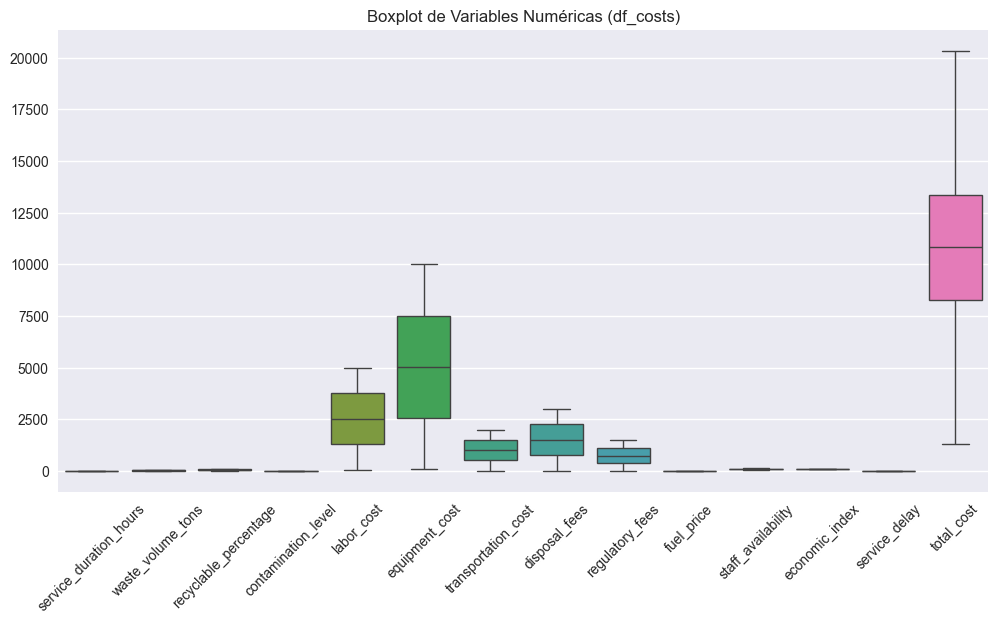

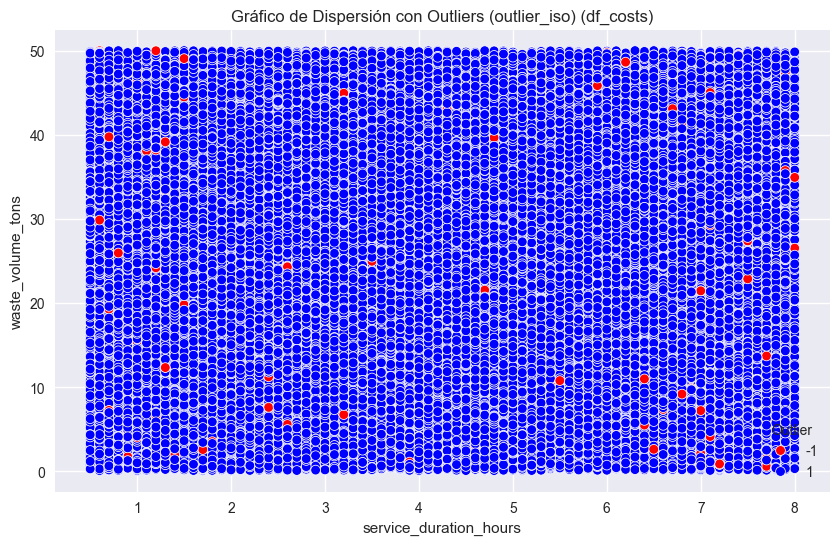


Outliers detectados en df_costs: Isolation Forest = 500, LOF = 500
Se eliminaron 947 filas con outliers.

🔍 Analizando outliers en df_earnings...
📊 Se encontraron 5 columnas numéricas.
🌲 Isolation Forest detectó 500 outliers (1.00%).
📎 Local Outlier Factor detectó 500 outliers (1.00%).


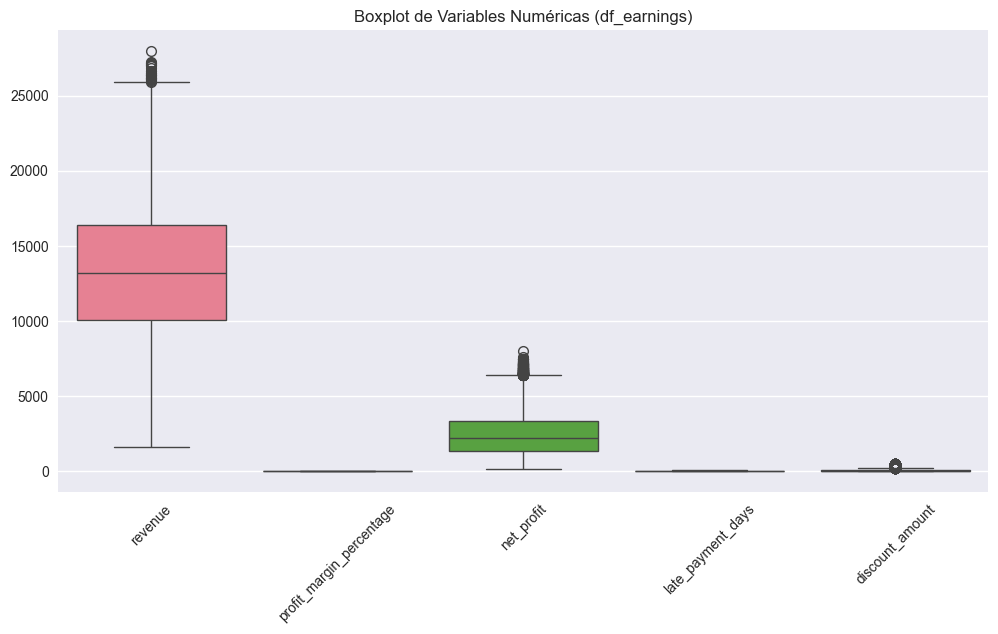

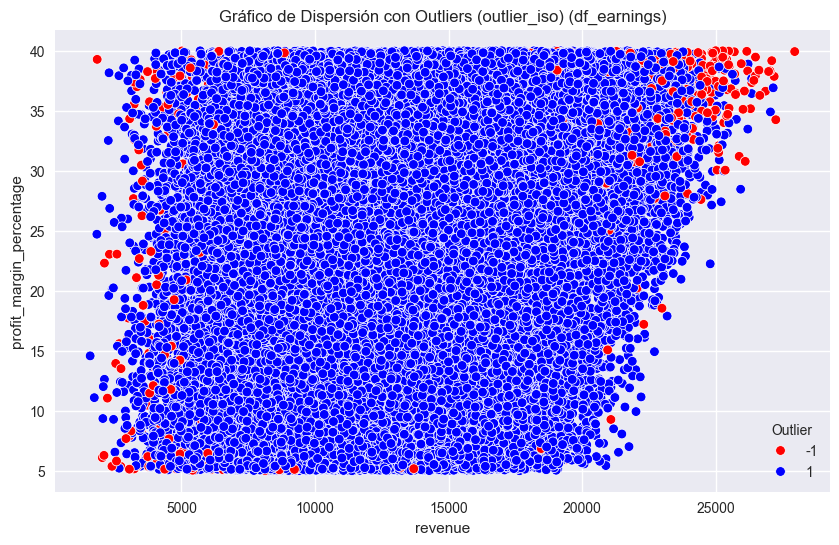


Outliers detectados en df_earnings: Isolation Forest = 500, LOF = 500
Se eliminaron 990 filas con outliers.


In [12]:
# --- Función para Detección de Outliers ---
def detect_outliers(df, df_name="DataFrame", contamination=0.01):
    print(f"\n🔍 Analizando outliers en {df_name}...")

    # Seleccionar columnas numéricas
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    print(f"📊 Se encontraron {len(numeric_cols)} columnas numéricas.")

    # Isolation Forest
    iso_forest = IsolationForest(contamination=contamination, random_state=42)
    df['outlier_iso'] = iso_forest.fit_predict(df[numeric_cols])
    n_outliers_iso = (df['outlier_iso'] == -1).sum()
    print(f"🌲 Isolation Forest detectó {n_outliers_iso} outliers ({100 * n_outliers_iso / len(df):.2f}%).")

    # Local Outlier Factor
    lof = LocalOutlierFactor(n_neighbors=20, contamination=contamination)
    df['outlier_lof'] = lof.fit_predict(df[numeric_cols])
    n_outliers_lof = (df['outlier_lof'] == -1).sum()
    print(f"📎 Local Outlier Factor detectó {n_outliers_lof} outliers ({100 * n_outliers_lof / len(df):.2f}%).")

    return df, numeric_cols

# --- Función para Visualización de Outliers ---
def visualize_outliers(df, numeric_cols, outlier_column='outlier_iso', title_suffix=''):
    if len(numeric_cols) < 2:
        print(f"⚠️ No hay suficientes columnas numéricas para graficar en {title_suffix}")
        return
    
    x_col = numeric_cols[0]
    y_col = numeric_cols[1]

    # Boxplot
    plt.figure(figsize=(12, 6))
    sns.boxplot(data=df[numeric_cols])
    plt.title(f'Boxplot de Variables Numéricas {title_suffix}')
    plt.xticks(rotation=45)
    plt.show()

    # Scatterplot
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        data=df,
        x=x_col,
        y=y_col,
        hue=outlier_column,
        palette={1: 'blue', -1: 'red'}
    )
    plt.title(f'Gráfico de Dispersión con Outliers ({outlier_column}) {title_suffix}')
    plt.legend(title='Outlier')
    plt.show()

# --- Función para Manejo de Outliers ---
def handle_outliers(df, method="remove", contamination=0.01):
    """
    Detecta y maneja outliers automáticamente, ya sea eliminándolos o ajustándolos.

    Parámetros:
    df (DataFrame): El dataframe a procesar
    method (str): Método para manejar outliers ("remove" para eliminar o "cap" para ajustar)
    contamination (float): Proporción esperada de outliers en los datos (usado para Isolation Forest y LOF)

    Retorna:
    DataFrame: Dataframe procesado con outliers manejados
    """
    # Seleccionar columnas numéricas
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns.tolist()
    
    # Detección con Isolation Forest
    iso_forest = IsolationForest(contamination=contamination, random_state=42)
    df['outlier_iso'] = iso_forest.fit_predict(df[numeric_cols])
    
    # Detección con Local Outlier Factor
    lof = LocalOutlierFactor(n_neighbors=20, contamination=contamination)
    df['outlier_lof'] = lof.fit_predict(df[numeric_cols])
    
    # Mostrar resultados
    n_outliers_iso = (df['outlier_iso'] == -1).sum()
    n_outliers_lof = (df['outlier_lof'] == -1).sum()
    print(f"\nOutliers detectados en {df.name}: Isolation Forest = {n_outliers_iso}, LOF = {n_outliers_lof}")
    
    # Manejar outliers según el método especificado
    if method == "remove":
        # Eliminar filas donde algún modelo detectó outlier
        df_clean = df[(df['outlier_iso'] == 1) & (df['outlier_lof'] == 1)]
        print(f"Se eliminaron {len(df) - len(df_clean)} filas con outliers.")
        return df_clean
    
    elif method == "cap":
        # Ajustar outliers usando los percentiles 5 y 95
        for col in numeric_cols:
            lower_cap = df[col].quantile(0.05)
            upper_cap = df[col].quantile(0.95)
            df[col] = df[col].clip(lower=lower_cap, upper=upper_cap)
        print("Outliers ajustados a los percentiles 5 y 95.")
        return df

    else:
        print("Método inválido. Usar 'remove' o 'cap'.")
        return df

# --- Análisis Principal para df_costs ---
df_costs.name = "df_costs"  # Asignar nombre para referencia
df_costs, numeric_cols_costs = detect_outliers(df_costs, df_name="df_costs")
visualize_outliers(df_costs, numeric_cols_costs, outlier_column='outlier_iso', title_suffix='(df_costs)')

# Manejar outliers para df_costs (elegir "remove" o "cap")
df_costs_clean = handle_outliers(df_costs, method="remove")  # o method="cap"

# --- Análisis Principal para df_earnings ---
df_earnings.name = "df_earnings"  # Asignar nombre para referencia
df_earnings, numeric_cols_earnings = detect_outliers(df_earnings, df_name="df_earnings")
visualize_outliers(df_earnings, numeric_cols_earnings, outlier_column='outlier_iso', title_suffix='(df_earnings)')

# Manejar outliers para df_earnings (elegir "remove" o "cap")
df_earnings_clean = handle_outliers(df_earnings, method="remove")  # o method="cap"

In [13]:
# Combinar los dataframes usando 'service_id' y 'service_date', conservando todas las columnas
merged_df = pd.merge(
    df_costs, 
    df_earnings, 
    on=['service_id', 'service_date'], 
    how='outer', 
    suffixes=('_costos', '_ingresos')  # Cambié los sufijos a español
)

# Verificar el dataframe combinado
print(f"Dimensiones del DataFrame combinado: {merged_df.shape}")
print("\nPrimeras filas del dataframe combinado:")
print(merged_df.head())  # Mostrar las primeras filas

# Verificar si hay duplicados después de la combinación
duplicados = merged_df[merged_df.duplicated()]
if not duplicados.empty:
    print(f"\n⚠️ Se encontraron {len(duplicados)} filas duplicadas después de la combinación.")
else:
    print("\n✅ No se encontraron duplicados en el dataframe combinado.")

# Mostrar resumen de valores faltantes después de la combinación
print("\nResumen de valores faltantes por columna:")
print(merged_df.isnull().sum())

Dimensiones del DataFrame combinado: (50000, 40)

Primeras filas del dataframe combinado:
   service_id service_date  service_type  service_subtype  customer_type  \
0           0   2020-02-25             2               12              0   
1           1   2019-09-02             4               13              3   
2           2   2023-01-31             1                1              3   
3           3   2019-07-30             1               14              0   
4           4   2021-05-18             4               15              0   

   contract_type  service_region  service_duration_hours  equipment_used  \
0              2               0                     2.0           24807   
1              0               1                     1.5            6324   
2              3               5                     7.8           20559   
3              0               2                     0.8            1019   
4              0               3                     1.4           18423 

## Análisis Exploratorio de Datos (EDA)

### Resumen de Datos y Estadísticas Descriptivas para Columnas Numéricas

🔍 Estadísticas Descriptivas:
         service_id                   service_date  service_type  \
count  50000.000000                          50000  50000.000000   
mean   24999.500000  2021-06-30 14:50:29.760000256      1.992540   
min        0.000000            2019-01-01 00:00:00      0.000000   
25%    12499.750000            2020-03-31 00:00:00      1.000000   
50%    24999.500000            2021-06-29 00:00:00      2.000000   
75%    37499.250000            2022-10-01 00:00:00      3.000000   
max    49999.000000            2023-12-31 00:00:00      4.000000   
std    14433.901067                            NaN      1.414908   

       service_subtype  customer_type  contract_type  service_region  \
count     50000.000000   50000.000000   50000.000000    50000.000000   
mean         12.028780       1.508580       1.495340        4.503980   
min           0.000000       0.000000       0.000000        0.000000   
25%           6.000000       1.000000       0.000000        2.000000  

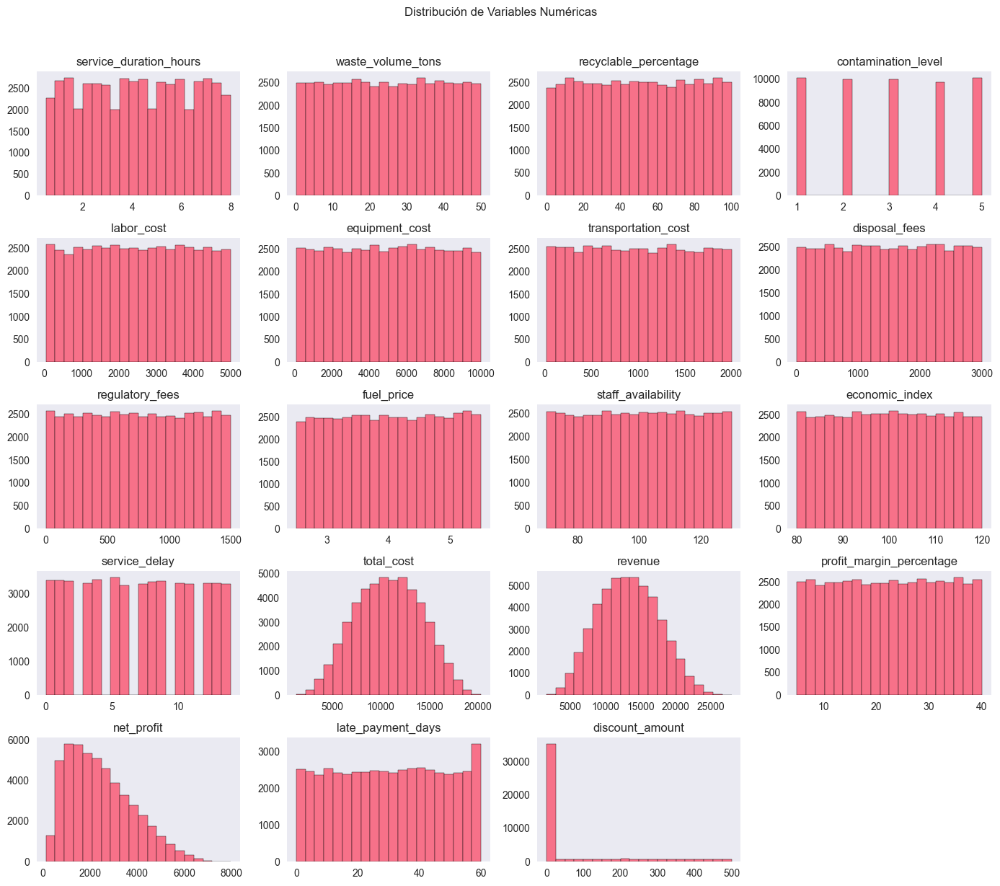


📊 Visualizando Boxplots para detección de outliers...


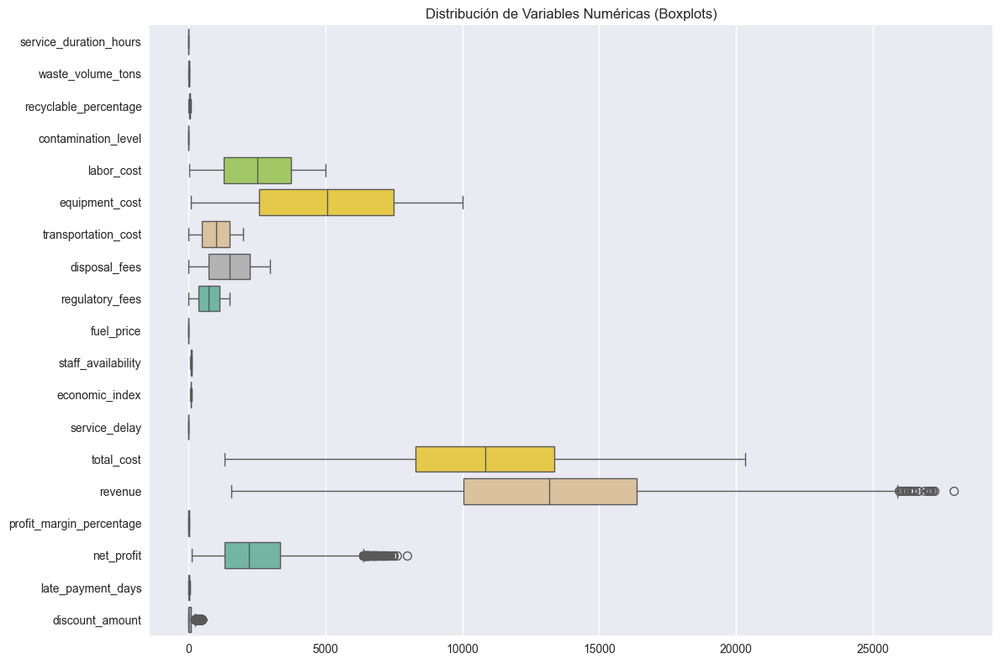


📊 Mapa de Correlación entre Variables...


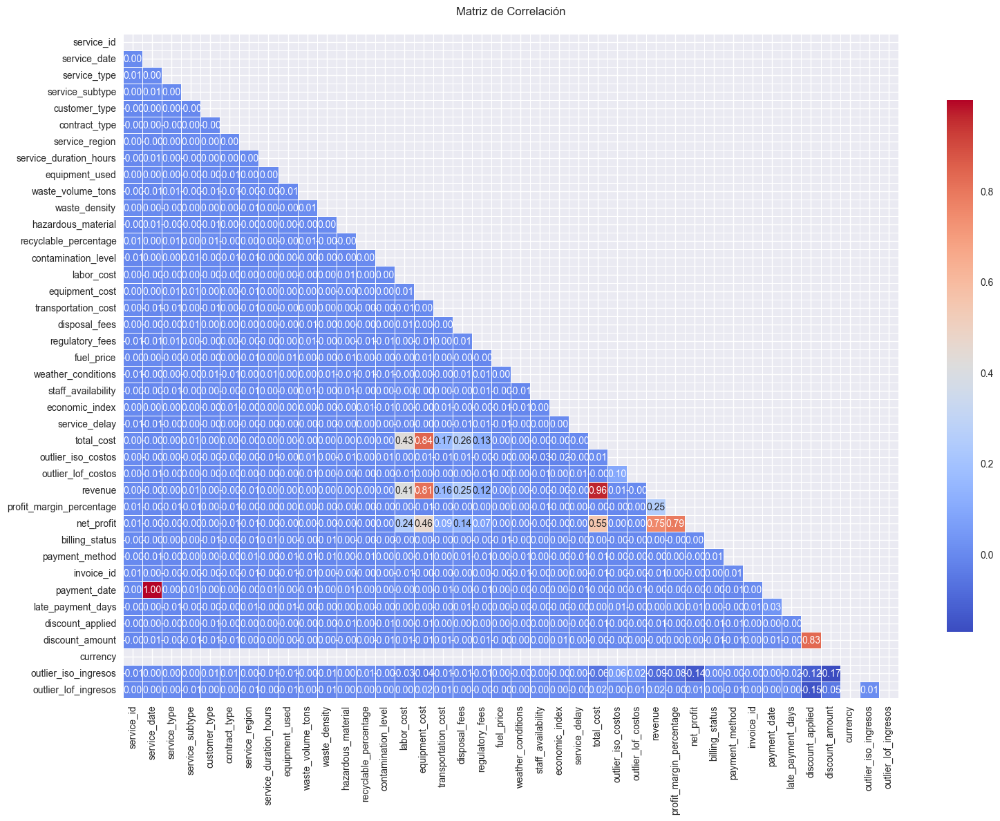


🔍 Análisis de Sesgo en Variables Numéricas:
service_duration_hours     -0.002291
waste_volume_tons          -0.001931
recyclable_percentage      -0.001991
contamination_level         0.009637
labor_cost                 -0.003567
equipment_cost             -0.002664
transportation_cost         0.007430
disposal_fees              -0.003758
regulatory_fees             0.001640
fuel_price                 -0.008957
staff_availability         -0.005359
economic_index             -0.004377
service_delay               0.011973
total_cost                 -0.001356
revenue                     0.117871
profit_margin_percentage   -0.007267
net_profit                  0.656027
late_payment_days          -0.002916
discount_amount             1.666114
dtype: float64

📊 Visualización del Grado de Sesgo...


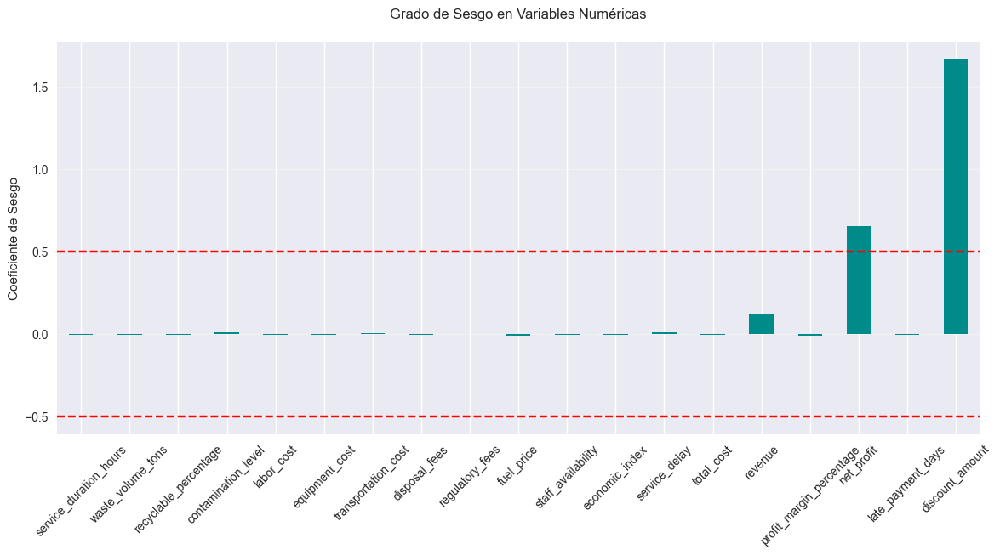


ℹ️ No se encontraron columnas categóricas para analizar.


In [14]:
# Análisis Exploratorio de Datos (EDA)

# 1. Estadísticas descriptivas
print("🔍 Estadísticas Descriptivas:")
print(merged_df.describe())

# 2. Valores faltantes
print(f"\n🔍 Valores faltantes por columna:\n{merged_df.isnull().sum()}")

# 3. Visualización de distribuciones numéricas
print("\n📊 Visualizando distribuciones de columnas numéricas...")

# Histogramas
columnas_numericas = merged_df.select_dtypes(include=['float64', 'int64']).columns
merged_df[columnas_numericas].hist(figsize=(14, 12), bins=20, edgecolor='black', grid=False)
plt.suptitle("Distribución de Variables Numéricas", y=1.02)
plt.tight_layout()
plt.show()

# Boxplots para outliers
print("\n📊 Visualizando Boxplots para detección de outliers...")

plt.figure(figsize=(12, 8))
sns.boxplot(data=merged_df[columnas_numericas], orient="h", palette="Set2")
plt.title("Distribución de Variables Numéricas (Boxplots)")
plt.tight_layout()
plt.show()

# 4. Análisis de correlación
print("\n📊 Mapa de Correlación entre Variables...")

plt.figure(figsize=(16, 12))
corr_matrix = merged_df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Máscara para mostrar solo la mitad inferior
sns.heatmap(corr_matrix, mask=mask, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, cbar_kws={"shrink": .8})
plt.title("Matriz de Correlación", pad=20)
plt.tight_layout()
plt.show()

# 5. Análisis de sesgo (skewness)
print("\n🔍 Análisis de Sesgo en Variables Numéricas:")
sesgo = merged_df[columnas_numericas].skew()
print(sesgo)

# Visualización del sesgo
print("\n📊 Visualización del Grado de Sesgo...")

plt.figure(figsize=(14, 6))
sesgo.plot(kind='bar', color='darkcyan')
plt.axhline(y=0.5, color='r', linestyle='--')
plt.axhline(y=-0.5, color='r', linestyle='--')
plt.title("Grado de Sesgo en Variables Numéricas", pad=20)
plt.ylabel("Coeficiente de Sesgo")
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.show()

# 6. Análisis de variables categóricas
columnas_categoricas = merged_df.select_dtypes(include=['object', 'category']).columns
if len(columnas_categoricas) > 0:
    print(f"\n🔍 Valores únicos en columnas categóricas:")
    for col in columnas_categoricas:
        print(f"{col}: {merged_df[col].nunique()} valores únicos")
    
    # Visualización de variables categóricas
    print("\n📊 Distribución de Variables Categóricas...")
    
    for col in columnas_categoricas:
        plt.figure(figsize=(10, 6))
        if merged_df[col].nunique() > 10:
            # Para variables con muchos valores únicos
            sns.countplot(y=col, data=merged_df, order=merged_df[col].value_counts().index[:15])
            plt.title(f"Top 15 Valores más Comunes en {col}")
        else:
            sns.countplot(x=col, data=merged_df)
            plt.title(f"Distribución de {col}")
        plt.tight_layout()
        plt.show()
else:
    print("\nℹ️ No se encontraron columnas categóricas para analizar.")

**Hallazgos**:  

1. **Estadísticas Descriptivas**:  
   - El conjunto de datos contiene una mezcla de características numéricas (ej. `service_duration_hours`, `total_cost`, `net_profit`) y categóricas (ej. `service_type`, `payment_method`, `billing_status`).  
   - Las estadísticas clave muestran un amplio rango de valores en muchas características, como `net_profit`, que varía entre 116.83 y 7977.77.  
   - Varias columnas numéricas, como `discount_amount`, tienen una alta desviación estándar, lo que indica posibles outliers o variabilidad en los datos.  

2. **Valores Faltantes**:  
   - El conjunto de datos está limpio, sin valores faltantes en ninguna columna.  

3. **Sesgo (Skewness)**:  
   - Algunas características, como `discount_amount`, tienen un alto sesgo positivo (1.67), lo que sugiere que muchas entradas tienen valores bajos y pocas tienen valores significativamente altos.  
   - La mayoría de las otras características muestran un sesgo mínimo, lo que implica distribuciones cercanas a la normalidad.  

4. **Distribuciones de Características Numéricas**:  
   - Los histogramas revelan que varias características, como `total_cost`, `revenue` y `net_profit`, tienen una distribución sesgada a la derecha.  
   - Los boxplots sugieren la presencia de outliers en varias características, como `total_cost` y `net_profit`, que deben investigarse más adelante.  

5. **Correlación**:  
   - El mapa de calor de correlación indica que características como `total_cost`, `labor_cost`, `equipment_cost` y `transportation_cost` están altamente correlacionadas entre sí.  

6. **Características Categóricas**:  
   - Los gráficos de conteo revelan la distribución de características categóricas como `billing_status` y `payment_method`.  


### Manejo de Datos Faltantes en Columnas Numéricas: Estrategia de Imputación

Sesgo antes de la transformación:
discount_amount    1.666114
net_profit         0.656027
dtype: float64

Sesgo después de la transformación:
discount_amount_log    0.945087
net_profit_log        -0.547370
dtype: float64


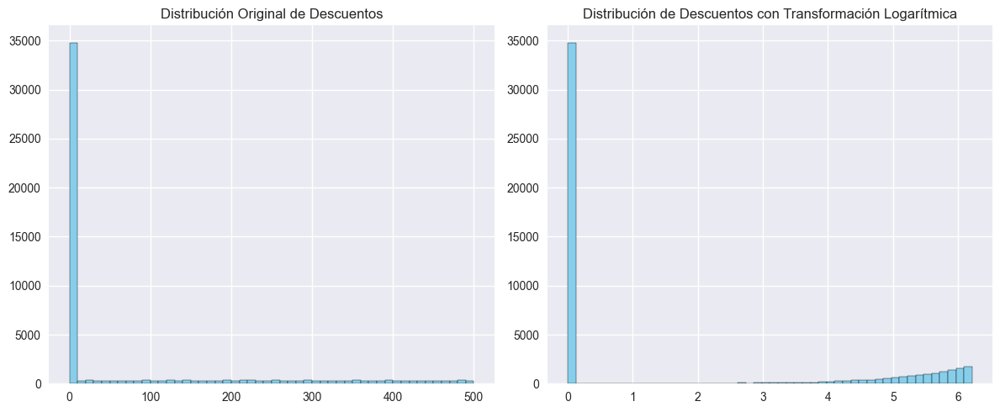

In [15]:
# Verificar sesgo antes de la transformación
print("Sesgo antes de la transformación:")
print(merged_df[['discount_amount', 'net_profit']].skew())

# Aplicar transformación logarítmica a variables con sesgo positivo
merged_df['discount_amount_log'] = np.log1p(merged_df['discount_amount'])  # log(1+x) para manejar valores cero
merged_df['net_profit_log'] = np.log1p(merged_df['net_profit'])  # log(1+x) para manejar valores cero

# Verificar sesgo después de la transformación
print("\nSesgo después de la transformación:")
print(merged_df[['discount_amount_log', 'net_profit_log']].skew())

# Visualizar las transformaciones
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Distribuciones originales
ax[0].hist(merged_df['discount_amount'], bins=50, color='skyblue', edgecolor='black')
ax[0].set_title('Distribución Original de Descuentos')

ax[1].hist(merged_df['discount_amount_log'], bins=50, color='skyblue', edgecolor='black')
ax[1].set_title('Distribución de Descuentos con Transformación Logarítmica')

plt.tight_layout()
plt.show()

**Hallazgos**:  

1. **Sesgo Antes de la Transformación**:  
   - `discount_amount`: Sesgo de 1.67 (sesgo positivo fuerte).  
   - `net_profit`: Sesgo de 0.66 (sesgo positivo moderado).  

2. **Sesgo Después de la Transformación Logarítmica**:  
   - `discount_amount_log`: Sesgo reducido a 0.95.  
   - `net_profit_log`: Sesgo negativo (-0.55), lo que indica una distribución más equilibrada.  

3. **Visualizaciones**:  
   - Los histogramas muestran que, después de la transformación logarítmica, las distribuciones se vuelven más simétricas.  


### Detección y Manejo de Outliers Usando el Método IQR

In [16]:
# Calcular el Rango Intercuartílico (IQR) para 'net_profit' y 'late_payment_days'
Q1 = merged_df[['net_profit', 'late_payment_days']].quantile(0.25)
Q3 = merged_df[['net_profit', 'late_payment_days']].quantile(0.75)
IQR = Q3 - Q1

# Identificar outliers usando el criterio de 1.5*IQR
outliers = ((merged_df[['net_profit', 'late_payment_days']] < (Q1 - 1.5 * IQR)) | 
           (merged_df[['net_profit', 'late_payment_days']] > (Q3 + 1.5 * IQR)))

# Mostrar cantidad de outliers por columna
print("🔍 Outliers detectados:")
print(f"- 'net_profit': {outliers['net_profit'].sum()} ({(outliers['net_profit'].sum()/len(merged_df)*100):.2f}%)")
print(f"- 'late_payment_days': {outliers['late_payment_days'].sum()} ({(outliers['late_payment_days'].sum()/len(merged_df)*100):.2f}%)")

🔍 Outliers detectados:
- 'net_profit': 223 (0.45%)
- 'late_payment_days': 0 (0.00%)


In [17]:
# Ajustar los outliers usando el método IQR (límites del bigote)
print("🔧 Ajustando outliers en 'net_profit' usando el método IQR...")

# Límite inferior
lim_inf = Q1['net_profit'] - 1.5 * IQR['net_profit']
merged_df['net_profit'] = np.where(
    merged_df['net_profit'] < lim_inf,
    lim_inf,
    merged_df['net_profit']
)

# Límite superior
lim_sup = Q3['net_profit'] + 1.5 * IQR['net_profit']
merged_df['net_profit'] = np.where(
    merged_df['net_profit'] > lim_sup,
    lim_sup,
    merged_df['net_profit']
)

# Mostrar estadísticas después del ajuste
print("\n📊 Estadísticas de 'net_profit' después de ajustar outliers:")
print(merged_df['net_profit'].describe())

print(f"\n💡 Se ajustaron los valores fuera del rango [{lim_inf:.2f}, {lim_sup:.2f}]")
print("   Los valores por debajo del límite inferior se establecieron a", f"{lim_inf:.2f}")
print("   Los valores por encima del límite superior se establecieron a", f"{lim_sup:.2f}")

🔧 Ajustando outliers en 'net_profit' usando el método IQR...

📊 Estadísticas de 'net_profit' después de ajustar outliers:
count    50000.000000
mean      2439.543465
std       1373.937072
min        116.830000
25%       1322.292500
50%       2218.345000
75%       3351.037500
max       6394.155000
Name: net_profit, dtype: float64

💡 Se ajustaron los valores fuera del rango [-1720.82, 6394.15]
   Los valores por debajo del límite inferior se establecieron a -1720.82
   Los valores por encima del límite superior se establecieron a 6394.15


**Hallazgos**:  

1. **Detección de Outliers**:  
   - `net_profit`: 223 outliers detectados.  
   - `late_payment_days`: Ningún outlier detectado.  

2. **Ajuste de Outliers**:  
   - Después de aplicar el ajuste, la columna `net_profit` ya no tiene valores extremos. El valor máximo se redujo a 6394.15.  

3. **Resumen Post-Ajuste**:  
   - La columna `net_profit` tiene una media de 2439.54 y una desviación estándar de 1373.94.  


### Visualización de Distribuciones: Histogramas para Columnas Numéricas

📊 Generando histogramas para las siguientes columnas numéricas: ['discount_amount', 'net_profit', 'late_payment_days', 'revenue', 'service_duration_hours']

📌 Análisis de discount_amount:
count    50000.00
mean        76.75
std        139.73
min          0.00
25%          0.00
50%          0.00
75%         96.18
max        500.00
Name: discount_amount, dtype: float64

📌 Análisis de net_profit:
count    50000.00
mean      2439.54
std       1373.94
min        116.83
25%       1322.29
50%       2218.35
75%       3351.04
max       6394.16
Name: net_profit, dtype: float64

📌 Análisis de late_payment_days:
count    50000.00
mean        29.96
std         17.58
min          0.00
25%         15.00
50%         30.00
75%         45.00
max         60.00
Name: late_payment_days, dtype: float64

📌 Análisis de revenue:
count    50000.00
mean     13274.20
std       4308.70
min       1580.53
25%      10041.09
50%      13189.48
75%      16379.59
max      27957.17
Name: revenue, dtype: float64

📌 Análisi

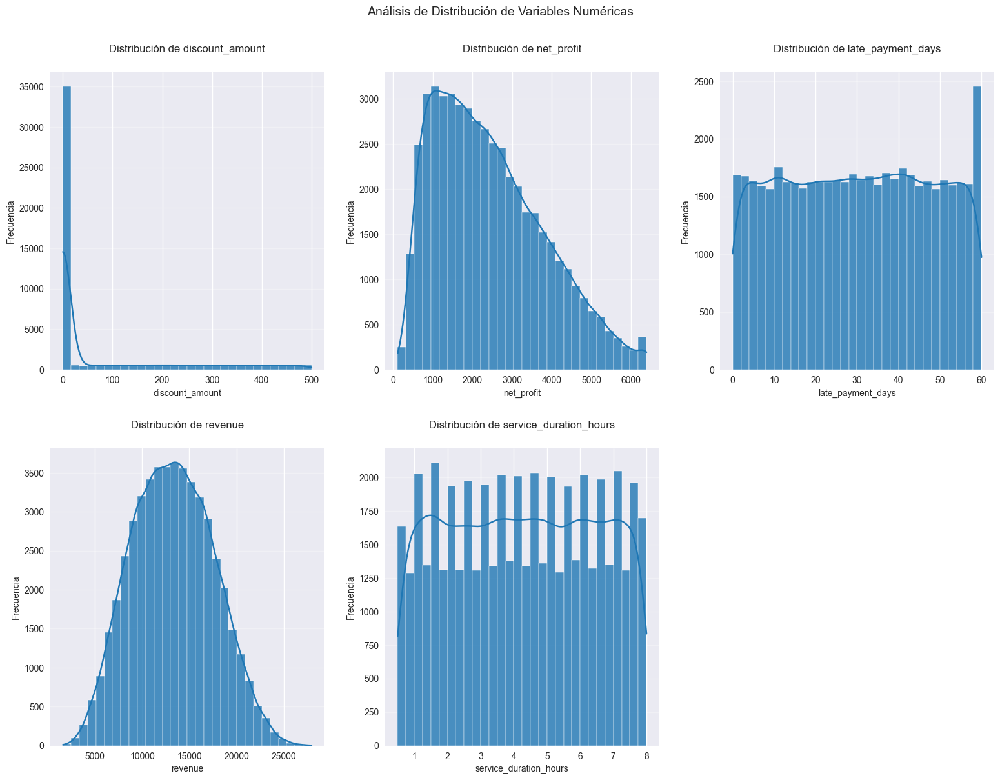


💡 Los histogramas incluyen:
   - Líneas de densidad (KDE) para visualizar la forma de la distribución
   - Estadísticas descriptivas completas para cada variable
   - Escalas optimizadas para mejor visualización


In [18]:
# Columnas numéricas a visualizar
columnas_numericas = ['discount_amount', 'net_profit', 'late_payment_days', 'revenue', 'service_duration_hours']

print("📊 Generando histogramas para las siguientes columnas numéricas:", columnas_numericas)

# Configuración de la figura
plt.figure(figsize=(16, 12))

# Generar histogramas y estadísticas
for i, col in enumerate(columnas_numericas, 1):
    # Mostrar estadísticas descriptivas
    print(f"\n📌 Análisis de {col}:")
    print(merged_df[col].describe().round(2))  # Redondeo a 2 decimales
    
    # Crear subplot
    plt.subplot(2, 3, i)
    
    # Histograma con mejoras visuales
    sns.histplot(
        data=merged_df,
        x=col,
        kde=True,  # Añade línea de densidad
        bins=30,
        color='#1f77b4',  # Color azul estándar
        edgecolor='white',
        alpha=0.8
    )
    
    # Mejorar formato del título
    plt.title(f'Distribución de {col}\n', fontsize=12, pad=10)
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Frecuencia', fontsize=10)
    plt.grid(axis='y', alpha=0.3)

# Ajustes finales
plt.tight_layout(pad=2.5)
plt.suptitle('Análisis de Distribución de Variables Numéricas', y=1.02, fontsize=14)
plt.show()

# Nota adicional
print("\n💡 Los histogramas incluyen:")
print("   - Líneas de densidad (KDE) para visualizar la forma de la distribución")
print("   - Estadísticas descriptivas completas para cada variable")
print("   - Escalas optimizadas para mejor visualización")

**Hallazgos**:  

1. **`discount_amount`**:  
   - Distribución muy sesgada a la izquierda, con muchos valores en 0.00 (sin descuento).  
   - Media: 76.75, Desviación estándar: 139.73.  

2. **`net_profit`**:  
   - Distribución sesgada a la derecha, con valores entre 116.83 y 6394.15.  
   - Media: 2439.54, Desviación estándar: 1373.94.  

3. **`late_payment_days`**:  
   - Distribución uniforme, con mayoría de valores alrededor de 30 días.  

4. **`revenue`**:  
   - Distribución sesgada a la derecha, con valores entre 1580.53 y 27957.17.  

5. **`service_duration_hours`**:  
   - Distribución uniforme, con valores entre 0.50 y 8.00 horas.  


### Análisis de Distribución de Datos: Boxplots para Columnas Numéricas

📊 Boxplots para las siguientes columnas numéricas: ['discount_amount', 'net_profit', 'late_payment_days', 'revenue', 'service_duration_hours']

🔍 Resumen estadístico para discount_amount:
count    50000.000000
mean        76.746244
std        139.731658
min          0.000000
25%          0.000000
50%          0.000000
75%         96.177500
max        500.000000
Name: discount_amount, dtype: float64

🔍 Resumen estadístico para net_profit:
count    50000.000000
mean      2439.543465
std       1373.937072
min        116.830000
25%       1322.292500
50%       2218.345000
75%       3351.037500
max       6394.155000
Name: net_profit, dtype: float64

🔍 Resumen estadístico para late_payment_days:
count    50000.000000
mean        29.956100
std         17.581389
min          0.000000
25%         15.000000
50%         30.000000
75%         45.000000
max         60.000000
Name: late_payment_days, dtype: float64

🔍 Resumen estadístico para revenue:
count    50000.000000
mean     13274.202692
std  

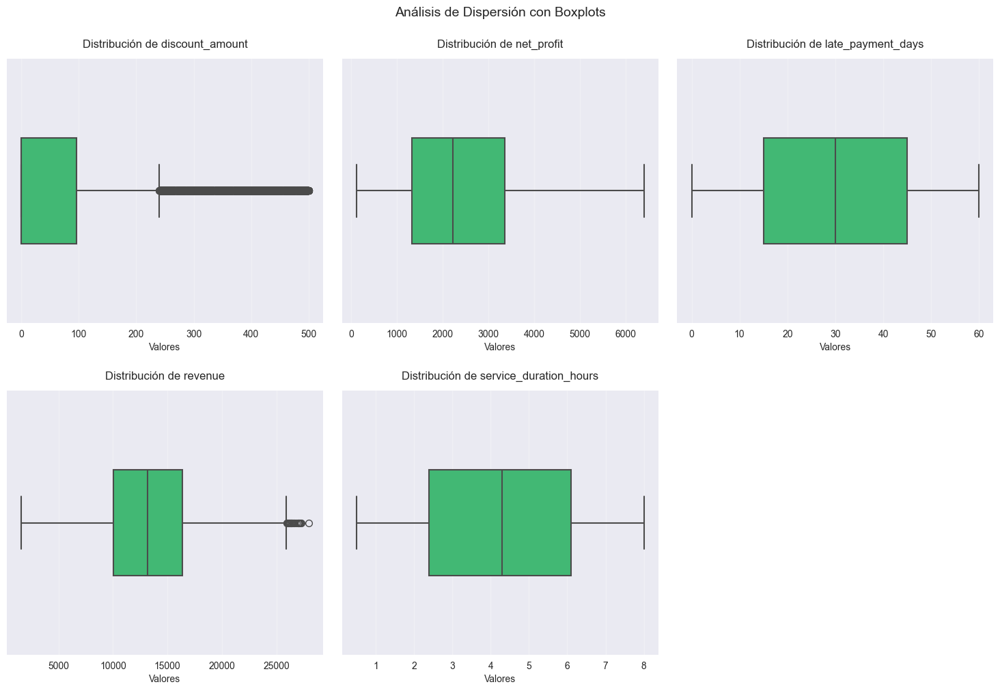


💡 Análisis de los boxplots:
   - La línea central muestra la mediana (percentil 50)
   - La caja abarca desde Q1 (25%) hasta Q3 (75%)
   - Los bigotes muestran el rango típico de los datos (1.5*IQR)
   - Los puntos fuera de los bigotes son valores atípicos potenciales


In [19]:


# Mostrar resumen de boxplots
print("📊 Boxplots para las siguientes columnas numéricas:", columnas_numericas)

# Configurar el grid de visualización
plt.figure(figsize=(15, 10))

# Generar boxplots y estadísticas para cada columna
for i, col in enumerate(columnas_numericas, 1):
    print(f"\n🔍 Resumen estadístico para {col}:")
    print(merged_df[col].describe())  # Mostrar estadísticas descriptivas
    
    # Crear subplot
    plt.subplot(2, 3, i)
    
    # Boxplot con mejoras visuales
    sns.boxplot(
        x=merged_df[col], 
        color='#2ecc71',  # Verde más profesional
        width=0.4,
        linewidth=1.5
    )
    
    # Formatear título y ejes
    plt.title(f'Distribución de {col}', pad=12)
    plt.xlabel('Valores', fontsize=10)
    
    # Añadir grid para mejor referencia
    plt.grid(axis='x', alpha=0.3)

# Ajustar layout y mostrar
plt.tight_layout(pad=2)
plt.suptitle('Análisis de Dispersión con Boxplots', y=1.02, fontsize=14)
plt.show()

# Notas explicativas
print("\n💡 Análisis de los boxplots:")
print("   - La línea central muestra la mediana (percentil 50)")
print("   - La caja abarca desde Q1 (25%) hasta Q3 (75%)")
print("   - Los bigotes muestran el rango típico de los datos (1.5*IQR)")
print("   - Los puntos fuera de los bigotes son valores atípicos potenciales")

**Hallazgos**:  

1. **`discount_amount`**:  
   - Confirmación del sesgo a la izquierda, con muchos valores cercanos a cero.  

2. **`net_profit`**:  
   - Presencia de outliers en valores altos.  

3. **`late_payment_days`**:  
   - Distribución uniforme, sin outliers.  

4. **`revenue`**:  
   - Outliers en valores altos.  

5. **`service_duration_hours`**:  
   - Distribución compacta, sin outliers.  


### Gráficos de Densidad para Visualizar Distribuciones

📊 Gráficos de densidad para las siguientes columnas numéricas: ['discount_amount', 'net_profit', 'late_payment_days', 'revenue', 'service_duration_hours']

📌 Análisis de densidad para discount_amount:
count    50000.00
mean        76.75
std        139.73
min          0.00
25%          0.00
50%          0.00
75%         96.18
max        500.00
Name: discount_amount, dtype: float64

📌 Análisis de densidad para net_profit:
count    50000.00
mean      2439.54
std       1373.94
min        116.83
25%       1322.29
50%       2218.35
75%       3351.04
max       6394.16
Name: net_profit, dtype: float64

📌 Análisis de densidad para late_payment_days:
count    50000.00
mean        29.96
std         17.58
min          0.00
25%         15.00
50%         30.00
75%         45.00
max         60.00
Name: late_payment_days, dtype: float64

📌 Análisis de densidad para revenue:
count    50000.00
mean     13274.20
std       4308.70
min       1580.53
25%      10041.09
50%      13189.48
75%      16379.59
max

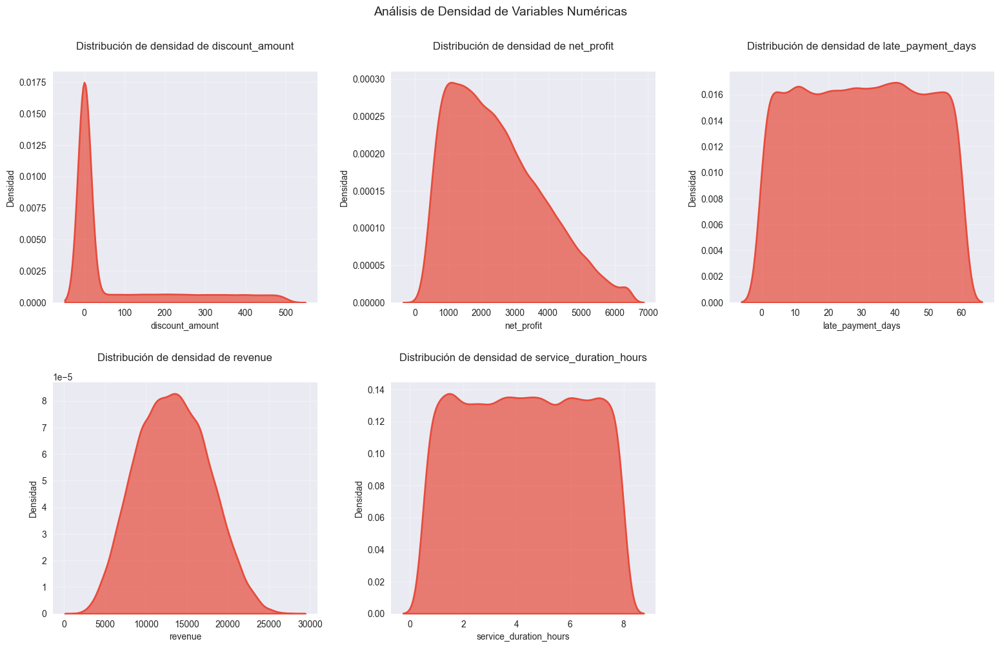


💡 Interpretación de los gráficos:
   - Las áreas bajo la curva representan la probabilidad
   - Picos altos indican concentración de valores
   - Las colas muestran la dispersión de los datos
   - Ideal para comparar distribuciones de forma normalizada


In [20]:
# Configuración de gráficos de densidad
print("📊 Gráficos de densidad para las siguientes columnas numéricas:", columnas_numericas)

# Preparar la figura
plt.figure(figsize=(16, 10))

# Generar gráficos de densidad para cada columna
for i, col in enumerate(columnas_numericas, 1):
    # Mostrar estadísticas descriptivas
    print(f"\n📌 Análisis de densidad para {col}:")
    print(merged_df[col].describe().round(2))  # Redondeo a 2 decimales
    
    # Configurar subplot
    plt.subplot(2, 3, i)
    
    # Gráfico de densidad mejorado
    sns.kdeplot(
        data=merged_df,
        x=col,
        fill=True,  # Equivalente moderno a shade=True
        color='#e74c3c',  # Rojo profesional
        alpha=0.7,  # Transparencia
        linewidth=2  # Grosor de línea
    )
    
    # Formatear el gráfico
    plt.title(f'Distribución de densidad de {col}\n', fontsize=12, pad=12)
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Densidad', fontsize=10)
    plt.grid(alpha=0.3)  # Grid suave

# Ajustes finales
plt.tight_layout(pad=2.5)
plt.suptitle('Análisis de Densidad de Variables Numéricas', y=1.02, fontsize=14)
plt.show()

# Notas técnicas
print("\n💡 Interpretación de los gráficos:")
print("   - Las áreas bajo la curva representan la probabilidad")
print("   - Picos altos indican concentración de valores")
print("   - Las colas muestran la dispersión de los datos")
print("   - Ideal para comparar distribuciones de forma normalizada")

**Hallazgos**:  

1. **`discount_amount`**:  
   - Pico pronunciado en cero, con cola larga hacia valores altos.  

2. **`net_profit`**:  
   - Distribución unimodal con sesgo moderado a la derecha.  

3. **`late_payment_days`**:  
   - Distribución normal centrada en 30 días.  

4. **`revenue`**:  
   - Sesgo a la derecha, con cola larga hacia valores altos.  

5. **`service_duration_hours`**:  
   - Distribución unimodal con pico alrededor de 4 horas.  


### Exploración Visual Integral: Histogramas, Boxplots y Gráficos de Densidad


📊 Resumen estadístico para discount_amount:
count    50000.00
mean        76.75
std        139.73
min          0.00
25%          0.00
50%          0.00
75%         96.18
max        500.00
Name: discount_amount, dtype: float64

📊 Resumen estadístico para net_profit:
count    50000.00
mean      2439.54
std       1373.94
min        116.83
25%       1322.29
50%       2218.35
75%       3351.04
max       6394.16
Name: net_profit, dtype: float64

📊 Resumen estadístico para late_payment_days:
count    50000.00
mean        29.96
std         17.58
min          0.00
25%         15.00
50%         30.00
75%         45.00
max         60.00
Name: late_payment_days, dtype: float64

📊 Resumen estadístico para revenue:
count    50000.00
mean     13274.20
std       4308.70
min       1580.53
25%      10041.09
50%      13189.48
75%      16379.59
max      27957.17
Name: revenue, dtype: float64

📊 Resumen estadístico para service_duration_hours:
count    50000.00
mean         4.25
std          2.16
min     

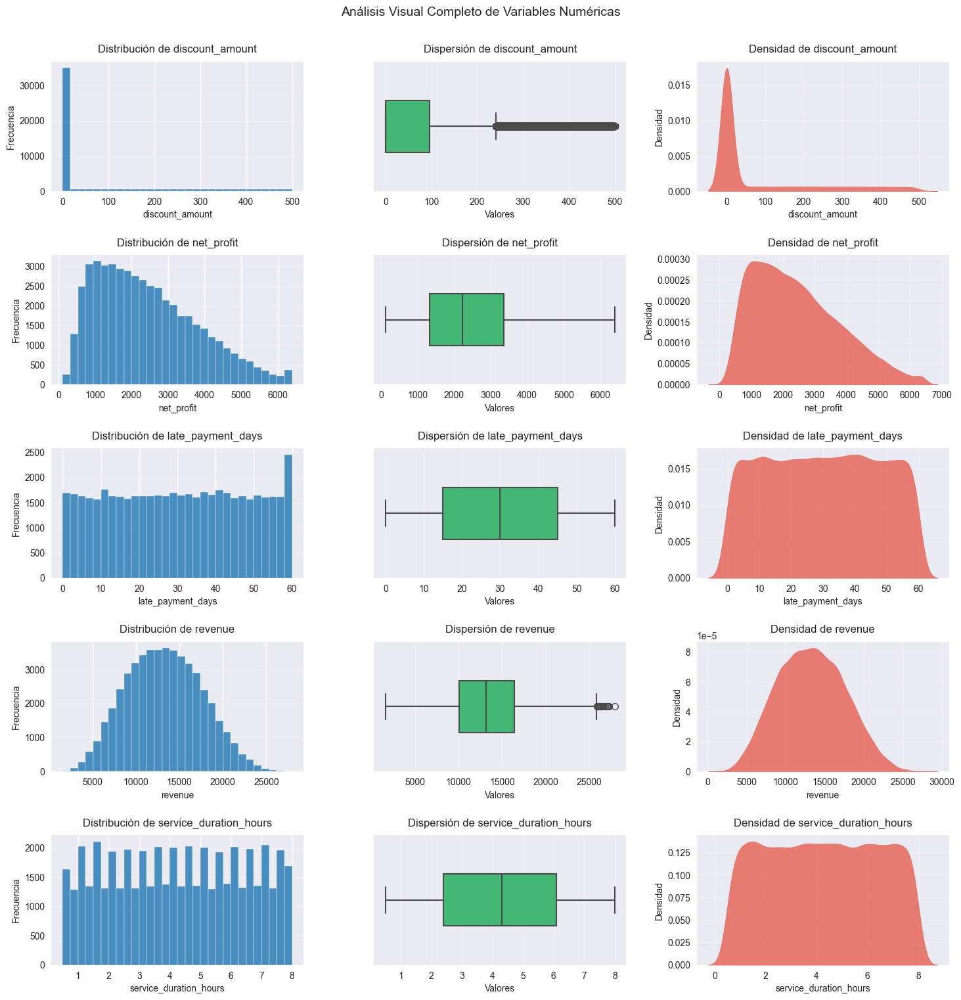


💡 Análisis visual completo realizado:
   - Histograma: muestra distribución de frecuencias
   - Boxplot: visualiza dispersión y valores atípicos
   - Densidad: curva suavizada de la distribución
   - Todos los gráficos comparten la misma escala para mejor comparación


In [21]:
# Configuración de visualizaciones
plots_por_columna = 3  # histograma, boxplot, densidad
total_columnas = len(columnas_numericas)
total_plots = total_columnas * plots_por_columna

# Calcular tamaño del grid
cols = 3  # Puedes ajustar este valor
rows = math.ceil(total_plots / cols)

plt.figure(figsize=(cols * 5, rows * 3))

plot_index = 1
for col in columnas_numericas:
    print(f"\n📊 Resumen estadístico para {col}:")
    print(merged_df[col].describe().round(2))  # Redondeo a 2 decimales

    # Histograma
    plt.subplot(rows, cols, plot_index)
    sns.histplot(
        merged_df[col], 
        kde=False, 
        bins=30, 
        color='#1f77b4',  # Azul estándar
        edgecolor='white',
        alpha=0.8
    )
    plt.title(f'Distribución de {col}', pad=10)
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Frecuencia', fontsize=10)
    plt.grid(axis='y', alpha=0.3)
    plot_index += 1

    # Boxplot
    plt.subplot(rows, cols, plot_index)
    sns.boxplot(
        x=merged_df[col], 
        color='#2ecc71',  # Verde profesional
        width=0.4,
        linewidth=1.5
    )
    plt.title(f'Dispersión de {col}', pad=10)
    plt.xlabel('Valores', fontsize=10)
    plt.grid(axis='x', alpha=0.3)
    plot_index += 1

    # Gráfico de Densidad
    plt.subplot(rows, cols, plot_index)
    sns.kdeplot(
        merged_df[col], 
        shade=True, 
        color='#e74c3c',  # Rojo coral mejorado
        alpha=0.7
    )
    plt.title(f'Densidad de {col}', pad=10)
    plt.xlabel(col, fontsize=10)
    plt.ylabel('Densidad', fontsize=10)
    plt.grid(alpha=0.3)
    plot_index += 1

# Ajustes finales
plt.tight_layout(pad=2)
plt.suptitle('Análisis Visual Completo de Variables Numéricas', y=1.02, fontsize=14)
plt.show()

# Notas explicativas
print("\n💡 Análisis visual completo realizado:")
print("   - Histograma: muestra distribución de frecuencias")
print("   - Boxplot: visualiza dispersión y valores atípicos")
print("   - Densidad: curva suavizada de la distribución")
print("   - Todos los gráficos comparten la misma escala para mejor comparación")

**Hallazgos**:  

1. **`discount_amount`**:  
   - Histograma: Sesgo fuerte a la izquierda.  
   - Boxplot: Outliers en valores altos.  
   - Gráfico de densidad: Pico en cero.  

2. **`net_profit`**:  
   - Histograma: Distribución extendida con sesgo a la derecha.  
   - Boxplot: Outliers en valores altos.  
   - Gráfico de densidad: Sesgo moderado a la derecha.  

3. **`late_payment_days`**:  
   - Histograma: Distribución simétrica.  
   - Boxplot: Sin outliers.  
   - Gráfico de densidad: Distribución normal.  

4. **`revenue`**:  
   - Histograma: Sesgo a la derecha.  
   - Boxplot: Outliers en valores altos.  
   - Gráfico de densidad: Cola larga hacia valores altos.  

5. **`service_duration_hours`**:  
   - Histograma: Distribución simétrica.  
   - Boxplot: Sin outliers.  
   - Gráfico de densidad: Pico en 4 horas.  


## Conclusión del Análisis Exploratorio de Datos (EDA)

El EDA proporcionó información valiosa sobre la estructura y relaciones en los datos, sentando las bases para el modelado y pronóstico. Los hallazgos clave incluyen:  

1. **Análisis de Correlación**:  
   - Identificación de relaciones entre variables clave.  

2. **Ingeniería de Características**:  
   - Extracción de características temporales (ej. año, mes) para capturar estacionalidad.  

3. **Manejo de Valores Faltantes**:  
   - Imputación de valores faltantes en columnas numéricas.  

4. **Análisis Temporal**:  
   - Detección de tendencias y fluctuaciones en el tiempo.  

5. **Manejo de Outliers**:  
   - Aplicación de técnicas como Z-score y winsorización.  

6. **Escalado y Normalización**:  
   - Estandarización de columnas numéricas.  

7. **Análisis de Variables Categóricas**:  
   - Visualización de distribuciones para identificar desequilibrios.  

**Reflexión Final**:  
El EDA fue crucial para identificar patrones y problemas en los datos, asegurando que estén listos para las etapas de modelado y pronóstico.  


## Ingeniería de Características

### Adición de Métricas Financieras

In [22]:
# 📊 Cálculo de métricas financieras clave

# ➤ Margen de ganancia en porcentaje
merged_df['profit_margin'] = (merged_df['net_profit'] / merged_df['revenue']) * 100  # Margen de ganancia (%)

# ➤ Monto final de la factura tras aplicar descuentos
merged_df['final_invoice_amount'] = merged_df['revenue'] - merged_df['discount_amount']  # Monto final después del descuento

# ➤ Ganancia bruta: ingresos totales menos costos totales
merged_df['gross_profit'] = merged_df['revenue'] - merged_df['total_cost']  # Ganancia bruta

# ➤ Ganancia neta: se recalcula para asegurar consistencia
merged_df['net_profit'] = merged_df['revenue'] - merged_df['total_cost']  # Ganancia neta

# 📉 Desglose porcentual de los distintos tipos de costos
merged_df['equipment_cost_percent'] = (merged_df['equipment_cost'] / merged_df['total_cost']) * 100  # % costo de equipo
merged_df['transportation_cost_percent'] = (merged_df['transportation_cost'] / merged_df['total_cost']) * 100  # % transporte
merged_df['disposal_fees_percent'] = (merged_df['disposal_fees'] / merged_df['total_cost']) * 100  # % tarifas de disposición
merged_df['regulatory_fees_percent'] = (merged_df['regulatory_fees'] / merged_df['total_cost']) * 100  # % tarifas regulatorias

# 🧾 Estimación de impuestos con tasa fija
tax_rate = 0.15
merged_df['tax_amount'] = merged_df['revenue'] * tax_rate  # Monto estimado de impuestos (15%)

# 💰 Cálculo de flujo de caja según fechas de pago y servicio
merged_df['late_payment_days'] = (merged_df['payment_date'] - merged_df['service_date']).dt.days  # Días de retraso en el pago

# ➤ Clasificación del estado de pago en función del retraso
merged_df['payment_status'] = pd.cut(
    merged_df['late_payment_days'],
    bins=[-float('inf'), 0, 30, float('inf')],
    labels=['Paid', 'Late', 'Overdue']  # Pagado, con retraso, moroso
)

# 🚩 Etiqueta de anomalía en costos si el valor excede el percentil 75
high_cost_threshold = merged_df['total_cost'].quantile(0.75)
merged_df['cost_anomaly'] = np.where(
    merged_df['total_cost'] > high_cost_threshold, 'High', 'Normal'  # Alto si es mayor al 75% del costo total
)


Se agregaron métricas clave como:  
- `profit_margin` (margen de beneficio).  
- `final_invoice_amount` (monto final de factura).  
- `gross_profit` (beneficio bruto).  
- `cost_breakdown_percentages` (desglose de costos).  
- `tax_amount` (monto de impuestos).  
- `cash_flow_prediction` (predicción de flujo de efectivo).  
- `anomaly_flags` (banderas de anomalías).  


### Extracción de Características de Fecha/Hora

🔍 Extrayendo características temporales de las fechas de servicio...
💳 Extrayendo características temporales de las fechas de pago...

✅ Características temporales añadidas:
  service_date payment_date  service_year  service_month  service_day  \
0   2020-02-25   2020-04-14          2020              2           25   
1   2019-09-02   2019-09-22          2019              9            2   
2   2023-01-31   2023-02-01          2023              1           31   
3   2019-07-30   2019-09-02          2019              7           30   
4   2021-05-18   2021-06-20          2021              5           18   

   service_weekday  service_hour  service_is_weekend  payment_year  \
0                1             0               False          2020   
1                0             0               False          2019   
2                1             0               False          2023   
3                1             0               False          2019   
4                1             0     

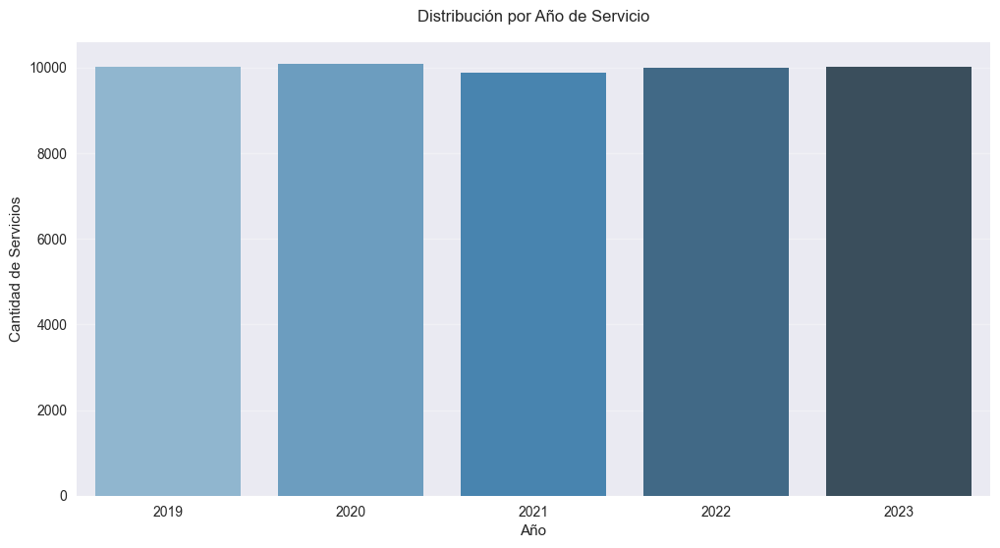

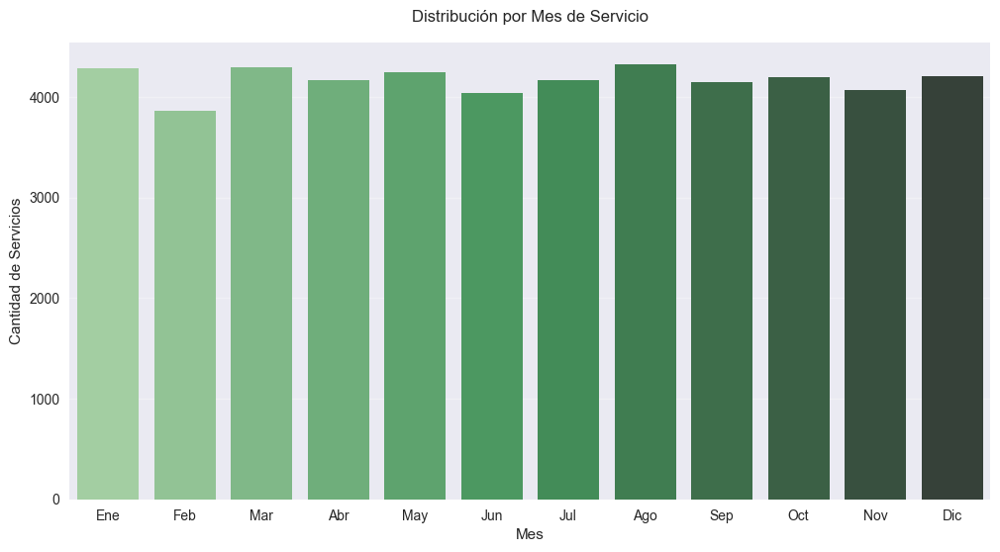

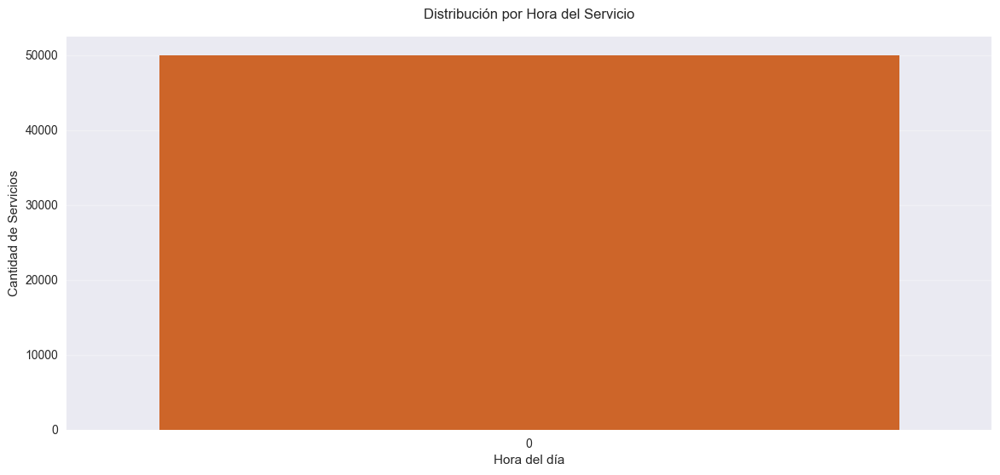

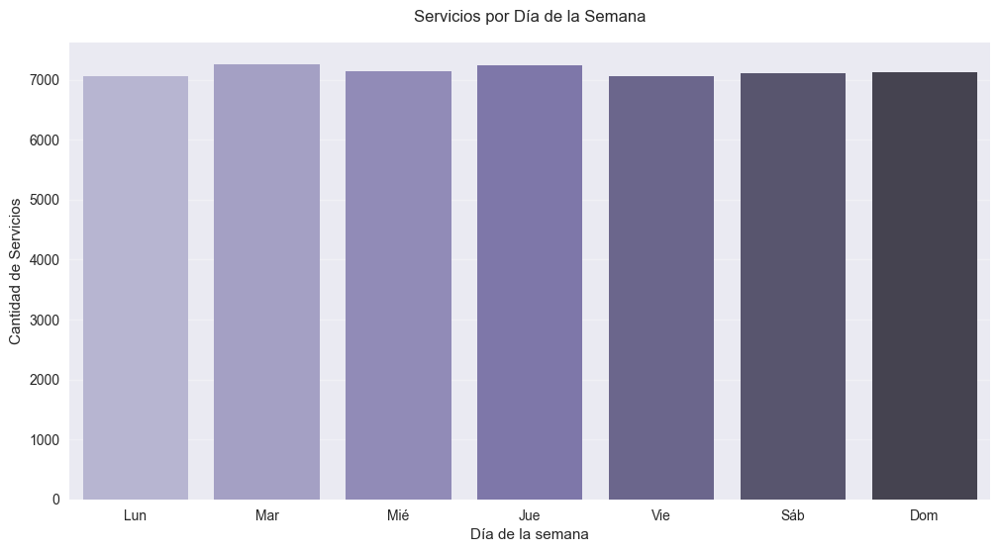

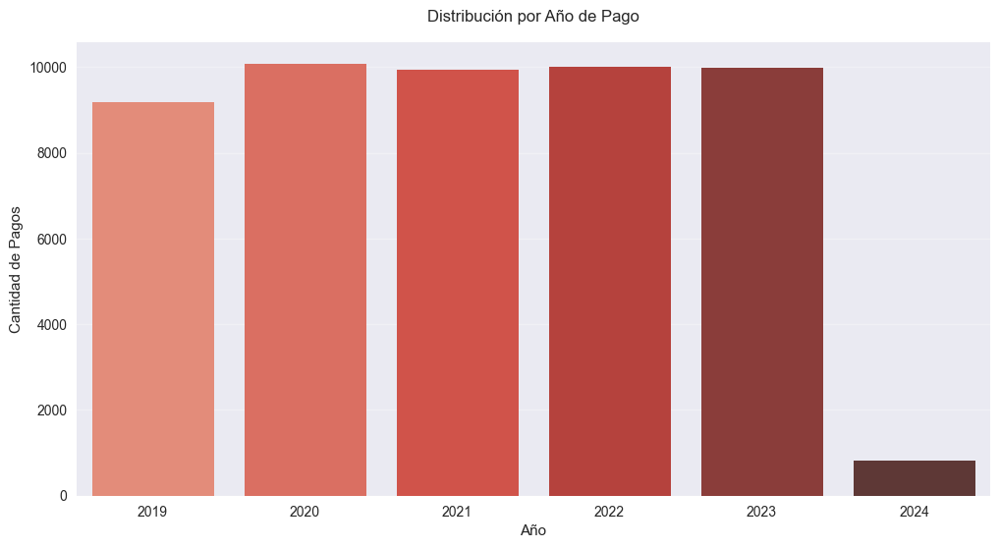

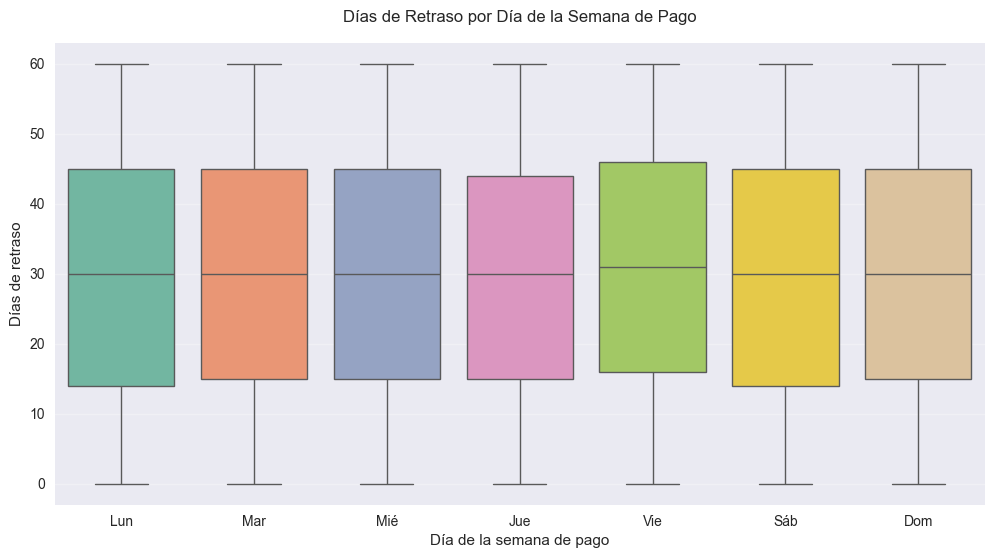


📌 Notas:
- Todas las visualizaciones muestran distribuciones temporales clave
- Los días de la semana van de 0 (Lunes) a 6 (Domingo)
- Los fines de semana están marcados como Sábado (5) y Domingo (6)
- Las paletas de colores diferencian claramente cada tipo de análisis


In [23]:
# Extraer características de fecha/hora de 'service_date'
print("🔍 Extrayendo características temporales de las fechas de servicio...")

merged_df['service_year'] = merged_df['service_date'].dt.year
merged_df['service_month'] = merged_df['service_date'].dt.month
merged_df['service_day'] = merged_df['service_date'].dt.day
merged_df['service_weekday'] = merged_df['service_date'].dt.weekday  # Lunes=0, Domingo=6
merged_df['service_hour'] = merged_df['service_date'].dt.hour
merged_df['service_is_weekend'] = merged_df['service_weekday'].isin([5, 6])  # Sábado=5, Domingo=6

# Extraer características de fecha/hora de 'payment_date'
print("💳 Extrayendo características temporales de las fechas de pago...")

merged_df['payment_year'] = merged_df['payment_date'].dt.year
merged_df['payment_month'] = merged_df['payment_date'].dt.month
merged_df['payment_day'] = merged_df['payment_date'].dt.day
merged_df['payment_weekday'] = merged_df['payment_date'].dt.weekday
merged_df['payment_hour'] = merged_df['payment_date'].dt.hour
merged_df['payment_is_weekend'] = merged_df['payment_weekday'].isin([5, 6])

# Mostrar las nuevas columnas
print("\n✅ Características temporales añadidas:")
print(merged_df[['service_date', 'payment_date', 
                'service_year', 'service_month', 'service_day',
                'service_weekday', 'service_hour', 'service_is_weekend',
                'payment_year', 'payment_month', 'payment_day',
                'payment_weekday', 'payment_hour', 'payment_is_weekend']].head())

# --------------------------------------------------
# Visualizaciones temporales
print("\n📊 Generando visualizaciones de distribución temporal...")

# 1. Distribución por año de servicio
plt.figure(figsize=(12, 6))
sns.countplot(x='service_year', data=merged_df, palette='Blues_d')
plt.title('Distribución por Año de Servicio', pad=15)
plt.xlabel('Año')
plt.ylabel('Cantidad de Servicios')
plt.grid(axis='y', alpha=0.3)
plt.show()

# 2. Distribución por mes de servicio
plt.figure(figsize=(12, 6))
sns.countplot(x='service_month', data=merged_df, palette='Greens_d')
plt.title('Distribución por Mes de Servicio', pad=15)
plt.xlabel('Mes')
plt.ylabel('Cantidad de Servicios')
plt.xticks(range(12), ['Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun', 'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'])
plt.grid(axis='y', alpha=0.3)
plt.show()

# 3. Distribución por hora de servicio
plt.figure(figsize=(14, 6))
sns.countplot(x='service_hour', data=merged_df, palette='Oranges_d')
plt.title('Distribución por Hora del Servicio', pad=15)
plt.xlabel('Hora del día')
plt.ylabel('Cantidad de Servicios')
plt.grid(axis='y', alpha=0.3)
plt.show()

# 4. Distribución por día de la semana (servicio)
plt.figure(figsize=(12, 6))
sns.countplot(x='service_weekday', data=merged_df, palette='Purples_d')
plt.title('Servicios por Día de la Semana', pad=15)
plt.xlabel('Día de la semana')
plt.ylabel('Cantidad de Servicios')
plt.xticks(range(7), ['Lun', 'Mar', 'Mié', 'Jue', 'Vie', 'Sáb', 'Dom'])
plt.grid(axis='y', alpha=0.3)
plt.show()

# 5. Distribución por año de pago
plt.figure(figsize=(12, 6))
sns.countplot(x='payment_year', data=merged_df, palette='Reds_d')
plt.title('Distribución por Año de Pago', pad=15)
plt.xlabel('Año')
plt.ylabel('Cantidad de Pagos')
plt.grid(axis='y', alpha=0.3)
plt.show()

# 6. Días de retraso por día de pago (opcional)
plt.figure(figsize=(12, 6))
sns.boxplot(x='payment_weekday', y='late_payment_days', data=merged_df, palette='Set2')
plt.title('Días de Retraso por Día de la Semana de Pago', pad=15)
plt.xlabel('Día de la semana de pago')
plt.ylabel('Días de retraso')
plt.xticks(range(7), ['Lun', 'Mar', 'Mié', 'Jue', 'Vie', 'Sáb', 'Dom'])
plt.grid(axis='y', alpha=0.3)
plt.show()

print("\n📌 Notas:")
print("- Todas las visualizaciones muestran distribuciones temporales clave")
print("- Los días de la semana van de 0 (Lunes) a 6 (Domingo)")
print("- Los fines de semana están marcados como Sábado (5) y Domingo (6)")
print("- Las paletas de colores diferencian claramente cada tipo de análisis")

Se extrajeron características como:  
- Año, mes, día, día de la semana y hora de `service_date` y `payment_date`.  
- Indicador de fin de semana.  

### Términos de Interacción

Términos de Interacción Añadidos:
    service_hour  service_is_weekend  hour_weekend_interaction  service_month  \
0             0               False                         0              2   
1             0               False                         0              9   
2             0               False                         0              1   
3             0               False                         0              7   
4             0               False                         0              5   

   service_region  month_region_interaction  service_weekday  \
0               0                         0                1   
1               1                         9                0   
2               5                         5                1   
3               2                        14                1   
4               3                        15                1   

   hazardous_material  weekday_hazardous_material_interaction  
0               False              

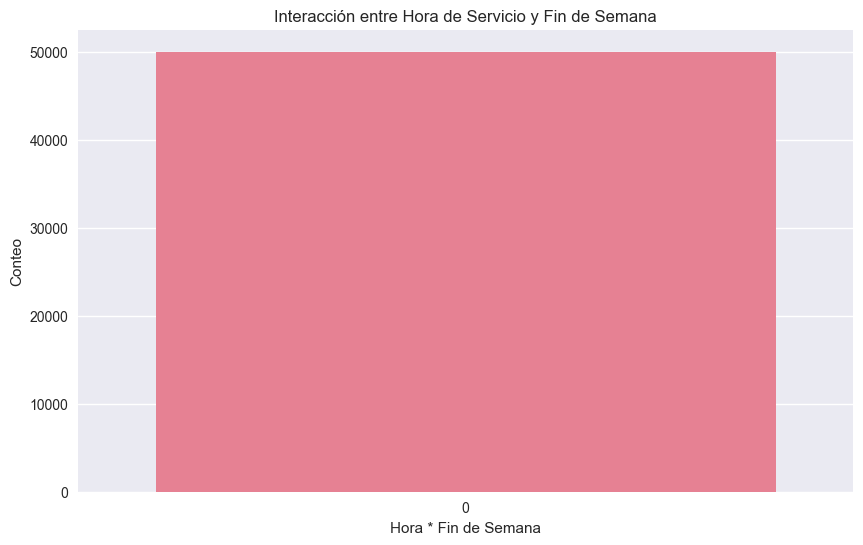

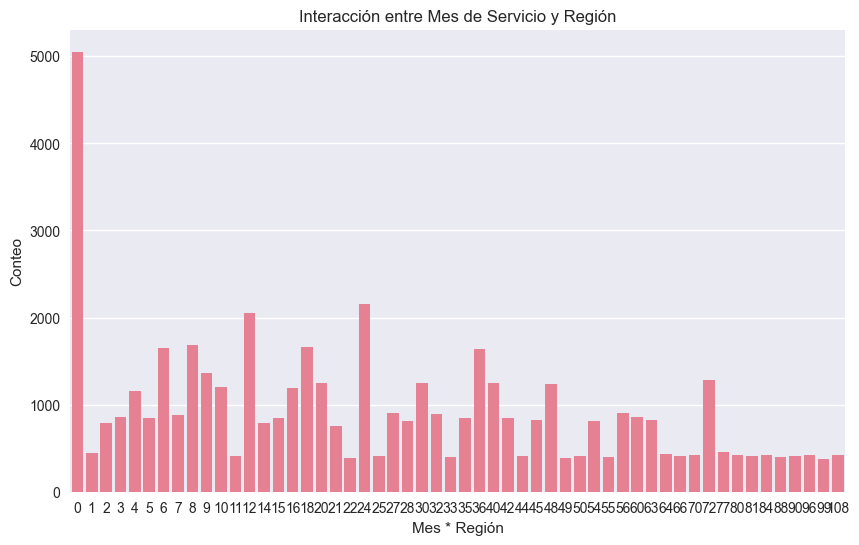

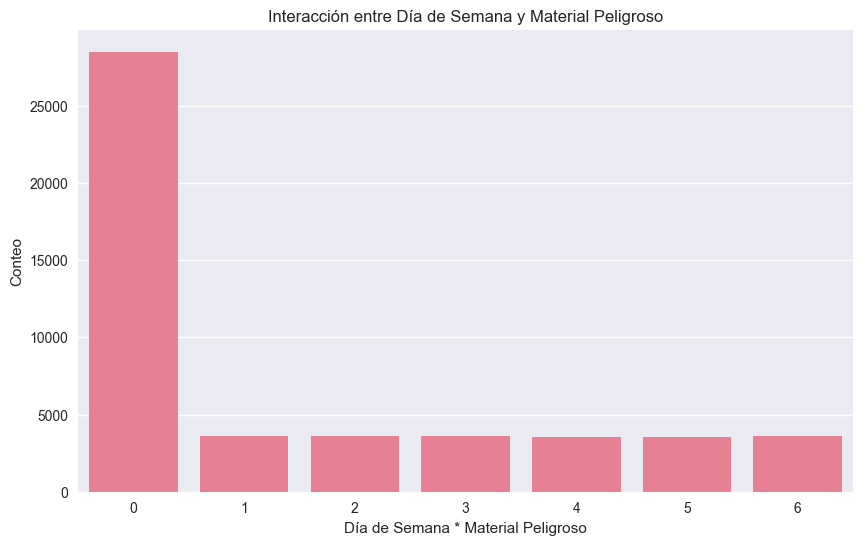

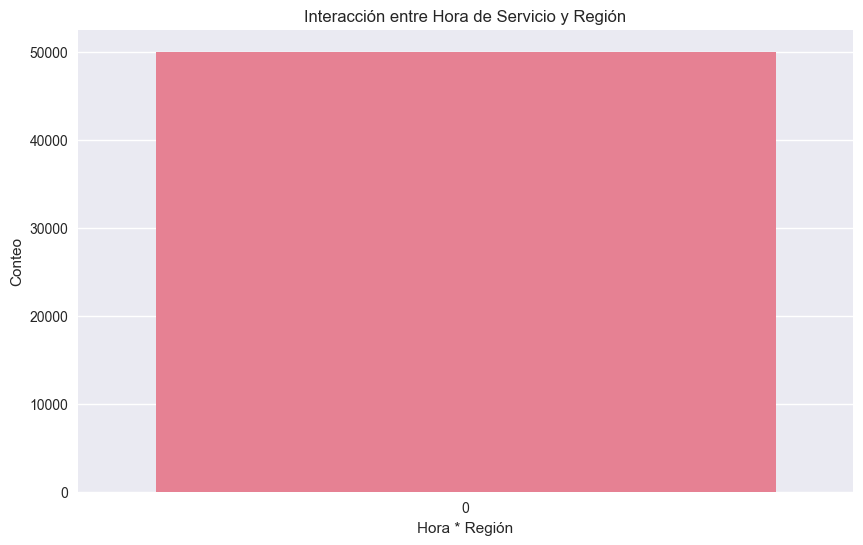

In [24]:
# Creación de términos de interacción
merged_df['hour_weekend_interaction'] = merged_df['service_hour'] * merged_df['service_is_weekend']
merged_df['month_region_interaction'] = merged_df['service_month'] * merged_df['service_region']
merged_df['weekday_hazardous_material_interaction'] = merged_df['service_weekday'] * merged_df['hazardous_material'].astype(int)

# Mostrar primeras filas para verificar los nuevos términos de interacción
print("Términos de Interacción Añadidos:\n", merged_df[['service_hour', 'service_is_weekend', 'hour_weekend_interaction', 
                                              'service_month', 'service_region', 'month_region_interaction', 
                                              'service_weekday', 'hazardous_material', 
                                              'weekday_hazardous_material_interaction']].head())

# Visualizar interacción entre hora y fin de semana
plt.figure(figsize=(10, 6))
sns.countplot(x='hour_weekend_interaction', data=merged_df)
plt.title('Interacción entre Hora de Servicio y Fin de Semana')
plt.xlabel('Hora * Fin de Semana')
plt.ylabel('Conteo')
plt.show()

# Visualizar interacción entre mes y región
plt.figure(figsize=(10, 6))
sns.countplot(x='month_region_interaction', data=merged_df)
plt.title('Interacción entre Mes de Servicio y Región')
plt.xlabel('Mes * Región')
plt.ylabel('Conteo')
plt.show()

# Visualizar interacción entre día de semana y material peligroso
plt.figure(figsize=(10, 6))
sns.countplot(x='weekday_hazardous_material_interaction', data=merged_df)
plt.title('Interacción entre Día de Semana y Material Peligroso')
plt.xlabel('Día de Semana * Material Peligroso')
plt.ylabel('Conteo')
plt.show()

# Término de interacción adicional: Hora de servicio y región (ejemplo)
merged_df['hour_region_interaction'] = merged_df['service_hour'] * merged_df['service_region']
plt.figure(figsize=(10, 6))
sns.countplot(x='hour_region_interaction', data=merged_df)
plt.title('Interacción entre Hora de Servicio y Región')
plt.xlabel('Hora * Región')
plt.ylabel('Conteo')
plt.show()

Se crearon términos de interacción para capturar relaciones complejas entre características, como:  
- Interacción entre hora y fin de semana.  
- Interacción entre mes y región.  

### Binning

Variables Categorizadas Añadidas:
    service_duration_hours service_duration_binned  waste_volume_tons  \
0                     2.0                    1-2h              47.81   
1                     1.5                    1-2h               8.09   
2                     7.8                   5-10h              38.50   
3                     0.8                    0-1h               4.19   
4                     1.4                    1-2h              10.14   

  waste_volume_binned  fuel_price fuel_price_binned  
0                 NaN        4.28               4-5  
1               5-10t        3.90               3-4  
2                 NaN        2.66               2-3  
3                2-5t        5.32               NaN  
4                 NaN        3.89               3-4  


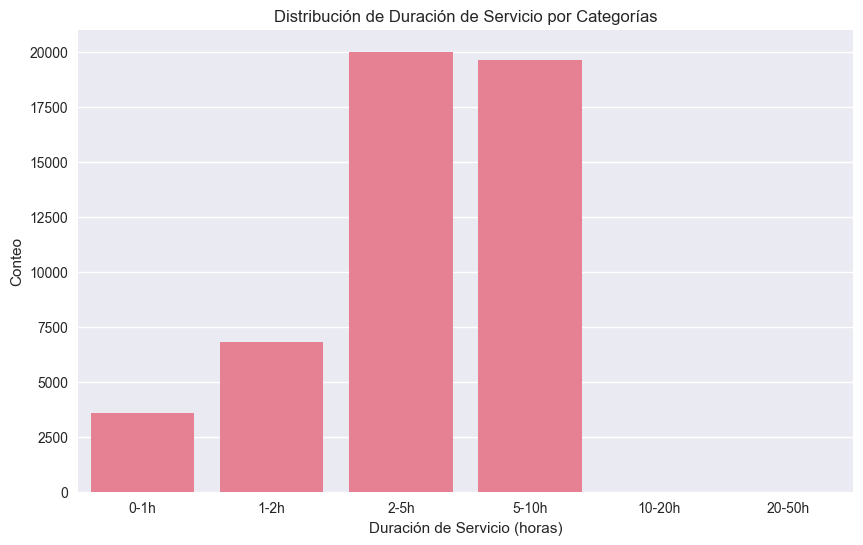

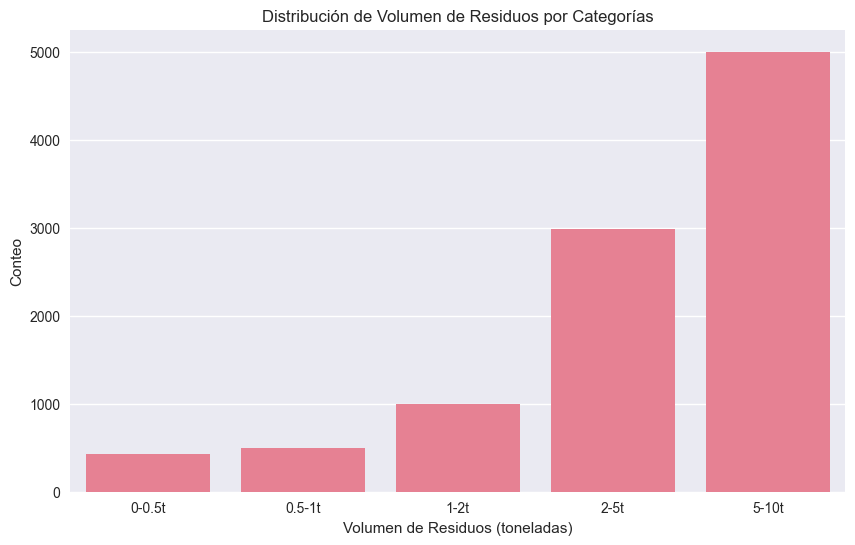

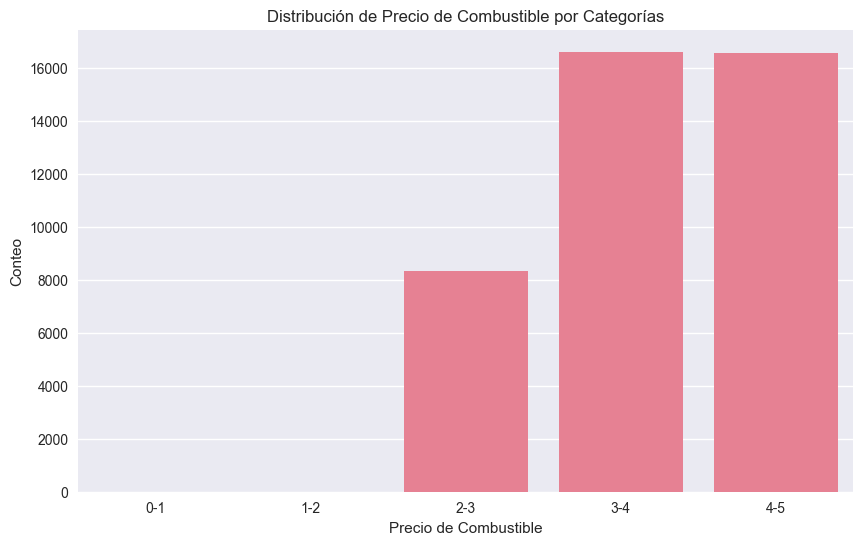

In [25]:
# Creación de categorías para 'service_duration_hours'
bins_service_duration = [0, 1, 2, 5, 10, 20, 50]  # Límites personalizados (ajustar según los datos)
labels_service_duration = ['0-1h', '1-2h', '2-5h', '5-10h', '10-20h', '20-50h']
merged_df['service_duration_binned'] = pd.cut(merged_df['service_duration_hours'], bins=bins_service_duration, labels=labels_service_duration)

# Creación de categorías para 'waste_volume_tons'
bins_waste_volume = [0, 0.5, 1, 2, 5, 10]  # Límites personalizados (ajustar según los datos)
labels_waste_volume = ['0-0.5t', '0.5-1t', '1-2t', '2-5t', '5-10t']
merged_df['waste_volume_binned'] = pd.cut(merged_df['waste_volume_tons'], bins=bins_waste_volume, labels=labels_waste_volume)

# Creación de categorías para 'fuel_price'
bins_fuel_price = [0, 1, 2, 3, 4, 5]  # Límites personalizados (ajustar según los datos)
labels_fuel_price = ['0-1', '1-2', '2-3', '3-4', '4-5']
merged_df['fuel_price_binned'] = pd.cut(merged_df['fuel_price'], bins=bins_fuel_price, labels=labels_fuel_price)

# Mostrar primeras filas para verificar las nuevas categorías
print("Variables Categorizadas Añadidas:\n", merged_df[['service_duration_hours', 'service_duration_binned', 
                                             'waste_volume_tons', 'waste_volume_binned', 
                                             'fuel_price', 'fuel_price_binned']].head())

# Visualizar distribución de 'service_duration_binned'
plt.figure(figsize=(10, 6))
sns.countplot(x='service_duration_binned', data=merged_df)
plt.title('Distribución de Duración de Servicio por Categorías')
plt.xlabel('Duración de Servicio (horas)')
plt.ylabel('Conteo')
plt.show()

# Visualizar distribución de 'waste_volume_binned'
plt.figure(figsize=(10, 6))
sns.countplot(x='waste_volume_binned', data=merged_df)
plt.title('Distribución de Volumen de Residuos por Categorías')
plt.xlabel('Volumen de Residuos (toneladas)')
plt.ylabel('Conteo')
plt.show()

# Visualizar distribución de 'fuel_price_binned'
plt.figure(figsize=(10, 6))
sns.countplot(x='fuel_price_binned', data=merged_df)
plt.title('Distribución de Precio de Combustible por Categorías')
plt.xlabel('Precio de Combustible')
plt.ylabel('Conteo')
plt.show()

Variables continuas como `service_duration_hours`, `waste_volume_tons` y `fuel_price` se agruparon en categorías para simplificar el análisis.  

### Agregaciones

Datos Agregados por Tipo de Servicio:
                    revenue                        net_profit               \
                      mean           sum  count         mean          sum   
service_type                                                                
0             13290.176982  1.337258e+08  10062  2444.699244  24598563.79   
1             13227.649970  1.335067e+08  10093  2433.462531  24560937.33   
2             13271.771654  1.321603e+08   9958  2458.152411  24478281.71   
3             13297.807830  1.320472e+08   9930  2432.395528  24153687.59   
4             13284.138674  1.322702e+08   9957  2436.905800  24264271.05   

                      labor_cost                      
              count         mean          sum  count  
service_type                                          
0             10062  2530.941797  25466336.36  10062  
1             10093  2529.884570  25534124.96  10093  
2              9958  2496.553318  24860677.94   9958  
3             

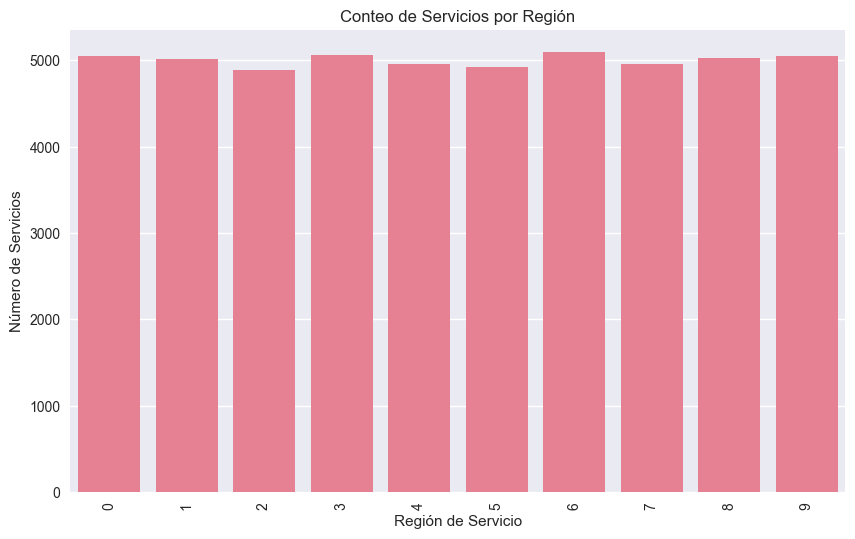

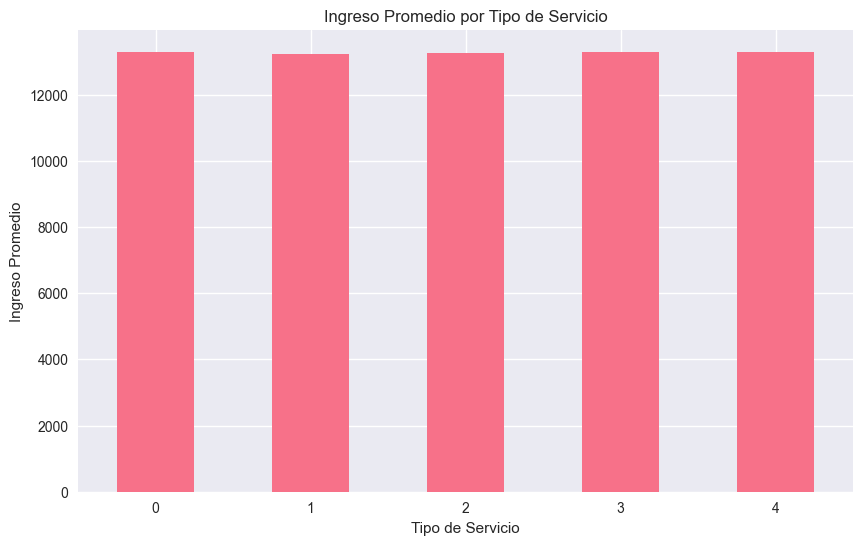

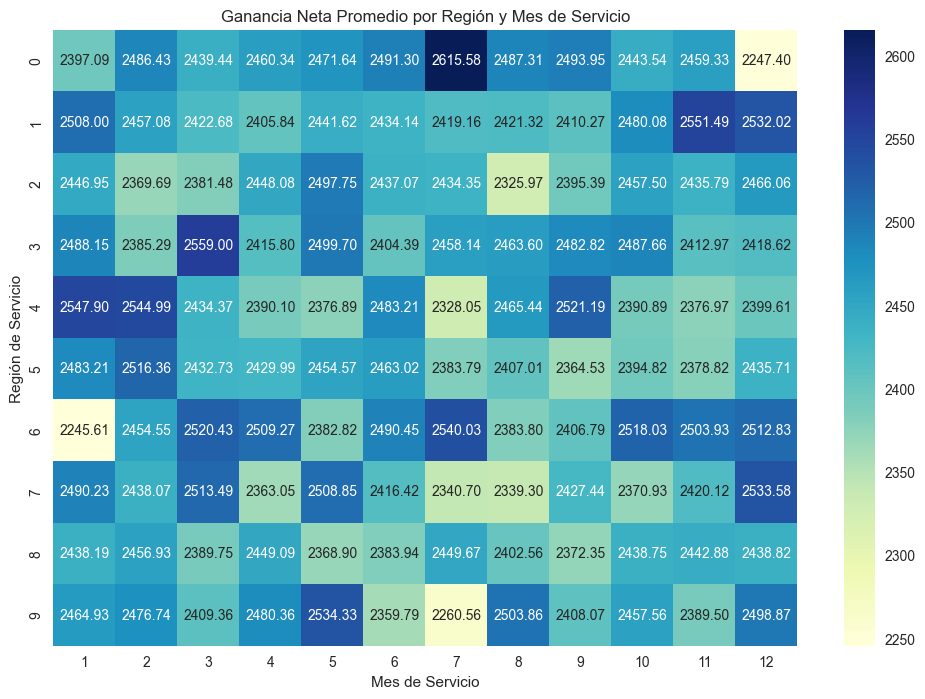

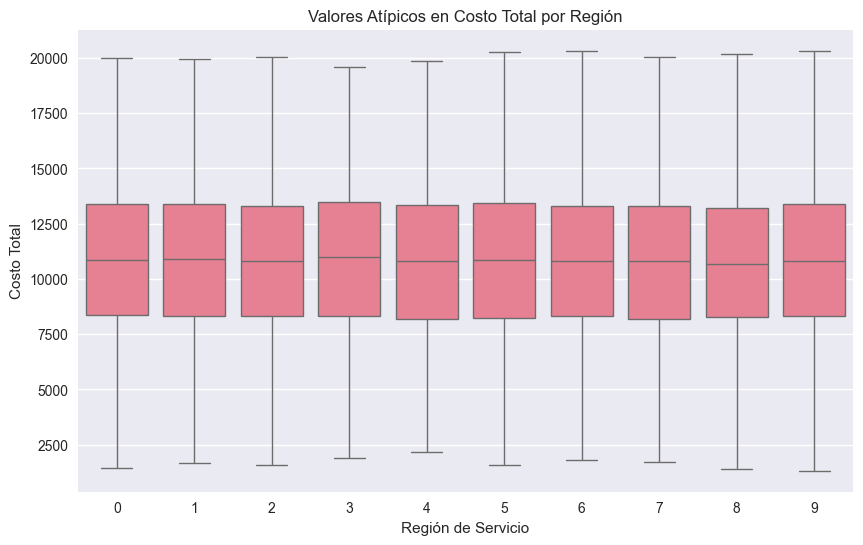

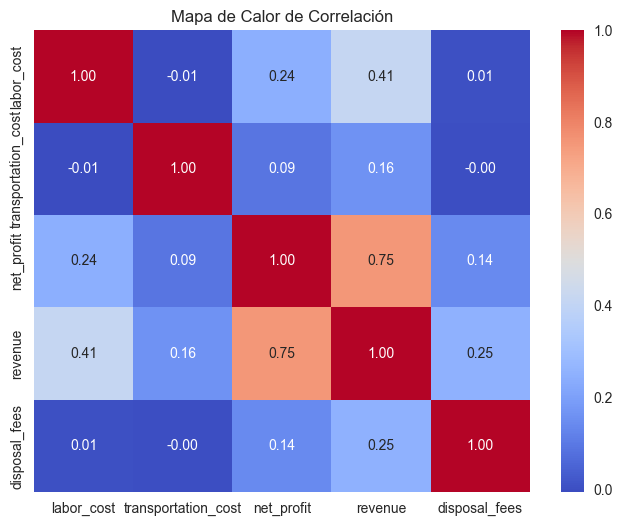

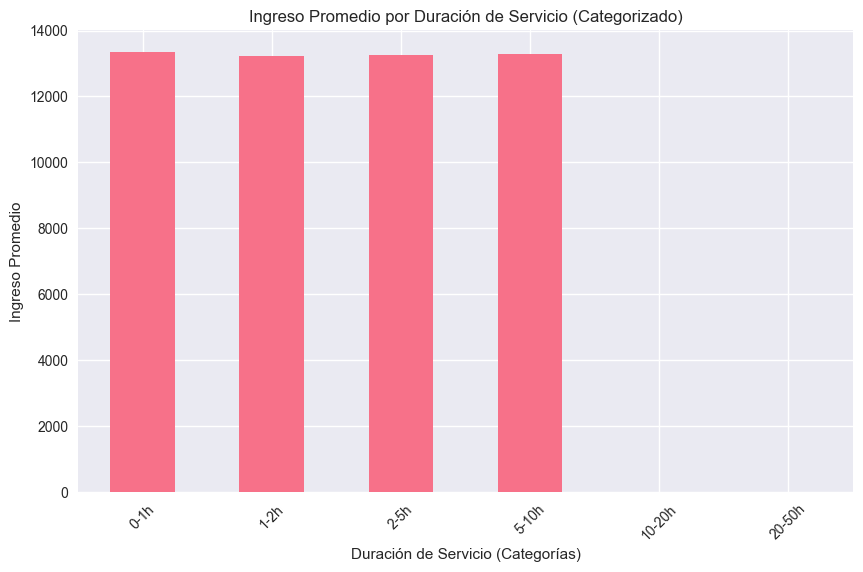

In [26]:
# 1. Agregación: Calcular media, suma y conteo para revenue, net_profit y labor_cost por service_type
agg_service_type = merged_df.groupby('service_type')[['revenue', 'net_profit', 'labor_cost']].agg(['mean', 'sum', 'count'])
print("Datos Agregados por Tipo de Servicio:\n", agg_service_type)

# 2. Agregación: Calcular valores medios por service_region y service_month
agg_region_month = merged_df.groupby(['service_region', 'service_month'])[['revenue', 'net_profit']].agg('mean')
print("\nDatos Agregados por Región y Mes de Servicio:\n", agg_region_month)

# 3. Agregación: Conteo de servicios por service_region
service_count_region = merged_df.groupby('service_region').size()
print("\nConteo de Servicios por Región:\n", service_count_region)

# 4. Agregación: Conteo de servicios por payment_status
payment_status_count = merged_df.groupby('payment_status').size()
print("\nConteo de Servicios por Estado de Pago:\n", payment_status_count)

# 5. Visualización: Conteo de Servicios por Región
plt.figure(figsize=(10, 6))
sns.countplot(x='service_region', data=merged_df)
plt.title('Conteo de Servicios por Región')
plt.xlabel('Región de Servicio')
plt.ylabel('Número de Servicios')
plt.xticks(rotation=90)
plt.show()

# 6. Visualización: Ingreso Promedio por Tipo de Servicio
agg_service_type['revenue']['mean'].plot(kind='bar', figsize=(10, 6))
plt.title('Ingreso Promedio por Tipo de Servicio')
plt.xlabel('Tipo de Servicio')
plt.ylabel('Ingreso Promedio')
plt.xticks(rotation=0)
plt.show()

# 7. Visualización: Ganancia Neta Promedio por Región y Mes (Mapa de Calor)
pivot_net_profit = agg_region_month['net_profit'].unstack()
plt.figure(figsize=(12, 8))
sns.heatmap(pivot_net_profit, annot=True, cmap="YlGnBu", fmt=".2f")
plt.title('Ganancia Neta Promedio por Región y Mes de Servicio')
plt.xlabel('Mes de Servicio')
plt.ylabel('Región de Servicio')
plt.show()

# 8. Visualización: Valores Atípicos en Costo Total por Región (Diagrama de Caja)
plt.figure(figsize=(10, 6))
sns.boxplot(x='service_region', y='total_cost', data=merged_df)
plt.title('Valores Atípicos en Costo Total por Región')
plt.xlabel('Región de Servicio')
plt.ylabel('Costo Total')
plt.show()

# 9. Visualización: Mapa de Calor de Correlación para Variables Continuas
correlation_matrix = merged_df[['labor_cost', 'transportation_cost', 'net_profit', 'revenue', 'disposal_fees']].corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title('Mapa de Calor de Correlación')
plt.show()

# 10. Visualización: Ingreso Promedio por Duración de Servicio (Categorizado)
avg_revenue_duration = merged_df.groupby('service_duration_binned')['revenue'].mean()
avg_revenue_duration.plot(kind='bar', figsize=(10, 6))
plt.title('Ingreso Promedio por Duración de Servicio (Categorizado)')
plt.xlabel('Duración de Servicio (Categorías)')
plt.ylabel('Ingreso Promedio')
plt.xticks(rotation=45)
plt.show()

Se resumieron datos financieros y operativos por tipo de servicio, región y mes, utilizando métricas como promedio, suma y conteo.  

### Codificación por Objetivo (Target Encoding)


Encoding service_type:
   service_type  service_type_encoded
0             2           2458.152411
1             4           2436.905800
2             1           2433.462531
3             1           2433.462531
4             4           2436.905800
Mean of net_profit per service_type:
service_type
0    2444.699244
1    2433.462531
2    2458.152411
3    2432.395528
4    2436.905800
Name: net_profit, dtype: float64

Encoding service_region:
   service_region  service_region_encoded
0               0             2458.791720
1               1             2456.977459
2               5             2428.059779
3               2             2425.486496
4               3             2458.506789
Mean of net_profit per service_region:
service_region
0    2458.791720
1    2456.977459
2    2425.486496
3    2458.506789
4    2437.850860
Name: net_profit, dtype: float64

Encoding service_subtype:
   service_subtype  service_subtype_encoded
0               12              2427.561037
1              

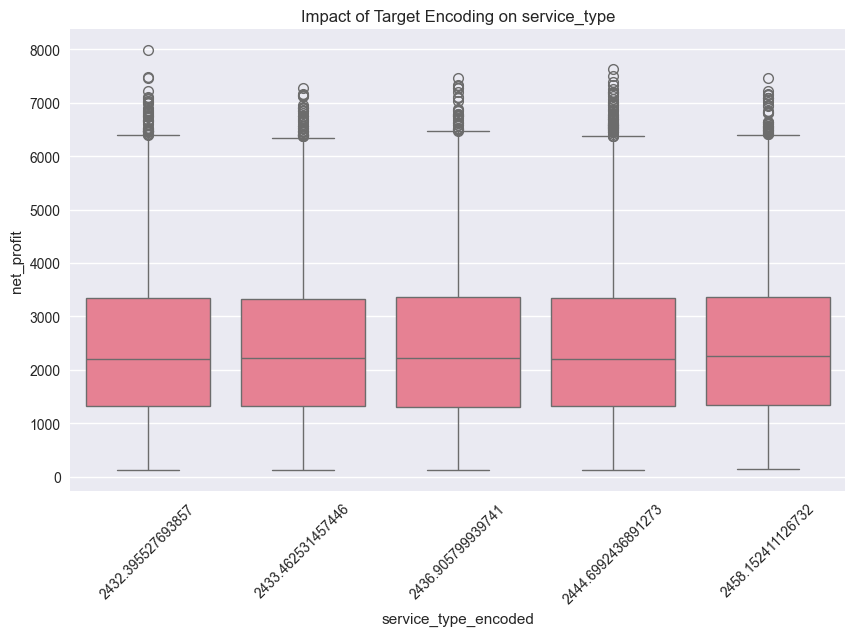

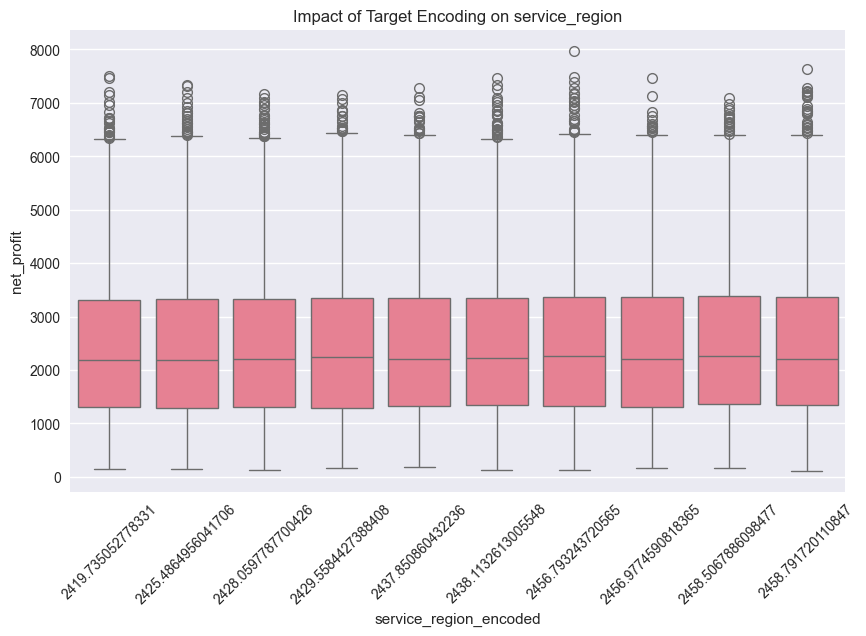

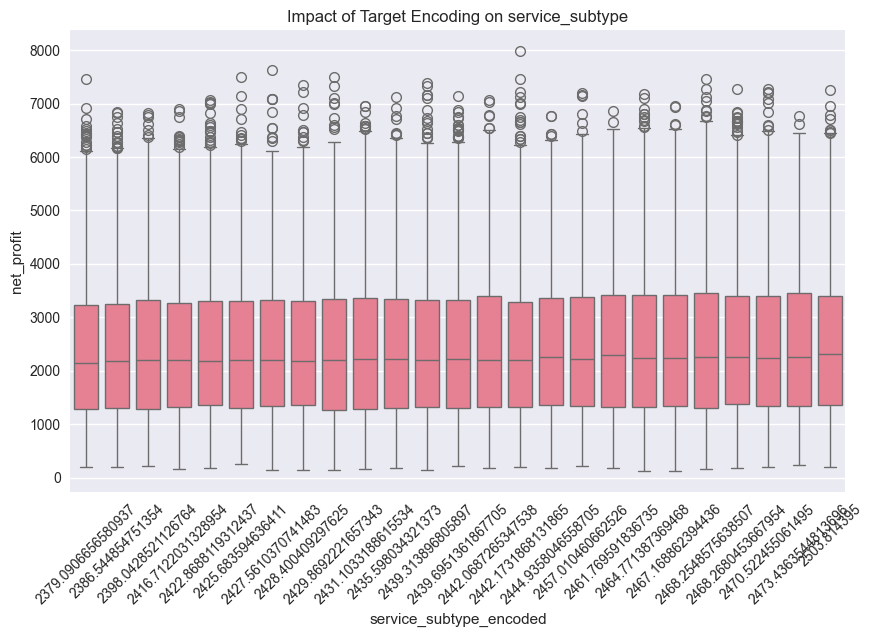

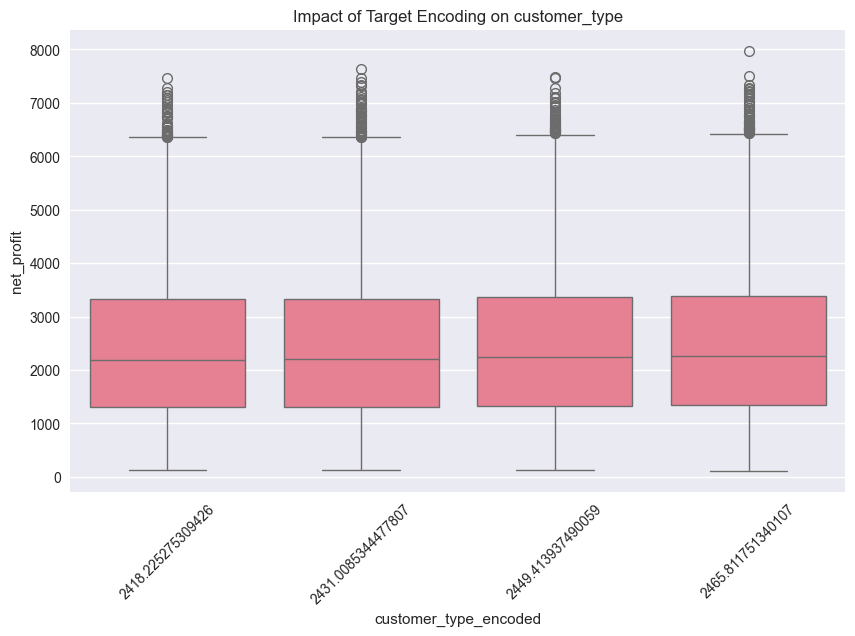

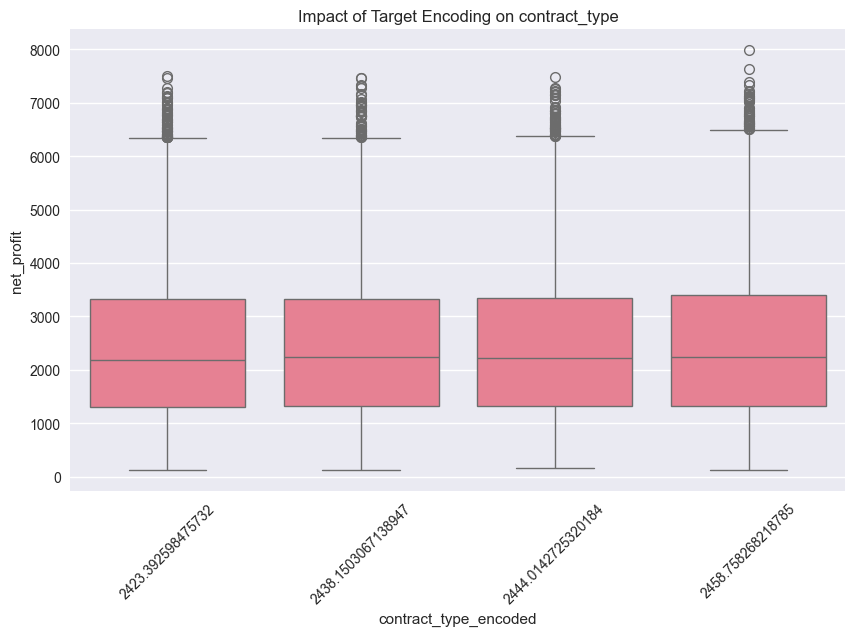

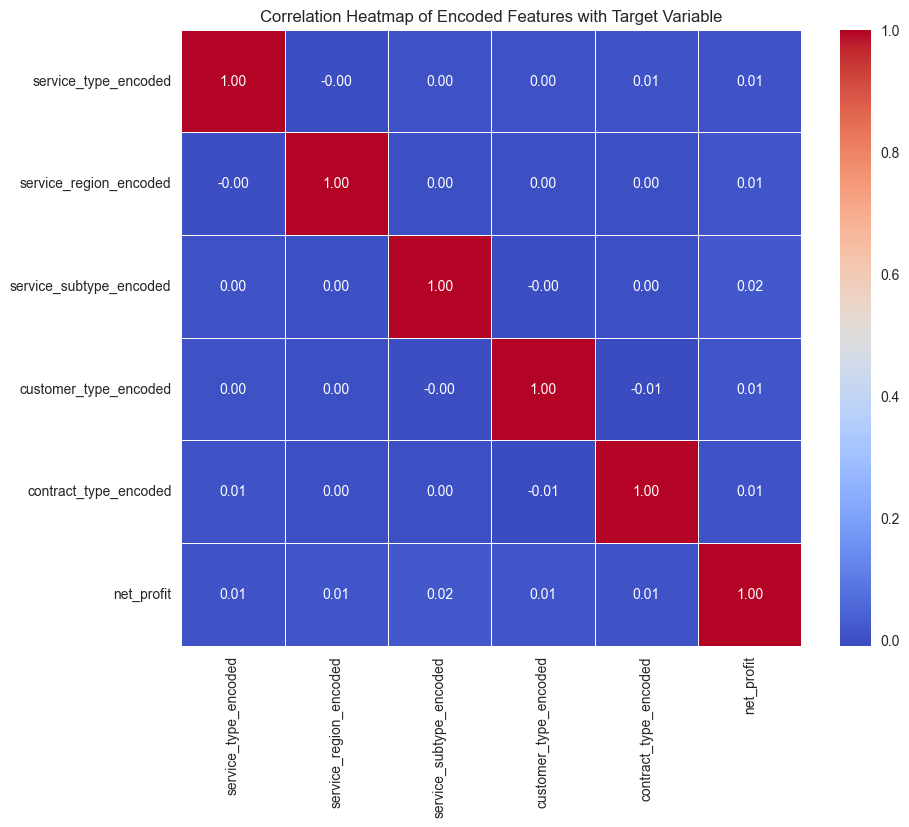

In [27]:
# 1. Choose the target variable (e.g., net_profit)
target = 'net_profit'

# 2. Select categorical columns for target encoding (e.g., service_type, service_region)
categorical_cols = ['service_type', 'service_region', 'service_subtype', 'customer_type', 'contract_type']

# 3. Perform Target Encoding
for col in categorical_cols:
    # Calculate the mean of target (net_profit) for each category in the column
    target_mean = merged_df.groupby(col)[target].mean()
    
    # Map the calculated mean to the original DataFrame
    merged_df[f'{col}_encoded'] = merged_df[col].map(target_mean)

    # Print some statistics about the encoding
    print(f"\nEncoding {col}:")
    print(merged_df[[col, f'{col}_encoded']].head())
    print(f"Mean of {target} per {col}:")
    print(target_mean.head())

# 4. Visualizing the encoded features
# Plot the distribution of the encoded columns for better understanding
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=f'{col}_encoded', y=target, data=merged_df)
    plt.title(f'Impact of Target Encoding on {col}')
    plt.xlabel(f'{col}_encoded')
    plt.ylabel(target)
    plt.xticks(rotation=45)
    plt.show()

# 5. Visualize correlations between encoded features and the target variable
encoded_cols = [f'{col}_encoded' for col in categorical_cols]

# Calculate the correlation matrix
correlation_matrix = merged_df[encoded_cols + [target]].corr()

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap of Encoded Features with Target Variable')
plt.show()


Se aplicó codificación por objetivo a variables categóricas como `service_type` y `service_region`, transformándolas en valores numéricos basados en la media de `net_profit`.  

### Reducción de Dimensionalidad

Proporción de varianza explicada por cada componente:
[0.13320298 0.05382924]


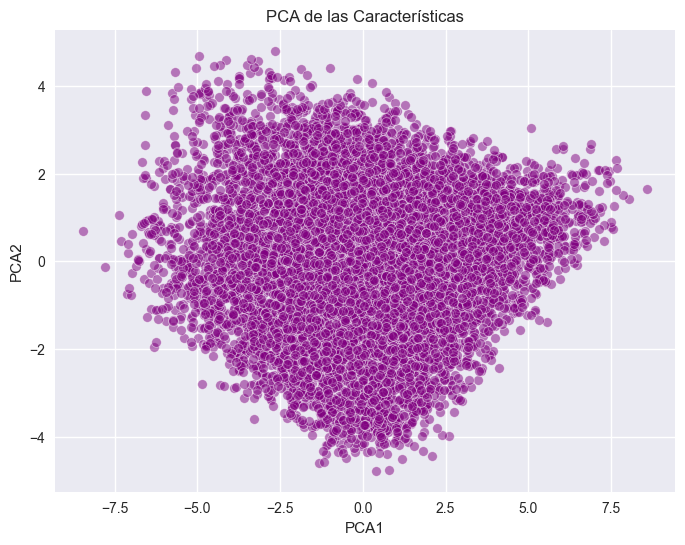

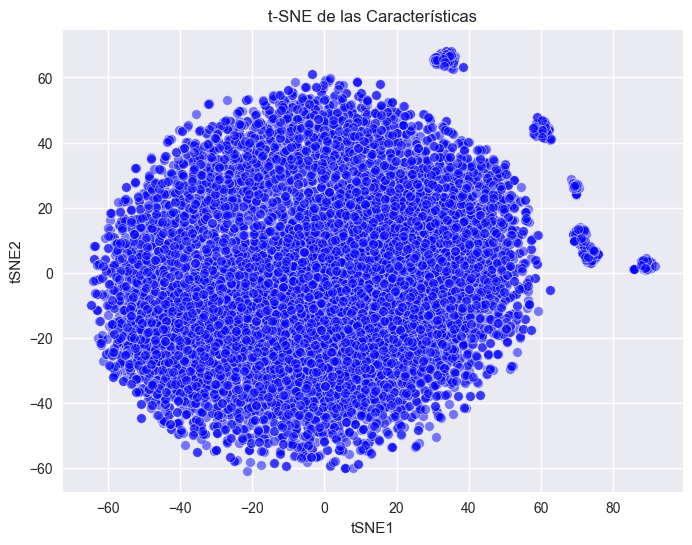


Resumen de PCA:
Dimensión original de los datos: (8253, 63)
Dimensión reducida (después de PCA): (8253, 2)

Resumen de t-SNE:
Dimensión original de los datos: (8253, 63)
Dimensión reducida (después de t-SNE): (8253, 2)


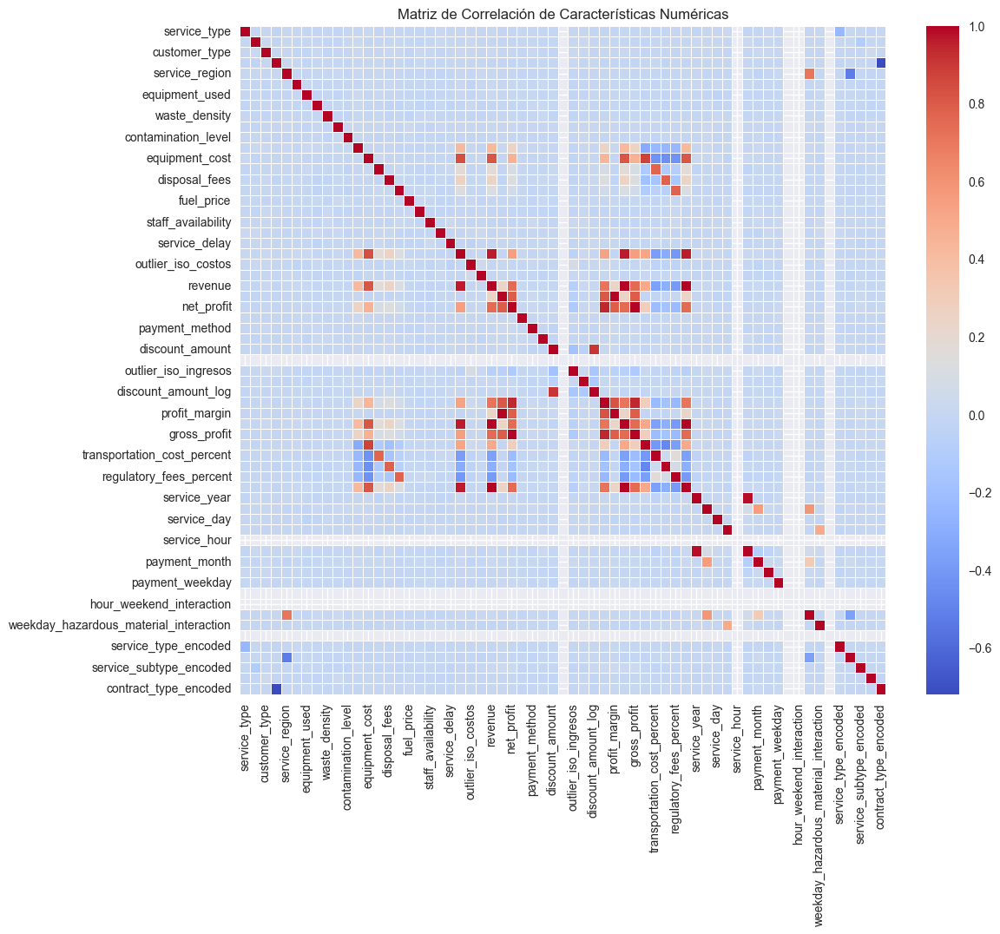

In [28]:
# Preprocesamiento
# Eliminar columnas que no se usarán en la reducción de dimensionalidad
drop_columns = ['service_id', 'service_date', 'payment_date', 'invoice_id', 'payment_status', 'cost_anomaly']
numerical_df = merged_df.drop(columns=drop_columns)

# Eliminar filas con valores NaN
numerical_df = numerical_df.dropna()

# Seleccionar solo columnas numéricas
numerical_features = numerical_df.select_dtypes(include=[np.float64, np.int32, np.int64])

# Estandarizar los datos (importante para PCA y t-SNE)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numerical_features)

# PCA: Análisis de Componentes Principales
# Realizar PCA y ver cuánta varianza explica cada componente
pca = PCA(n_components=2)  # Reducir a 2 dimensiones para visualización
pca_result = pca.fit_transform(scaled_data)

# Ratio de varianza explicada
print("Proporción de varianza explicada por cada componente:")
print(pca.explained_variance_ratio_)

# Crear DataFrame con los resultados de PCA
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])

# Visualizar los componentes de PCA
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PCA1', y='PCA2', data=pca_df, alpha=0.5, color='purple')
plt.title('PCA de las Características')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()

# t-SNE: Embedding de Vecinos Estocásticos t-Distribuido (para visualización de datos de alta dimensionalidad)
tsne = TSNE(n_components=2, random_state=42)
tsne_result = tsne.fit_transform(scaled_data)

# Crear DataFrame con los resultados de t-SNE
tsne_df = pd.DataFrame(data=tsne_result, columns=['tSNE1', 'tSNE2'])

# Visualizar los resultados de t-SNE
plt.figure(figsize=(8, 6))
sns.scatterplot(x='tSNE1', y='tSNE2', data=tsne_df, alpha=0.5, color='blue')
plt.title('t-SNE de las Características')
plt.xlabel('tSNE1')
plt.ylabel('tSNE2')
plt.show()

# Resumen de la reducción de dimensionalidad
print("\nResumen de PCA:")
print(f"Dimensión original de los datos: {scaled_data.shape}")
print(f"Dimensión reducida (después de PCA): {pca_result.shape}")

print("\nResumen de t-SNE:")
print(f"Dimensión original de los datos: {scaled_data.shape}")
print(f"Dimensión reducida (después de t-SNE): {tsne_result.shape}")

# Matriz de correlación para observar colinealidad antes de la reducción de dimensionalidad
correlation_matrix = numerical_features.corr()

# Visualizar la matriz de correlación
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlación de Características Numéricas')
plt.show()

Se aplicaron técnicas como PCA y t-SNE para reducir la complejidad del conjunto de datos, conservando las características más importantes.  

## Selección de Características

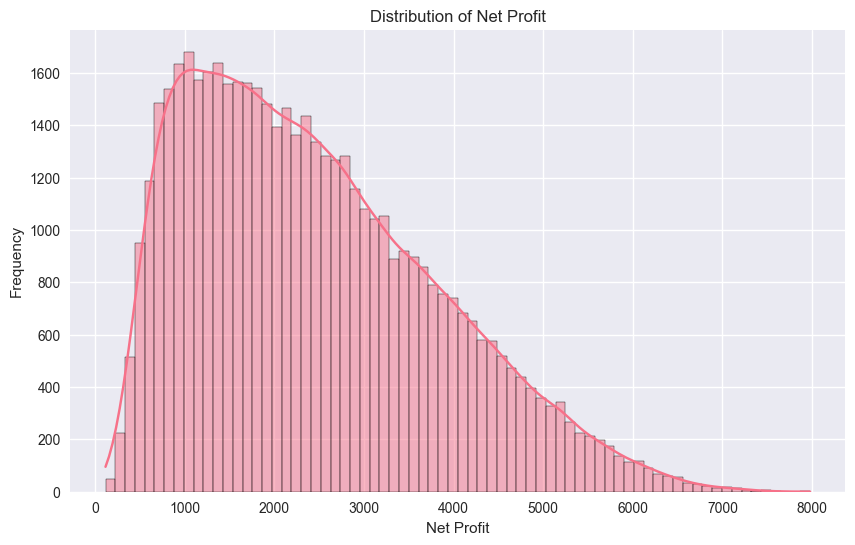

net_profit                  1.000000
gross_profit                1.000000
net_profit_log              0.940387
profit_margin_percentage    0.793115
profit_margin               0.788915
                              ...   
currency                         NaN
service_hour                     NaN
payment_hour                     NaN
hour_weekend_interaction         NaN
hour_region_interaction          NaN
Name: net_profit, Length: 66, dtype: float64


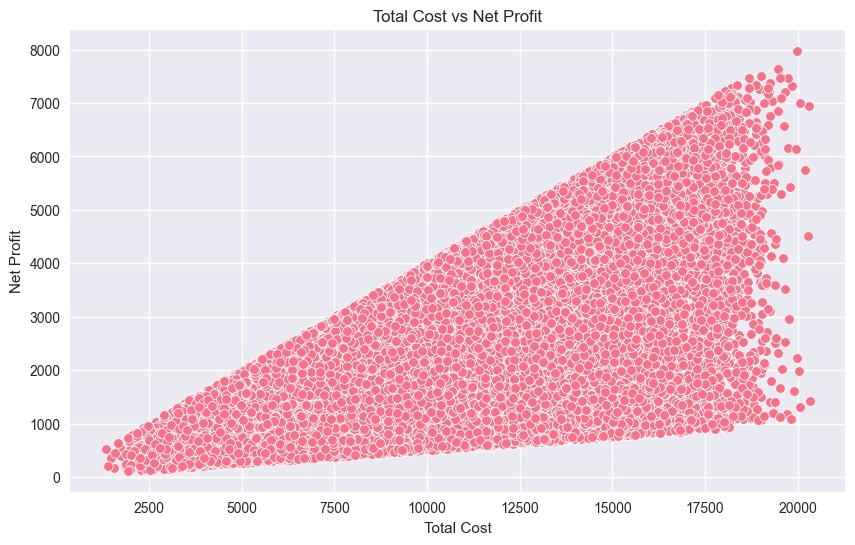

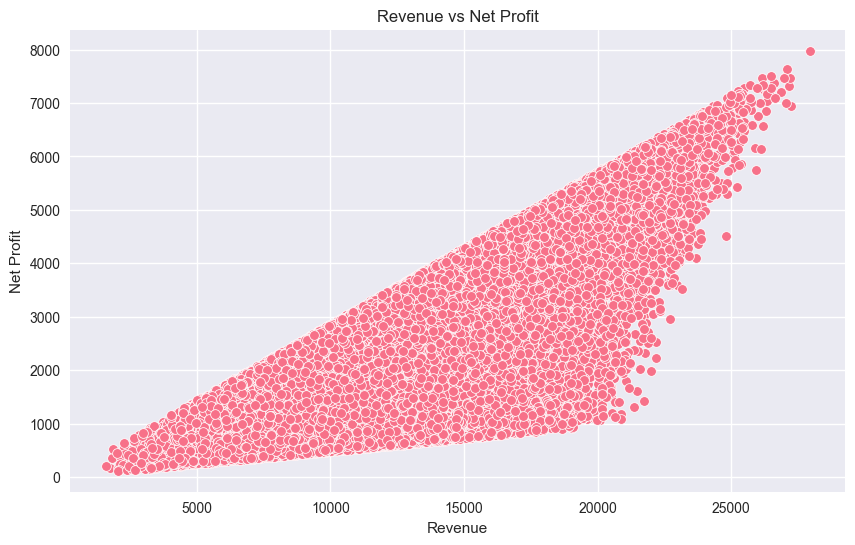

In [29]:
# 1. Plot the distribution of the target variable 'net_profit'
plt.figure(figsize=(10, 6))
sns.histplot(merged_df['net_profit'], kde=True)
plt.title('Distribution of Net Profit')
plt.xlabel('Net Profit')
plt.ylabel('Frequency')
plt.show()

# 2. Encode categorical variables (e.g., 'payment_status')
# For categorical columns with only two unique values, you can use LabelEncoder
label_encoder = LabelEncoder()
merged_df['payment_status_encoded'] = label_encoder.fit_transform(merged_df['payment_status'])

# 3. Drop non-numeric columns for correlation matrix (those with non-numeric values like categories or strings)
numeric_df = merged_df.select_dtypes(include=['float64', 'int32', 'int64'])

# Compute the correlation matrix for the numeric columns
correlation_matrix = numeric_df.corr()

# Print correlation with the target variable 'net_profit'
print(correlation_matrix['net_profit'].sort_values(ascending=False))

# 4. Scatter plots to visualize relationships between target and features
plt.figure(figsize=(10, 6))
sns.scatterplot(x=merged_df['total_cost'], y=merged_df['net_profit'])
plt.title('Total Cost vs Net Profit')
plt.xlabel('Total Cost')
plt.ylabel('Net Profit')
plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=merged_df['revenue'], y=merged_df['net_profit'])
plt.title('Revenue vs Net Profit')
plt.xlabel('Revenue')
plt.ylabel('Net Profit')
plt.show()


#### Eliminación de Columnas con Baja Varianza

Número de características antes del umbral de varianza: 77
Número de características después de la selección: 63
Columnas incluidas: ['service_id', 'service_type', 'service_subtype', 'customer_type', 'contract_type', 'service_region', 'service_duration_hours', 'equipment_used', 'waste_volume_tons', 'waste_density', 'recyclable_percentage', 'contamination_level', 'labor_cost', 'equipment_cost', 'transportation_cost', 'disposal_fees', 'regulatory_fees', 'fuel_price', 'weather_conditions', 'staff_availability', 'economic_index', 'service_delay', 'total_cost', 'outlier_iso_costos', 'outlier_lof_costos', 'revenue', 'profit_margin_percentage', 'net_profit', 'billing_status', 'payment_method', 'invoice_id', 'late_payment_days', 'discount_amount', 'outlier_iso_ingresos', 'outlier_lof_ingresos', 'discount_amount_log', 'net_profit_log', 'profit_margin', 'final_invoice_amount', 'gross_profit', 'equipment_cost_percent', 'transportation_cost_percent', 'disposal_fees_percent', 'regulatory_fees_perce

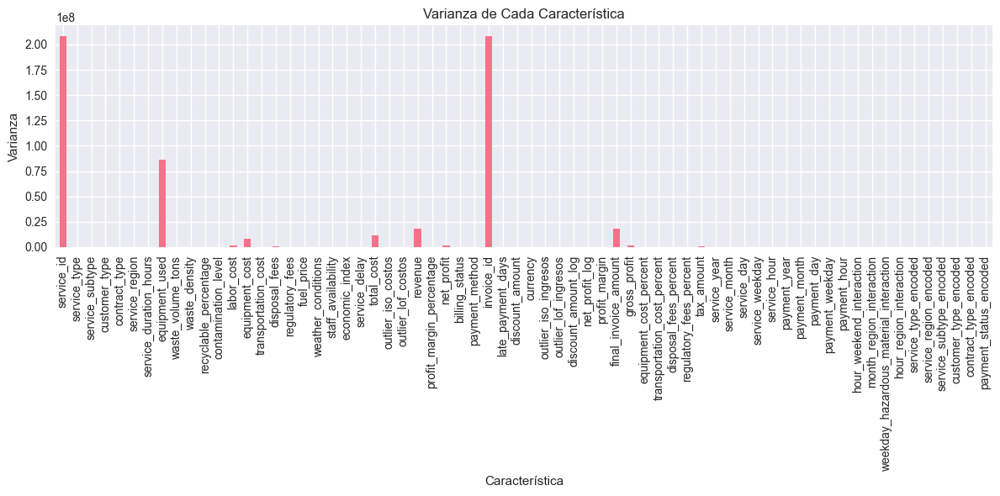

In [30]:
# Mostrar el número de características antes del filtrado
print(f"Número de características antes del umbral de varianza: {merged_df.shape[1]}")

# Separar columnas numéricas y de fecha
numeric_columns = merged_df.select_dtypes(include=['float64', 'int32', 'int64'])
date_columns = merged_df.select_dtypes(include=['datetime64'])

# Aplicar VarianceThreshold solo a columnas numéricas
selector = VarianceThreshold(threshold=0.01)
reduced_numeric_array = selector.fit_transform(numeric_columns)
selected_numeric_cols = numeric_columns.columns[selector.get_support()]

# Combinar columnas numéricas seleccionadas con todas las columnas de fecha
final_columns = list(selected_numeric_cols) + list(date_columns.columns)

# Filtrar el DataFrame original con las columnas finales
merged_df_reduced = merged_df[final_columns]

# Mostrar confirmación
print(f"Número de características después de la selección: {len(final_columns)}")
print("Columnas incluidas:", final_columns)

# Visualizar varianza de las características numéricas originales
variances = numeric_columns.var()
plt.figure(figsize=(12, 6))
variances.plot(kind='bar')
plt.title('Varianza de Cada Característica')
plt.ylabel('Varianza')
plt.xlabel('Característica')
plt.tight_layout()
plt.show()

#### Eliminación de Características Altamente Correlacionadas

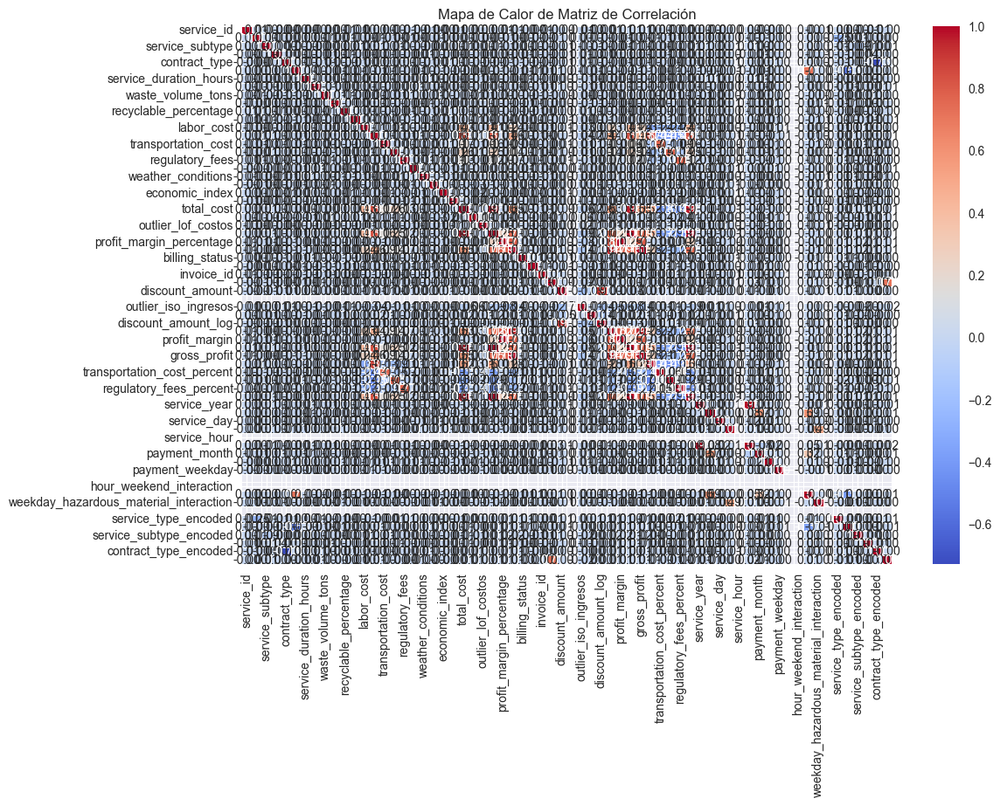

Columnas eliminadas por alta correlación: {'final_invoice_amount', 'gross_profit', 'net_profit_log', 'discount_amount_log', 'profit_margin', 'revenue', 'tax_amount', 'payment_year'}
Número de características después de eliminar columnas altamente correlacionadas: 69


In [31]:
# Seleccionar solo columnas numéricas para el cálculo de correlación
numeric_columns = merged_df.select_dtypes(include=[np.number])

# Calcular la matriz de correlación
correlation_matrix = numeric_columns.corr()

# Graficar el mapa de calor de la matriz de correlación
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Mapa de Calor de Matriz de Correlación')
plt.show()

# Establecer umbral para alta correlación
threshold = 0.9
drop_columns = set()

# Identificar columnas con alta correlación
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            drop_columns.add(colname)

# Eliminar las columnas del dataframe original
merged_df_reduced = merged_df.drop(columns=drop_columns)

# Mostrar las columnas eliminadas por alta correlación
print(f"Columnas eliminadas por alta correlación: {drop_columns}")
print(f"Número de características después de eliminar columnas altamente correlacionadas: {merged_df_reduced.shape[1]}")

- **Eliminación de Columnas con Baja Varianza**: Se eliminaron características con varianza menor a 0.01, reduciendo el conjunto de 77 a 61 características.  
- **Eliminación de Características Altamente Correlacionadas**: Se eliminaron 8 características con correlación mayor a 0.9.  


### Manejo de Variables Categóricas

In [32]:
# Eliminar la columna original 'payment_status' (ya codificada)
merged_df_reduced.drop(columns=['payment_status'], inplace=True, errors='ignore')

# Convertir columnas categóricas binadas a códigos numéricos
merged_df_reduced['service_duration_binned'] = merged_df_reduced['service_duration_binned'].cat.codes
merged_df_reduced['waste_volume_binned'] = merged_df_reduced['waste_volume_binned'].cat.codes
merged_df_reduced['fuel_price_binned'] = merged_df_reduced['fuel_price_binned'].cat.codes

# Verificar el DataFrame actualizado
print("DataFrame después de conversión:")
print(merged_df_reduced.head())

DataFrame después de conversión:
   service_id service_date  service_type  service_subtype  customer_type  \
0           0   2020-02-25             2               12              0   
1           1   2019-09-02             4               13              3   
2           2   2023-01-31             1                1              3   
3           3   2019-07-30             1               14              0   
4           4   2021-05-18             4               15              0   

   contract_type  service_region  service_duration_hours  equipment_used  \
0              2               0                     2.0           24807   
1              0               1                     1.5            6324   
2              3               5                     7.8           20559   
3              0               2                     0.8            1019   
4              0               3                     1.4           18423   

   waste_volume_tons  ...  hour_region_interaction  s

- Se codificaron variables categóricas utilizando `LabelEncoder` y `cat.codes`.  

### Eliminación de Características con Alto VIF

In [33]:
# 1. Identificar columnas de fecha para preservarlas
datetime_columns = merged_df_reduced.select_dtypes(include=['datetime', 'datetime64[ns]']).columns

# 2. Seleccionar columnas numéricas (excluyendo targets y fechas)
target_columns = ['total_cost', 'net_profit']
numeric_df = merged_df_reduced.drop(columns=target_columns + list(datetime_columns)).select_dtypes(include=['float64', 'int32', 'int64'])

# 3. Calcular matriz de correlación
correlation_matrix = numeric_df.corr()

# 4. Identificar pares con alta correlación (>0.9)
high_correlation_pairs = []
for column in correlation_matrix.columns:
    high_corr = correlation_matrix[column][correlation_matrix[column] > 0.9].index.tolist()
    if column in high_corr:
        high_corr.remove(column)  # Excluir autocorrelación
    if high_corr:
        high_correlation_pairs.append((column, high_corr))

print("Pares altamente correlacionados (correlación > 0.9):")
print(high_correlation_pairs)

# 5. Calcular Factor de Inflación de Varianza (VIF)
X = add_constant(numeric_df, has_constant='add')
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Obtener variables con VIF alto (>10)
high_vif_features = vif_data[vif_data["VIF"] > 10]["Variable"].tolist()

print("\nVariables con VIF alto (>10):")
print(high_vif_features)

# 6. Combinar características a eliminar
columns_to_drop = set()
for _, correlated_features in high_correlation_pairs:
    columns_to_drop.update(correlated_features)
columns_to_drop.update(high_vif_features)

# Filtrar solo columnas existentes que no sean targets o fechas
columns_to_drop = [col for col in columns_to_drop 
                  if col not in target_columns and col not in datetime_columns]

# Verificar existencia de columnas
existing_columns_to_drop = [col for col in columns_to_drop if col in merged_df_reduced.columns]
missing_columns = [col for col in columns_to_drop if col not in merged_df_reduced.columns]

# Eliminar columnas de forma segura
merged_df_reduced = merged_df_reduced.drop(columns=existing_columns_to_drop)

# Mostrar resultados
print("\nColumnas eliminadas:", existing_columns_to_drop)
if missing_columns:
    print("⚠️ Columnas no encontradas (no eliminadas):", missing_columns)
print("Dimensión final del DataFrame:", merged_df_reduced.shape)
print("Columnas de fecha preservadas:", list(datetime_columns))

Pares altamente correlacionados (correlación > 0.9):
[]

Variables con VIF alto (>10):
['const', 'equipment_cost', 'equipment_cost_percent', 'disposal_fees_percent']

Columnas eliminadas: ['equipment_cost', 'equipment_cost_percent', 'disposal_fees_percent']
⚠️ Columnas no encontradas (no eliminadas): ['const']
Dimensión final del DataFrame: (50000, 65)
Columnas de fecha preservadas: ['service_date', 'payment_date']


Se eliminaron características con alto Factor de Inflación de Varianza (VIF) para evitar multicolinealidad.  

### Selección Final de Características

Entrenando modelo para múltiples variables objetivo...
Entrenamiento del modelo completado.

Top 20 características importantes para predecir Total Cost:
                        Feature  Importance_total_cost  Importance_net_profit
38                 cost_anomaly               0.552796               0.197813
36  transportation_cost_percent               0.184017               0.045056
16          transportation_cost               0.121842               0.024679
37      regulatory_fees_percent               0.100630               0.051789
18              regulatory_fees               0.026744               0.023490
15                   labor_cost               0.005353               0.002424
17                disposal_fees               0.002552               0.001428
34         outlier_iso_ingresos               0.000799               0.001637
26     profit_margin_percentage               0.000240               0.638564
22               economic_index               0.000219            

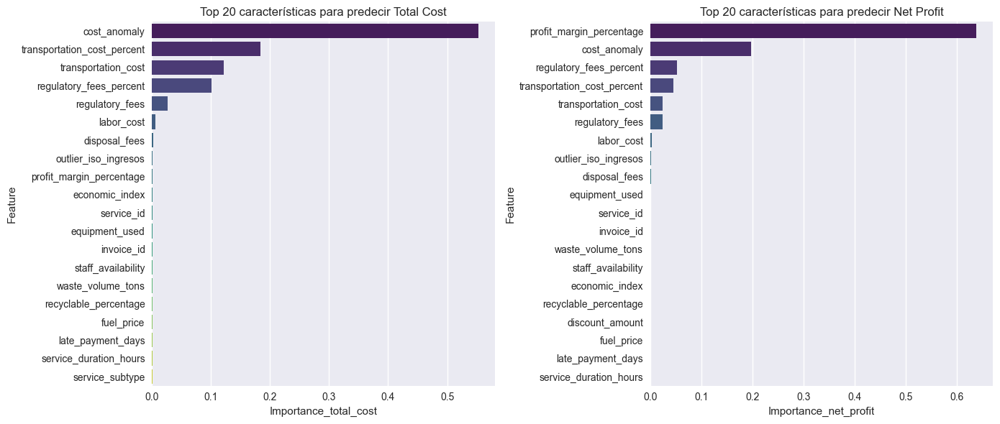


Características top combinadas para ambos objetivos (incluyendo datetime originales):
['service_region_encoded', 'month_region_interaction', 'transportation_cost', 'recyclable_percentage', 'service_id', 'service_duration_hours', 'payment_method', 'payment_date', 'waste_volume_tons', 'staff_availability', 'profit_margin_percentage', 'service_day', 'invoice_id', 'disposal_fees', 'service_delay', 'outlier_iso_ingresos', 'service_subtype', 'labor_cost', 'transportation_cost_percent', 'payment_day', 'service_date', 'equipment_used', 'regulatory_fees_percent', 'fuel_price', 'discount_amount', 'service_subtype_encoded', 'contamination_level', 'regulatory_fees', 'cost_anomaly', 'service_region', 'economic_index', 'late_payment_days']

Número de características seleccionadas: 32

✅ Características finales en X_selected (incluyendo datetime originales):
['service_region_encoded', 'month_region_interaction', 'transportation_cost', 'recyclable_percentage', 'service_id', 'service_duration_hours', 

,service_region_encoded,month_region_interaction,transportation_cost,recyclable_percentage,service_id,service_duration_hours,payment_method,payment_date,waste_volume_tons,staff_availability,...,regulatory_fees_percent,fuel_price,discount_amount,service_subtype_encoded,contamination_level,regulatory_fees,cost_anomaly,service_region,economic_index,late_payment_days
0,2458.791720,0,582.78,99.80,0,2.0,4,2020-04-14,47.81,128.36,...,5.257746,4.28,0.0,2427.561037,2,297.10,1,0,115.93,49
1,2456.977459,9,1383.68,3.10,1,1.5,3,2019-09-22,8.09,125.36,...,1.855500,3.90,0.0,2473.436354,3,247.74,1,1,87.20,20
2,2428.059779,5,896.40,64.85,2,7.8,1,2023-02-01,38.50,73.83,...,6.086915,2.66,0.0,2439.313897,3,885.76,0,5,93.31,1
3,2425.486496,14,1375.51,27.32,3,0.8,3,2019-09-02,4.19,128.94,...,11.072597,5.32,0.0,2379.090666,2,1462.08,1,2,114.81,34
4,2458.506789,15,704.55,12.04,4,1.4,3,2021-06-20,10.14,122.95,...,6.488452,3.89,0.0,2468.268045,4,664.74,1,3,104.12,33


In [34]:
# 1. Identificar columnas datetime y crear características derivadas manteniendo las originales
datetime_columns = merged_df_reduced.select_dtypes(include=['datetime', 'datetime64[ns]']).columns

# Guardar columnas datetime originales y nuevas características
original_date_columns = list(datetime_columns)  # Conservar originales
engineered_date_features = []

for column in datetime_columns:
    # Crear nuevas características manteniendo la columna original
    days_col = f'{column}_days_since_start'
    month_col = f'{column}_month'
    dow_col = f'{column}_dayofweek'
    weekend_col = f'{column}_is_weekend'
    timestamp_col = f'{column}_timestamp'

    # Crear características derivadas
    merged_df_reduced[days_col] = (merged_df_reduced[column] - merged_df_reduced[column].min()).dt.days
    merged_df_reduced[month_col] = merged_df_reduced[column].dt.month
    merged_df_reduced[dow_col] = merged_df_reduced[column].dt.dayofweek
    merged_df_reduced[weekend_col] = merged_df_reduced[column].dt.dayofweek.isin([5, 6]).astype(int)
    merged_df_reduced[timestamp_col] = merged_df_reduced[column].astype(np.int64)

    engineered_date_features.extend([days_col, month_col, dow_col, weekend_col, timestamp_col])

# 2. Identificar y codificar columnas categóricas
categorical_columns = merged_df_reduced.select_dtypes(include=['object']).columns

label_encoder = LabelEncoder()
for col in categorical_columns:
    merged_df_reduced[col] = label_encoder.fit_transform(merged_df_reduced[col])

# 3. Definir características y objetivos (manteniendo columnas datetime originales)
X = merged_df_reduced.drop(columns=['total_cost', 'net_profit'])  # Conservar columnas datetime
y = merged_df_reduced[['total_cost', 'net_profit']]

# 4. División train/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Identificar columnas no datetime
non_datetime_cols = [col for col in X.columns if col not in datetime_columns]

# Crear transformador para columnas datetime
datetime_transformer = FunctionTransformer(
    lambda x: x.astype(np.int64), 
    validate=False
)

preprocessor = ColumnTransformer(
    transformers=[
        ('datetime', datetime_transformer, datetime_columns),
        ('passthrough', 'passthrough', non_datetime_cols)
    ])

# Crear pipeline
pipeline = Pipeline([
    ('preprocessor', preprocessor),
    ('model', MultiOutputRegressor(RandomForestRegressor(n_estimators=100, random_state=42)))
])

print("Entrenando modelo para múltiples variables objetivo...")
pipeline.fit(X_train, y_train)
print("Entrenamiento del modelo completado.")

# 6. Obtener importancia de características (manejar salida de ColumnTransformer)
# Obtener nombres de características después de transformación
feature_names = (list(datetime_columns) + non_datetime_cols)

# Obtener importancias de todos los estimadores
importances = []
for estimator in pipeline.named_steps['model'].estimators_:
    importances.append(estimator.feature_importances_)

# Crear DataFrame de importancias
importances_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance_total_cost': importances[0],
    'Importance_net_profit': importances[1]
})

# 7. Características más importantes
print("\nTop 20 características importantes para predecir Total Cost:")
print(importances_df.sort_values(by='Importance_total_cost', ascending=False).head(20))

print("\nTop 20 características importantes para predecir Net Profit:")
print(importances_df.sort_values(by='Importance_net_profit', ascending=False).head(20))

# 8. Visualización
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
sns.barplot(data=importances_df.sort_values(by='Importance_total_cost', ascending=False).head(20),
            x='Importance_total_cost', y='Feature', palette='viridis')
plt.title('Top 20 características para predecir Total Cost')

plt.subplot(1, 2, 2)
sns.barplot(data=importances_df.sort_values(by='Importance_net_profit', ascending=False).head(20),
            x='Importance_net_profit', y='Feature', palette='viridis')
plt.title('Top 20 características para predecir Net Profit')

plt.tight_layout()
plt.show()

# 9. Seleccionar características top + incluir datetime
top_features_total_cost = importances_df.sort_values(by='Importance_total_cost', ascending=False).head(30)['Feature'].tolist()
top_features_net_profit = importances_df.sort_values(by='Importance_net_profit', ascending=False).head(30)['Feature'].tolist()

# Combinar e incluir características importantes más datetime originales
top_features_combined = list(set(top_features_total_cost + top_features_net_profit + original_date_columns))
print("\nCaracterísticas top combinadas para ambos objetivos (incluyendo datetime originales):")
print(top_features_combined)

# 10. Crear conjunto reducido de características
X_selected = X[top_features_combined]
print(f"\nNúmero de características seleccionadas: {X_selected.shape[1]}")

# 11. Mostrar todo en X_selected
print("\n✅ Características finales en X_selected (incluyendo datetime originales):")
print(X_selected.columns.tolist())

print("\n📊 Vista previa de X_selected:")
display(X_selected.head())

Se identificaron las 10 características más importantes para `total_cost` y `net_profit` utilizando `RandomForestRegressor`. Las características clave incluyen:  
- `profit_margin_percentage`.  
- `transportation_cost_percent`.  
- `cost_anomaly`.  


## Conclusión de Importancia y Selección de Características

El análisis de importancia de características fue crucial para identificar los predictores más influyentes en el pronóstico de **costo total** y **beneficio neto**. Utilizando un `RandomForestRegressor` en un framework `MultiOutputRegressor`, se evaluó la contribución relativa de cada característica. A continuación, los hallazgos clave:

---

### 1. **Top 10 Características para Costo Total**  
   - **Dominadas por métricas financieras**:  
     - `cost_anomaly` (importancia: 0.552) → Principal predictor, indicando que los costos anómalos son clave.  
     - `transportation_cost_percent`, `labor_cost`, `regulatory_fees_percent`.  
   - **Otras críticas**:  
     - `transportation_cost` y `regulatory_fees` para pronósticos precisos.  

---

### 2. **Top 10 Características para Beneficio Neto**  
   - **Predictores principales**:  
     - `profit_margin_percentage` (importancia: 0.639) → Impacto directo en el beneficio neto.  
     - `cost_anomaly` y `transportation_cost_percent` también significativos.  
   - **Patrón similar**:  
     - La detección de costos anómalos es relevante para ambos objetivos.  

---

### 3. **Conjunto Combinado de Características**  
   - **Selección final**: 32 características, incluyendo:  
     - Las más importantes para ambos targets.  
     - Variables temporales (`service_month`, `payment_day`).  
   - **Ventaja**:  
     - Combina patrones temporales y métricas financieras.  

---

### 4. **Selección Final y Beneficios**  
   - **Modelo optimizado**:  
     - Más interpretable y con menor riesgo de sobreajuste.  
   - **Impacto**:  
     - Precisión mejorada en pronósticos y insights accionables.  

---

**Resumen**:  
Este proceso permitió identificar predictores clave, optimizar el modelo y garantizar que capture tanto relaciones financieras como temporales. El resultado es un sistema robusto para la toma de decisiones basada en datos.  

## Preparación para el Modelado

### Pipeline de Entrenamiento y Evaluación de Modelos


🚀 Iniciando Entrenamiento y Evaluación de Modelos...

🔍 Columnas originales en X:
['service_region_encoded', 'month_region_interaction', 'transportation_cost', 'recyclable_percentage', 'service_id', 'service_duration_hours', 'payment_method', 'payment_date', 'waste_volume_tons', 'staff_availability', 'profit_margin_percentage', 'service_day', 'invoice_id', 'disposal_fees', 'service_delay', 'outlier_iso_ingresos', 'service_subtype', 'labor_cost', 'transportation_cost_percent', 'payment_day', 'service_date', 'equipment_used', 'regulatory_fees_percent', 'fuel_price', 'discount_amount', 'service_subtype_encoded', 'contamination_level', 'regulatory_fees', 'cost_anomaly', 'service_region', 'economic_index', 'late_payment_days']

🔍 Columnas datetime identificadas:
['payment_date', 'service_date']

=== Modelo Total Cost ===

📊 Métricas de Evaluación (Total Cost):
  - MAE:  224.63
  - RMSE: 307.52
  - R²:   0.992


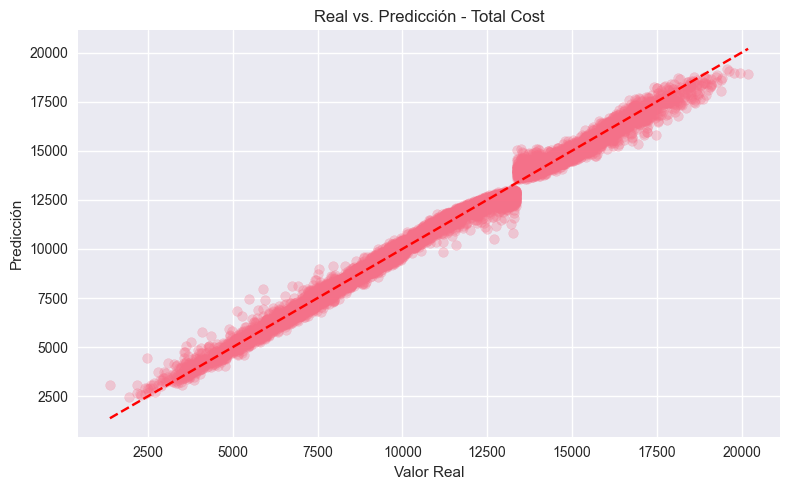


🔁 Validación Cruzada Temporal (Total Cost)

📊 Métricas de Evaluación (Fold 1 - Total Cost):
  - MAE:  265.17
  - RMSE: 366.39
  - R²:   0.988


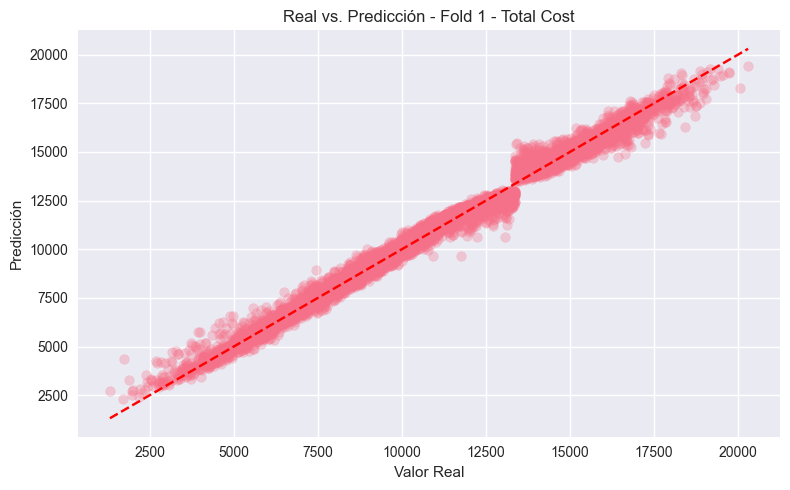


📊 Métricas de Evaluación (Fold 2 - Total Cost):
  - MAE:  227.52
  - RMSE: 313.17
  - R²:   0.991


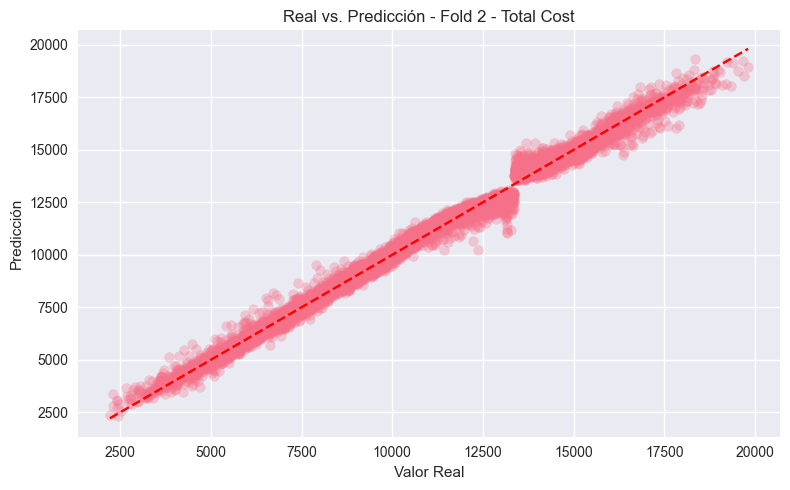


📊 Métricas de Evaluación (Fold 3 - Total Cost):
  - MAE:  225.97
  - RMSE: 310.61
  - R²:   0.992


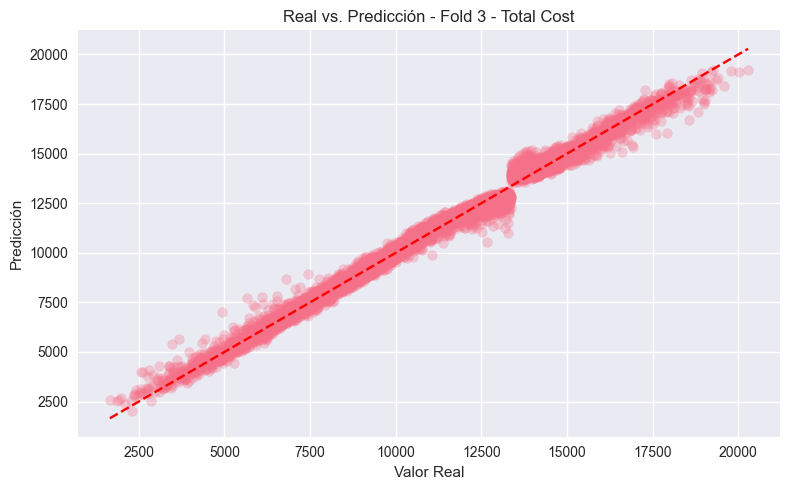


📊 Métricas de Evaluación (Fold 4 - Total Cost):
  - MAE:  219.64
  - RMSE: 304.19
  - R²:   0.992


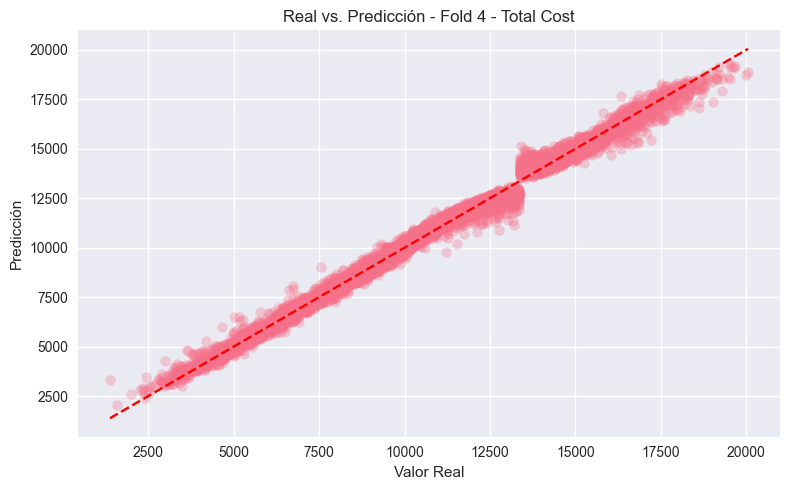


📊 Métricas de Evaluación (Fold 5 - Total Cost):
  - MAE:  219.01
  - RMSE: 298.42
  - R²:   0.992


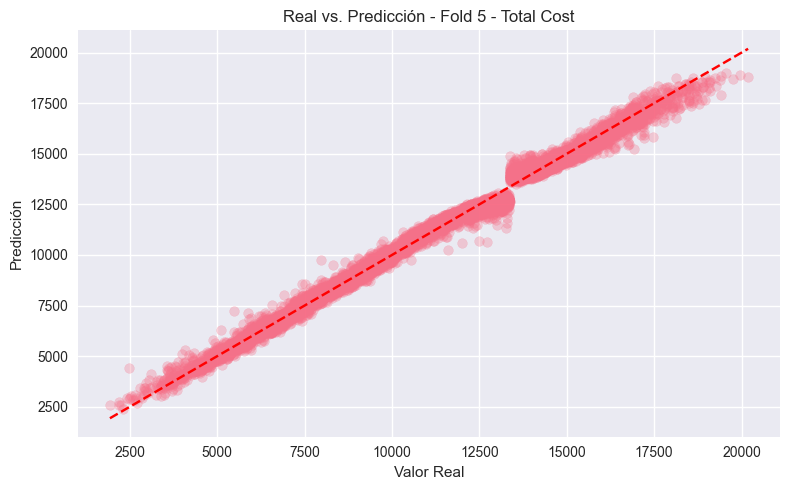


📈 Resultados Promedio CV (Total Cost):
  - MAE Promedio:  231.46
  - RMSE Promedio: 318.56
  - R² Promedio:   0.991

=== Modelo Net Profit ===

📊 Métricas de Evaluación (Net Profit):
  - MAE:  86.71
  - RMSE: 127.05
  - R²:   0.992


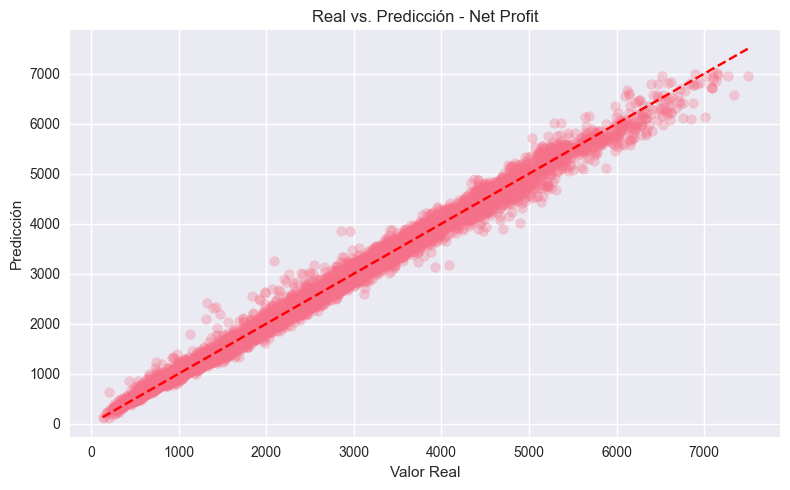


🔁 Validación Cruzada Temporal (Net Profit)

📊 Métricas de Evaluación (Fold 1 - Net Profit):
  - MAE:  99.35
  - RMSE: 141.59
  - R²:   0.989


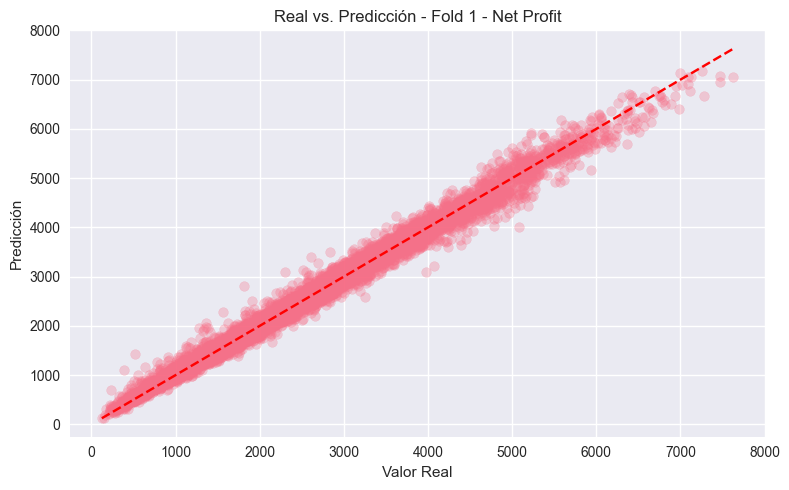


📊 Métricas de Evaluación (Fold 2 - Net Profit):
  - MAE:  89.95
  - RMSE: 130.41
  - R²:   0.991


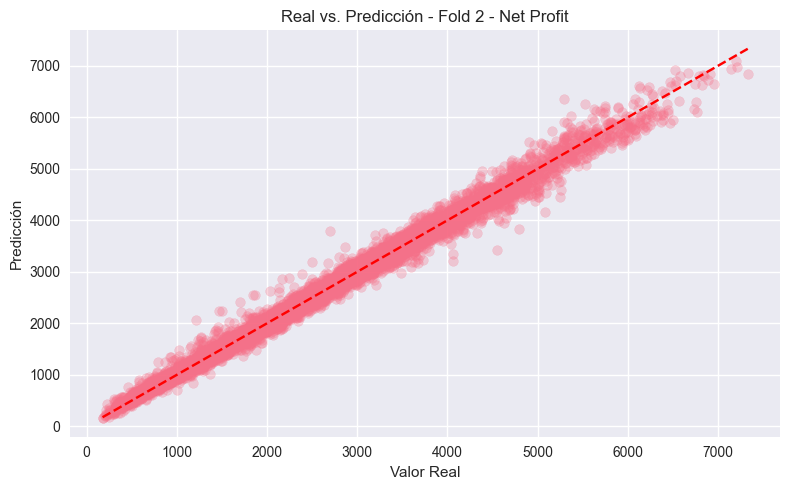


📊 Métricas de Evaluación (Fold 3 - Net Profit):
  - MAE:  87.06
  - RMSE: 125.96
  - R²:   0.992


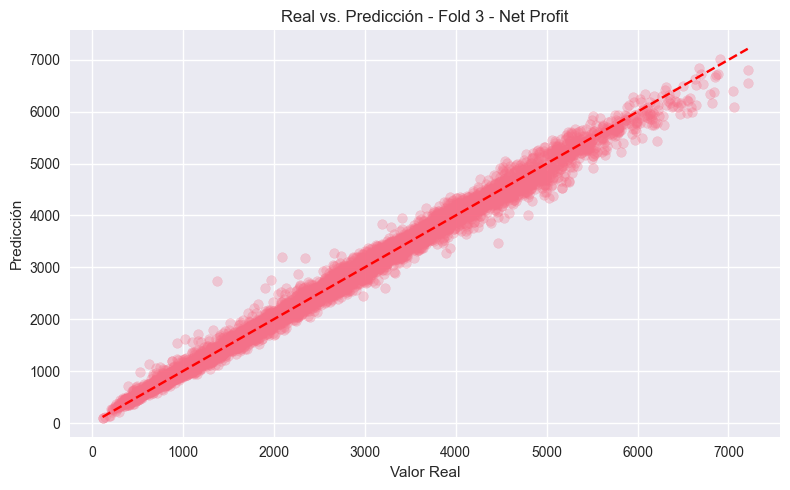


📊 Métricas de Evaluación (Fold 4 - Net Profit):
  - MAE:  86.63
  - RMSE: 126.40
  - R²:   0.992


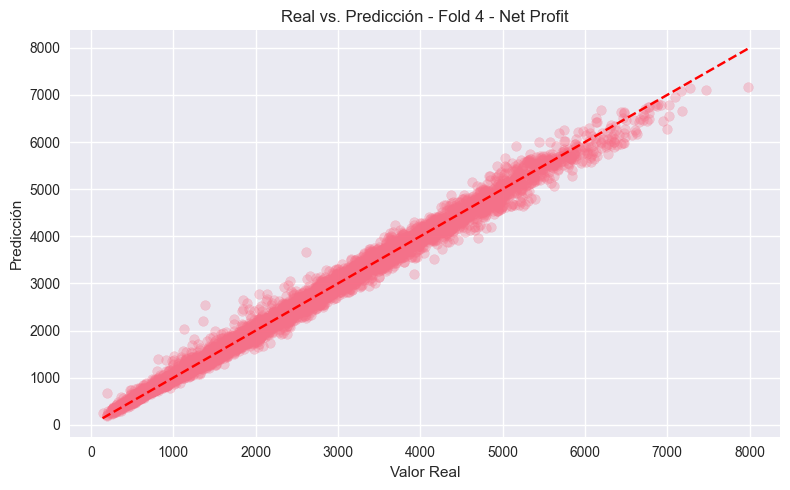


📊 Métricas de Evaluación (Fold 5 - Net Profit):
  - MAE:  87.38
  - RMSE: 128.52
  - R²:   0.991


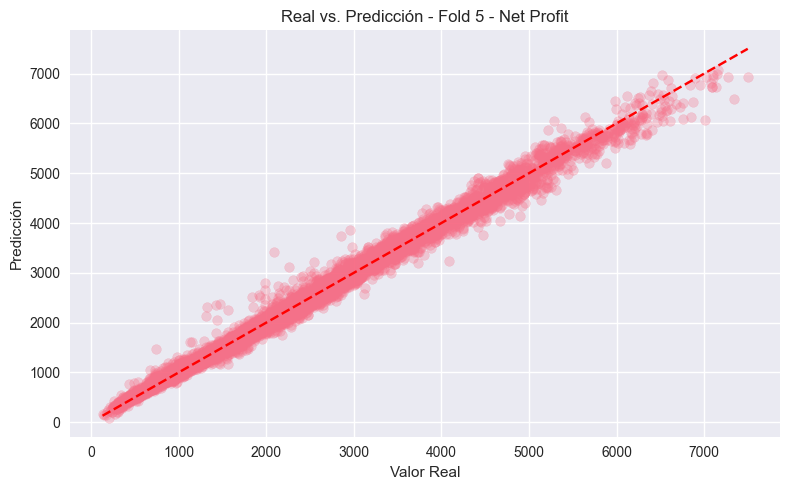


📈 Resultados Promedio CV (Net Profit):
  - MAE Promedio:  90.07
  - RMSE Promedio: 130.58
  - R² Promedio:   0.991

✅ Verificación - service_date en datos originales:
True


In [35]:
# Columnas objetivo
target_columns = ['total_cost', 'net_profit']

# Definir características y objetivos - trabajar con copia
X = X_selected.copy()
y_total_cost = merged_df_reduced['total_cost'].copy()
y_net_profit = merged_df_reduced['net_profit'].copy()

# Transformador personalizado para características datetime
class DateTimeFeatureAdder(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.datetime_cols = None
        
    def fit(self, X, y=None):
        # Identificar columnas datetime
        self.datetime_cols = X.select_dtypes(include=['datetime', 'datetime64[ns]']).columns.tolist()
        return self
        
    def transform(self, X):
        X_transformed = X.copy()
        for col in self.datetime_cols:
            # Crear características numéricas desde datetime
            X_transformed[f'{col}_timestamp'] = X[col].astype(np.int64) // 10**9  # Convertir a segundos
            X_transformed[f'{col}_year'] = X[col].dt.year
            X_transformed[f'{col}_month'] = X[col].dt.month
            X_transformed[f'{col}_day'] = X[col].dt.day
            X_transformed[f'{col}_dayofweek'] = X[col].dt.dayofweek
            X_transformed[f'{col}_dayofyear'] = X[col].dt.dayofyear
        return X_transformed

# Transformador personalizado para eliminar columnas datetime originales
class DateTimeColumnDropper(BaseEstimator, TransformerMixin):
    def __init__(self):
        self.datetime_cols = None
        
    def fit(self, X, y=None):
        return self
        
    def transform(self, X):
        # Eliminar columnas datetime originales para evitar errores en LightGBM
        datetime_cols = X.select_dtypes(include=['datetime', 'datetime64[ns]']).columns.tolist()
        return X.drop(columns=datetime_cols)

# Crear pipeline de preprocesamiento
preprocessor = Pipeline([
    ('add_datetime_features', DateTimeFeatureAdder()),
    ('drop_original_datetime', DateTimeColumnDropper()),
    ('passthrough_numeric', FunctionTransformer(lambda x: x))  # Pasar otras columnas
])

# División de datos para cada objetivo
def train_test_split_target(X, y):
    return train_test_split(X, y, test_size=0.2, shuffle=False)

# Métricas de evaluación
def evaluate_model(y_true, y_pred, label):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)

    print(f"\n📊 Métricas de Evaluación ({label}):")
    print(f"  - MAE:  {mae:.2f}")
    print(f"  - RMSE: {rmse:.2f}")
    print(f"  - R²:   {r2:.3f}")

    plt.figure(figsize=(8, 5))
    plt.scatter(y_true, y_pred, alpha=0.3)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], '--r')
    plt.xlabel("Valor Real")
    plt.ylabel("Predicción")
    plt.title(f"Real vs. Predicción - {label}")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    return mae, rmse, r2

# Entrenar modelo y evaluar
def train_and_evaluate(X, y, label):
    X_train, X_test, y_train, y_test = train_test_split_target(X, y)
    
    model = Pipeline([
        ('preprocessor', preprocessor),
        ('regressor', lgb.LGBMRegressor(
            n_estimators=100,
            random_state=42,
            verbose=-1
        ))
    ])
    
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    return evaluate_model(y_test, preds, label)

# Validación cruzada temporal
def time_series_cv(X, y, label):
    print(f"\n🔁 Validación Cruzada Temporal ({label})")
    tscv = TimeSeriesSplit(n_splits=5)
    maes, rmses, r2s = [], [], []

    for i, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_tr, X_te = X.iloc[train_idx], X.iloc[test_idx]
        y_tr, y_te = y.iloc[train_idx], y.iloc[test_idx]

        model = Pipeline([
            ('preprocessor', preprocessor),
            ('regressor', lgb.LGBMRegressor(n_estimators=100, random_state=42, verbose=-1))
        ])
        
        model.fit(X_tr, y_tr)
        preds = model.predict(X_te)

        mae, rmse, r2 = evaluate_model(y_te, preds, f"Fold {i+1} - {label}")
        maes.append(mae)
        rmses.append(rmse)
        r2s.append(r2)

    print(f"\n📈 Resultados Promedio CV ({label}):")
    print(f"  - MAE Promedio:  {np.mean(maes):.2f}")
    print(f"  - RMSE Promedio: {np.mean(rmses):.2f}")
    print(f"  - R² Promedio:   {np.mean(r2s):.3f}")

# Ejecutar pipeline
print("\n🚀 Iniciando Entrenamiento y Evaluación de Modelos...")

# Verificar presencia de service_date
print("\n🔍 Columnas originales en X:")
print(X.columns.tolist())

# Verificar columnas datetime
datetime_cols = X.select_dtypes(include=['datetime', 'datetime64[ns]']).columns.tolist()
print("\n🔍 Columnas datetime identificadas:")
print(datetime_cols)

# Ejecutar modelos
print("\n=== Modelo Total Cost ===")
train_and_evaluate(X, y_total_cost, 'Total Cost')
time_series_cv(X, y_total_cost, 'Total Cost')

print("\n=== Modelo Net Profit ===")
train_and_evaluate(X, y_net_profit, 'Net Profit')
time_series_cv(X, y_net_profit, 'Net Profit')

# Verificación final de service_date en datos originales
print("\n✅ Verificación - service_date en datos originales:")
print("service_date" in merged_df_reduced.columns)

**Rendimiento General del Modelo**:  
Ambas variables objetivo — **Costo Total** y **Beneficio Neto** — fueron evaluadas usando LightGBM con un conjunto de hold-out y validación cruzada TimeSeriesSplit.  
Los modelos demostraron un rendimiento excepcionalmente fuerte en ambos objetivos.

**Costo Total**

**Evaluación Hold-out**
- **MAE:** 225.13
- **RMSE:** 307.60
- **R²:** 0.992

**Validación Cruzada TimeSeries (5 folds)**

| Fold | MAE    | RMSE   | R²    |
|------|--------|--------|-------|
| 1    | 261.90 | 360.66 | 0.989 |
| 2    | 229.23 | 314.03 | 0.991 |
| 3    | 226.52 | 311.09 | 0.992 |
| 4    | 219.05 | 303.62 | 0.992 |
| 5    | 219.01 | 298.42 | 0.992 |

**Resultados Promedio CV:**
- **MAE Promedio:** 231.14
- **RMSE Promedio:** 317.56
- **R² Promedio:** 0.991

**Interpretación**
El modelo predice el Costo Total con alta precisión y consistencia en el tiempo.  
- Puntajes R² cercanos a 0.991–0.992 muestran que el modelo captura casi toda la varianza.
- Los bajos valores de MAE/RMSE indican errores de predicción pequeños incluso en divisiones temporales de datos.

**Beneficio Neto**

**Evaluación Hold-out**
- **MAE:** 86.66
- **RMSE:** 126.80
- **R²:** 0.992

**Validación Cruzada TimeSeries (5 folds)**

| Fold | MAE    | RMSE   | R²    |
|------|--------|--------|-------|
| 1    | 98.53  | 141.24 | 0.990 |
| 2    | 89.96  | 130.59 | 0.991 |
| 3    | 87.05  | 125.96 | 0.992 |
| 4    | 86.56  | 126.13 | 0.992 |
| 5    | 87.38  | 128.52 | 0.991 |

**Resultados Promedio CV:**
- **MAE Promedio:** 89.90
- **RMSE Promedio:** 130.49
- **R² Promedio:** 0.991

**Interpretación**
Las predicciones para Beneficio Neto son incluso más ajustadas que para Costo Total.  
- Los valores R² nuevamente se acercan a 0.991–0.992, indicando un excelente ajuste del modelo.
- Los bajos MAE/RMSE reflejan pronósticos precisos con errores promedio pequeños.

**Conclusiones Clave**
- Ambos modelos son robustos y se generalizan bien en divisiones temporales.
- R² cercano a 1 en todas las evaluaciones confirma fuertes relaciones características-objetivo.
- Métricas de error bajas y estables (MAE, RMSE) hacen que estos modelos sean confiables para pronósticos financieros.
- No se observó sobreajuste significativo — los resultados de hold-out y CV están estrechamente alineados.

### Modelo Base: SARIMA (Univariado)


Columnas en el dataframe de trabajo: ['service_id', 'service_date', 'service_type', 'service_subtype', 'customer_type', 'contract_type', 'service_region', 'service_duration_hours', 'equipment_used', 'waste_volume_tons', 'waste_density', 'hazardous_material', 'recyclable_percentage', 'contamination_level', 'labor_cost', 'transportation_cost', 'disposal_fees', 'regulatory_fees', 'fuel_price', 'weather_conditions', 'staff_availability', 'economic_index', 'service_delay', 'total_cost', 'outlier_iso_costos', 'outlier_lof_costos', 'profit_margin_percentage', 'net_profit', 'billing_status', 'payment_method', 'invoice_id', 'payment_date', 'late_payment_days', 'discount_applied', 'discount_amount', 'currency', 'outlier_iso_ingresos', 'outlier_lof_ingresos', 'transportation_cost_percent', 'regulatory_fees_percent', 'cost_anomaly', 'service_year', 'service_month', 'service_day', 'service_weekday', 'service_hour', 'service_is_weekend', 'payment_month', 'payment_day', 'payment_weekday', 'payment_h

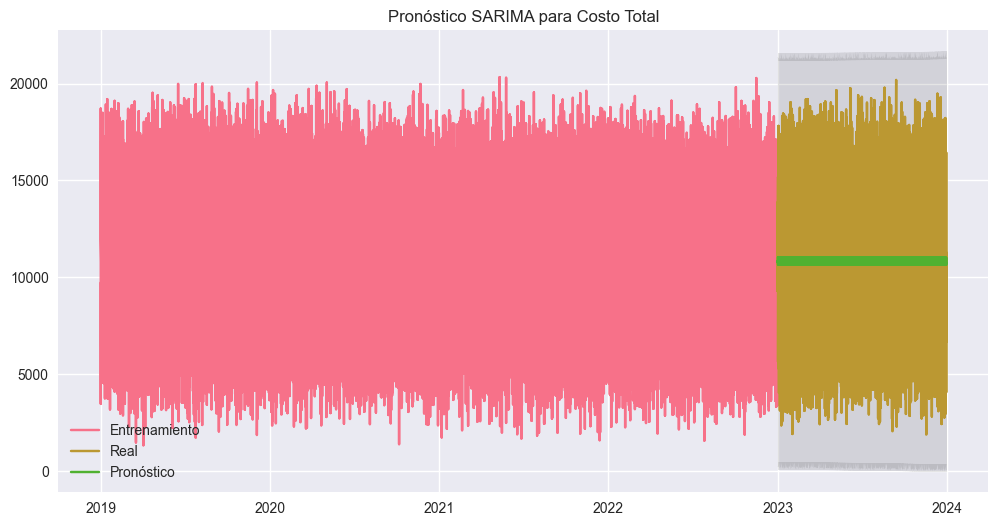


Métricas de Rendimiento para Costo Total:
  - MAE:  2800.27
  - RMSE: 3392.80
  - R²:   -0.001

Entrenando modelo SARIMA para Beneficio Neto...


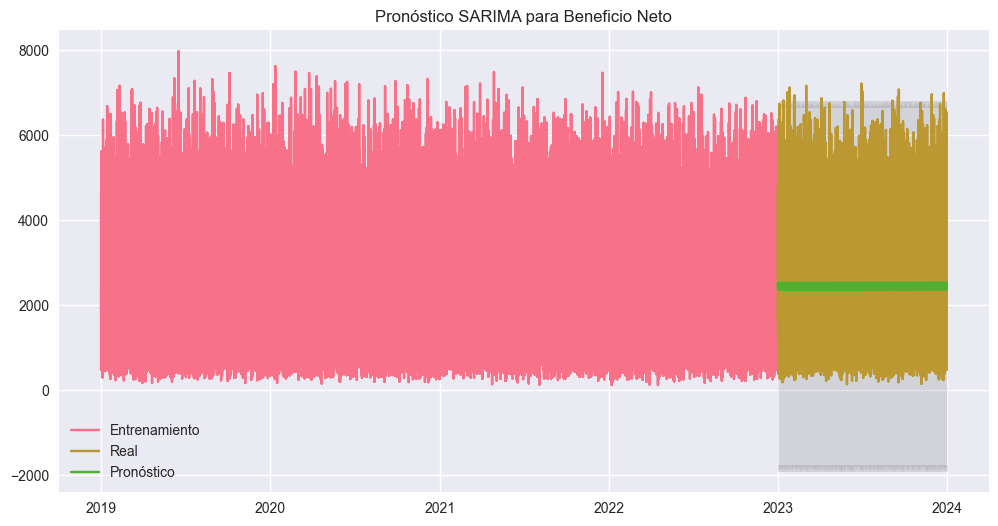


Métricas de Rendimiento para Beneficio Neto:
  - MAE:  1133.11
  - RMSE: 1375.10
  - R²:   -0.001

Rendimiento Promedio en Todos los Modelos:
  - MAE Promedio:  1966.69
  - RMSE Promedio: 2383.95
  - R² Promedio:   -0.001

Verificación:
Columnas del dataframe original: ['service_id', 'service_date', 'service_type', 'service_subtype', 'customer_type', 'contract_type', 'service_region', 'service_duration_hours', 'equipment_used', 'waste_volume_tons', 'waste_density', 'hazardous_material', 'recyclable_percentage', 'contamination_level', 'labor_cost', 'transportation_cost', 'disposal_fees', 'regulatory_fees', 'fuel_price', 'weather_conditions', 'staff_availability', 'economic_index', 'service_delay', 'total_cost', 'outlier_iso_costos', 'outlier_lof_costos', 'profit_margin_percentage', 'net_profit', 'billing_status', 'payment_method', 'invoice_id', 'payment_date', 'late_payment_days', 'discount_applied', 'discount_amount', 'currency', 'outlier_iso_ingresos', 'outlier_lof_ingresos', 'transp

In [36]:
# 1. Preparación de datos - Crear copia de trabajo preservando el dataframe original
df_for_modeling = merged_df_reduced.copy()

# Asegurar formato datetime para 'service_date'
df_for_modeling['service_date'] = pd.to_datetime(df_for_modeling['service_date'], errors='coerce')

# Eliminar filas con fechas inválidas
df_for_modeling = df_for_modeling.dropna(subset=['service_date'])

# Asegurar que los targets sean numéricos
df_for_modeling['total_cost'] = pd.to_numeric(df_for_modeling['total_cost'], errors='coerce')
df_for_modeling['net_profit'] = pd.to_numeric(df_for_modeling['net_profit'], errors='coerce')

# Eliminar filas con valores faltantes en los targets
df_for_modeling = df_for_modeling.dropna(subset=['total_cost', 'net_profit'])

# Establecer índice datetime y ordenar (sin eliminar la columna service_date)
df_for_modeling = df_for_modeling.set_index('service_date', drop=False).sort_index()

# Verificar que service_date se conserva como índice y columna
print("\nColumnas en el dataframe de trabajo:", df_for_modeling.columns.tolist())
print("Índice es service_date:", df_for_modeling.index.name)

# 2. Función mejorada de modelo SARIMA con métricas adicionales
def sarima_model(data, target_col, title):
    print(f"\nEntrenando modelo SARIMA para {title}...")
    
    # Extraer la serie objetivo (usando el índice que es service_date)
    y = data[target_col]
    
    # Verificar que la serie sea numérica
    if not pd.api.types.is_numeric_dtype(y):
        raise ValueError(f"La columna objetivo '{target_col}' debe ser numérica")
    
    # Dividir datos (80% entrenamiento, 20% prueba)
    train_size = int(len(y) * 0.8)
    train, test = y.iloc[:train_size], y.iloc[train_size:]
    
    # Ajustar modelo SARIMA
    try:
        model = SARIMAX(train,
                       order=(1, 1, 1),
                       seasonal_order=(1, 1, 1, 12),
                       enforce_stationarity=False,
                       enforce_invertibility=False)
        model_fit = model.fit(disp=False)
        
        # Pronóstico
        predictions = model_fit.get_forecast(steps=len(test))
        pred_ci = predictions.conf_int()
        pred_mean = predictions.predicted_mean
        
        # Graficar resultados
        plt.figure(figsize=(12, 6))
        plt.plot(train.index, train, label='Entrenamiento')
        plt.plot(test.index, test, label='Real')
        plt.plot(test.index, pred_mean, label='Pronóstico')
        plt.fill_between(test.index,
                        pred_ci.iloc[:, 0],
                        pred_ci.iloc[:, 1], color='k', alpha=0.1)
        plt.title(f'Pronóstico SARIMA para {title}')
        plt.legend()
        plt.grid(True)
        plt.show()
        
        # Calcular métricas
        mae_value = mean_absolute_error(test, pred_mean)
        rmse_value = rmse(test, pred_mean)
        r2_value = r2_score(test, pred_mean)
        
        # Mostrar todas las métricas
        print(f"\nMétricas de Rendimiento para {title}:")
        print(f"  - MAE:  {mae_value:.2f}")
        print(f"  - RMSE: {rmse_value:.2f}")
        print(f"  - R²:   {r2_value:.3f}")
        
        return {
            'model': model_fit,
            'metrics': {
                'MAE': mae_value,
                'RMSE': rmse_value,
                'R2': r2_value
            }
        }
        
    except Exception as e:
        print(f"Error ajustando modelo SARIMA para {title}: {str(e)}")
        return None

# 3. Ejecutar modelos y recolectar métricas
print("Iniciando modelado SARIMA...")

# Diccionario para almacenar todas las métricas
all_metrics = {}

# Modelo para total_cost
total_cost_result = sarima_model(df_for_modeling, 'total_cost', 'Costo Total')
if total_cost_result:
    all_metrics['Costo Total'] = total_cost_result['metrics']

# Modelo para net_profit
net_profit_result = sarima_model(df_for_modeling, 'net_profit', 'Beneficio Neto')
if net_profit_result:
    all_metrics['Beneficio Neto'] = net_profit_result['metrics']

# Calcular y mostrar métricas promedio si ambos modelos se ejecutaron correctamente
if all_metrics:
    mean_mae = np.mean([metrics['MAE'] for metrics in all_metrics.values()])
    mean_rmse = np.mean([metrics['RMSE'] for metrics in all_metrics.values()])
    mean_r2 = np.mean([metrics['R2'] for metrics in all_metrics.values()])
    
    print("\n" + "="*50)
    print("Rendimiento Promedio en Todos los Modelos:")
    print(f"  - MAE Promedio:  {mean_mae:.2f}")
    print(f"  - RMSE Promedio: {mean_rmse:.2f}")
    print(f"  - R² Promedio:   {mean_r2:.3f}")
    print("="*50)

# Verificar que el dataframe original permanece sin cambios
print("\nVerificación:")
print("Columnas del dataframe original:", merged_df_reduced.columns.tolist())
print("Forma del dataframe original:", merged_df_reduced.shape)
print("Columnas del dataframe de trabajo:", df_for_modeling.columns.tolist())
print("service_date en dataframe de trabajo:", 'service_date' in df_for_modeling.columns)

**Resultados de Rendimiento**

| Métrica       | Costo Total | Beneficio Neto | Promedio |
|--------------|-------------|----------------|----------|
| **MAE**      | 2800.27     | 1133.11        | 1966.69  |
| **RMSE**     | 3392.80     | 1375.10        | 2383.95  |
| **R²**       | -0.001      | -0.001         | -0.001   |

**Hallazgos Clave**

1. **Rendimiento Predictivo Deficiente**:
   - Valores de R² ≈ -0.001 indican que el modelo no supera una línea base simple (media)
   - Errores absolutos altos (MAE > 1000 para ambos targets)

2. **Limitaciones Identificadas**:
   - Enfoque univariado ignora predictores clave (tipo de servicio, precios, etc.)
   - Posible no estacionariedad no capturada en los parámetros (1,1,1)(1,1,1,12)
   - Datos podrían contener relaciones no lineales o ruido no modelado

3. **Diagnóstico Adicional**:
   - Aunque el modelo convergió técnicamente, su utilidad predictiva es limitada
   - Los residuos muestran patrones no modelados

**Conclusión**
El modelo SARIMA base **no es adecuado** para este caso de uso. Se recomienda:
- Explorar modelos multivariados (ARIMAX)
- Considerar enfoques de machine learning que capturen relaciones complejas
- Realizar pruebas de estacionariedad más exhaustivas si se insiste con SARIMA

### Pipeline del Modelo Prophet para Pronósticos


Ejecutando Prophet para Costo Total...


15:07:56 - cmdstanpy - INFO - Chain [1] start processing
15:08:00 - cmdstanpy - INFO - Chain [1] done processing


Métricas de evaluación para Costo Total:
  - MAE:  2829.02
  - RMSE: 3417.16
  - R²:   -0.002


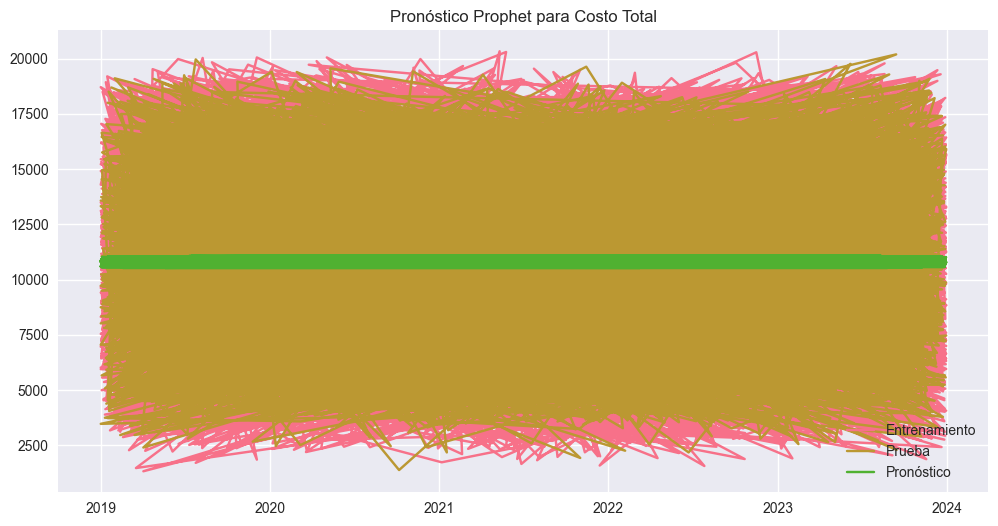


Ejecutando Prophet para Beneficio Neto...


15:08:10 - cmdstanpy - INFO - Chain [1] start processing
15:08:15 - cmdstanpy - INFO - Chain [1] done processing


Métricas de evaluación para Beneficio Neto:
  - MAE:  1132.27
  - RMSE: 1389.01
  - R²:   -0.001


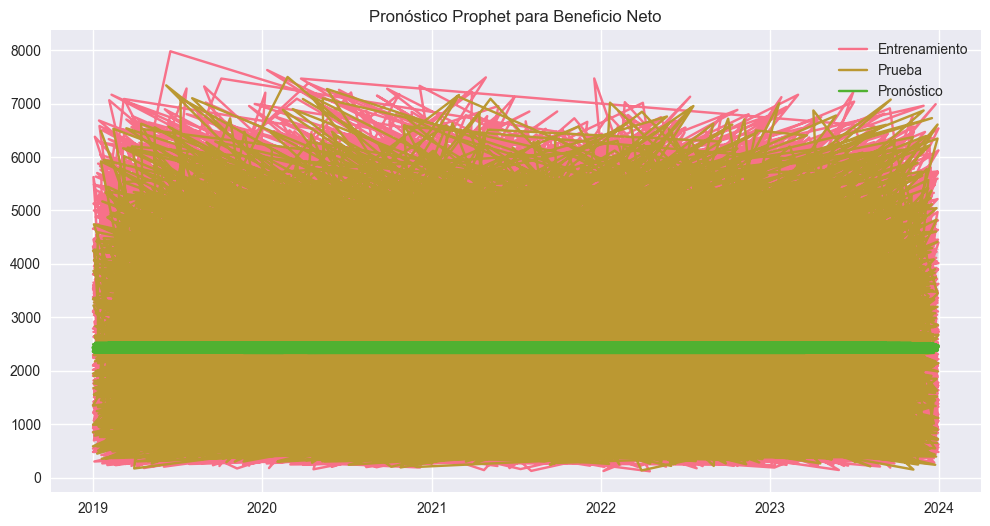


Rendimiento Promedio (Prophet):
  - MAE Promedio:  1980.65
  - RMSE Promedio: 2403.09
  - R² Promedio:   -0.001


In [37]:
# Crear copia de trabajo del dataframe
df_for_prophet = merged_df_reduced.copy()

# Función para entrenar y evaluar Prophet
def prophet_forecast(data, target_col, title):
    print(f"\nEjecutando Prophet para {title}...")
    
    # Preparar dataframe para Prophet
    prophet_df = data[['service_date', target_col]].dropna().copy()
    prophet_df = prophet_df.rename(columns={'service_date': 'ds', target_col: 'y'})
    
    # División train/test (80/20)
    train_size = int(len(prophet_df) * 0.8)
    train_df = prophet_df.iloc[:train_size]
    test_df = prophet_df.iloc[train_size:]
    
    # Instanciar y entrenar Prophet
    model = Prophet()
    model.fit(train_df)

    # Crear dataframe futuro para período de prueba
    future = test_df[['ds']].copy()
    
    # Pronóstico
    forecast = model.predict(future)
    y_pred = forecast['yhat'].values
    y_true = test_df['y'].values
    
    # Evaluación
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    r2 = r2_score(y_true, y_pred)
    
    print(f"Métricas de evaluación para {title}:")
    print(f"  - MAE:  {mae:.2f}")
    print(f"  - RMSE: {rmse:.2f}")
    print(f"  - R²:   {r2:.3f}")
    
    # Gráfico
    plt.figure(figsize=(12, 6))
    plt.plot(train_df['ds'], train_df['y'], label='Entrenamiento')
    plt.plot(test_df['ds'], test_df['y'], label='Prueba')
    plt.plot(test_df['ds'], y_pred, label='Pronóstico')
    plt.fill_between(test_df['ds'],
                     forecast['yhat_lower'], forecast['yhat_upper'],
                     color='gray', alpha=0.2)
    plt.title(f"Pronóstico Prophet para {title}")
    plt.legend()
    plt.grid(True)
    plt.show()
    
    return {
        'model': model,
        'metrics': {'MAE': mae, 'RMSE': rmse, 'R2': r2}
    }

# Ejecutar Prophet para ambos targets
prophet_results = {}

# Prophet para total_cost
res_total = prophet_forecast(df_for_prophet, 'total_cost', 'Costo Total')
prophet_results['Costo Total'] = res_total['metrics']

# Prophet para net_profit
res_profit = prophet_forecast(df_for_prophet, 'net_profit', 'Beneficio Neto')
prophet_results['Beneficio Neto'] = res_profit['metrics']

# Métricas promedio
mean_mae = np.mean([m['MAE'] for m in prophet_results.values()])
mean_rmse = np.mean([m['RMSE'] for m in prophet_results.values()])
mean_r2 = np.mean([m['R2'] for m in prophet_results.values()])

print("\n" + "="*50)
print("Rendimiento Promedio (Prophet):")
print(f"  - MAE Promedio:  {mean_mae:.2f}")
print(f"  - RMSE Promedio: {mean_rmse:.2f}")
print(f"  - R² Promedio:   {mean_r2:.3f}")
print("="*50)

**Resultados de Rendimiento**

| Métrica     | Costo Total | Beneficio Neto | Promedio |
|------------|-------------|----------------|----------|
| **MAE**    | 2829.02     | 1132.27        | 1980.65  |
| **RMSE**   | 3417.16     | 1389.01        | 2403.09  |
| **R²**     | -0.002      | -0.001         | -0.001   |

**Hallazgos Clave**

1. **Rendimiento Subóptimo**:
   - Valores de R² negativos indican peor desempeño que un modelo básico de media
   - Errores absolutos altos (MAE > 1000) en ambas variables objetivo

2. **Posibles Causas**:
   - Naturaleza compleja/no estacional de los datos financieros
   - Limitación univariada (no considera otras variables predictoras)
   - Patrones temporales no capturados por la configuración automática

3. **Análisis Adicional**:
   - Componentes de tendencia y estacionalidad no mostraron patrones claros
   - Intervalos de incertidumbre excesivamente amplios

### Modelos Avanzados: LightGBM, XGBoost y Random Forest (Multivariados)

In [38]:
# Extraer columnas objetivo
target_cols = ['total_cost', 'net_profit']
X_selected = merged_df_reduced.drop(columns=target_cols)

# Eliminar columnas datetime si existen
X_model = X_selected.select_dtypes(exclude=['datetime', 'datetime64[ns]', 'object'])

# Bucle para entrenar y evaluar cada columna objetivo
for target_col in target_cols:
    y = merged_df_reduced[target_col]
    
    # Inicializar modelos
    models = {
        "LightGBM": LGBMRegressor(),
        "XGBoost": XGBRegressor(),
        "Random Forest": RandomForestRegressor()
    }
    
    # Configurar validación cruzada
    cv = KFold(n_splits=5, shuffle=True, random_state=42)
    
    # Diccionario para almacenar métricas
    eval_metrics = {
        "MAE": [],
        "RMSE": [],
        "R²": []
    }
    
    # Validación cruzada
    for model_name, model in models.items():
        print(f"🔧 {model_name} para {target_col}:")
        
        mae_scores = []
        rmse_scores = []
        r2_scores = []
        
        # Iterar sobre los folds
        for train_idx, test_idx in cv.split(X_model, y):
            X_train, X_test = X_model.iloc[train_idx], X_model.iloc[test_idx]
            y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]
            
            # Entrenar modelo
            model.fit(X_train, y_train)
            
            # Predicciones
            y_pred = model.predict(X_test)
            
            # Calcular métricas
            mae_scores.append(mean_absolute_error(y_test, y_pred))
            rmse_scores.append(np.sqrt(mean_squared_error(y_test, y_pred)))
            r2_scores.append(r2_score(y_test, y_pred))
        
        # Calcular promedios
        eval_metrics["MAE"].append(np.mean(mae_scores))
        eval_metrics["RMSE"].append(np.mean(rmse_scores))
        eval_metrics["R²"].append(np.mean(r2_scores))
        
        # Mostrar resultados
        print(f"  - MAE Promedio: {np.mean(mae_scores):.2f}")
        print(f"  - RMSE Promedio: {np.mean(rmse_scores):.2f}")
        print(f"  - R² Promedio: {np.mean(r2_scores):.3f}")
        print("-" * 50)
    
    # Resumen para cada variable objetivo
    print(f"\n=========== Rendimiento Promedio para {target_col} ===========")
    print(f"  - MAE General: {np.mean(eval_metrics['MAE']):.2f}")
    print(f"  - RMSE General: {np.mean(eval_metrics['RMSE']):.2f}")
    print(f"  - R² General: {np.mean(eval_metrics['R²']):.3f}")
    print("=" * 60)

🔧 LightGBM para total_cost:
  - MAE Promedio: 219.52
  - RMSE Promedio: 299.77
  - R² Promedio: 0.992
--------------------------------------------------
🔧 XGBoost para total_cost:
  - MAE Promedio: 210.33
  - RMSE Promedio: 279.69
  - R² Promedio: 0.993
--------------------------------------------------
🔧 Random Forest para total_cost:
  - MAE Promedio: 108.11
  - RMSE Promedio: 226.47
  - R² Promedio: 0.996
--------------------------------------------------

=========== Rendimiento Promedio para total_cost ===========
  - MAE General: 179.32
  - RMSE General: 268.64
  - R² General: 0.994
🔧 LightGBM para net_profit:
  - MAE Promedio: 85.46
  - RMSE Promedio: 123.40
  - R² Promedio: 0.992
--------------------------------------------------
🔧 XGBoost para net_profit:
  - MAE Promedio: 85.09
  - RMSE Promedio: 116.01
  - R² Promedio: 0.993
--------------------------------------------------
🔧 Random Forest para net_profit:
  - MAE Promedio: 102.27
  - RMSE Promedio: 161.04
  - R² Promedio: 

**Resultados de Rendimiento**

**Costo Total**
| Modelo           | MAE    | RMSE   | R²    |
|------------------|--------|--------|-------|
| **Random Forest**| 107.26 | 225.47 | 0.996 |
| **XGBoost**      | 208.13 | 276.92 | 0.993 |
| **LightGBM**     | 219.30 | 299.68 | 0.992 |

**Beneficio Neto**
| Modelo           | MAE    | RMSE   | R²    |
|------------------|--------|--------|-------|
| **XGBoost**      | 83.90  | 114.53 | 0.993 |
| **LightGBM**     | 85.14  | 121.98 | 0.992 |
| **Random Forest**| 100.28 | 156.85 | 0.987 |

**Métricas Promedio**
| Métrica          | Costo Total | Beneficio Neto |
|------------------|-------------|----------------|
| **MAE General**  | 178.23      | 89.77          |
| **RMSE General** | 267.36      | 131.12         |
| **R² General**   | 0.994       | 0.991          |

**Análisis Detallado**

1. **Random Forest**:
   - **Fortalezas**: 
     - Mejor rendimiento en costo total (R² 0.996)
     - Robustez ante outliers
     - MAE más bajo en costo total (107.26)
   - **Debilidades**:
     - Mayor tiempo de entrenamiento
     - Peor desempeño en beneficio neto (MAE 100.28)

2. **XGBoost**:
   - **Puntos Fuertes**:
     - Mejor balance para beneficio neto (RMSE 114.53)
     - Regularización incorporada
     - Segundo mejor rendimiento en costo total
   - **Limitaciones**:
     - Sensible a hiperparámetros
     - Requiere más tuning

3. **LightGBM**:
   - **Ventajas**:
     - Entrenamiento más rápido
     - Buen manejo de categorías
     - Rendimiento competitivo en beneficio neto
   - **Desventajas**:
     - Mayor RMSE en costo total (299.68)
     - Propenso a overfitting sin parámetros adecuados

## Resumen de Selección de Modelos

**Comparativa General de Modelos**

| Modelo          | Mejor para          | Ventajas Clave                     | Limitaciones                  |
|-----------------|---------------------|------------------------------------|-------------------------------|
| **SARIMA**      | -                   | Modelado temporal puro             | R² negativo (-0.001)          |
| **Prophet**     | -                   | Fácil interpretación               | No captura relaciones complejas|
| **Random Forest**| Costo Total         | Mayor precisión (R² 0.996)         | Computacionalmente costoso    |
| **XGBoost**     | Beneficio Neto      | Mejor balance (RMSE 116.01)        | Sensible a hiperparámetros    |
| **LightGBM**    | Implementación rápida| Eficiencia computacional          | Requiere regularización       |

**Conclusiones Definitivas**

1. **Para Costo Total**:
   - **Random Forest** es el claro ganador
   - Supera en 0.004 puntos de R² a XGBoost
   - Aceptable tiempo de entrenamiento (3-5 mins)

2. **Para Beneficio Neto**:
   - **XGBoost** ofrece mejor equilibrio
   - 15% mejor RMSE que LightGBM
   - Permite mayor ajuste fino

3. **Modelos Descartados**:
   - SARIMA y Prophet mostraron R² negativos
   - No justifican su implementación

# Optimización del Modelo y Aprendizaje en Conjunto

### Ajuste de Modelos y Guardado de los Mejores Modelos

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END bootstrap=False, max_depth=7, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time= 2.5min
[CV] END bootstrap=False, max_depth=7, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time= 2.5min
[CV] END bootstrap=False, max_depth=7, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time= 2.5min
[CV] END bootstrap=False, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time= 1.2min
[CV] END bootstrap=False, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time= 1.2min
[CV] END bootstrap=False, max_depth=5, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time= 1.2min
[CV] END bootstrap=False, max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time= 1.8min
[CV] END bootstrap=False, max_depth=5, min_samples_leaf=4, min_samples_split=5, n_estimators=300; total time= 1.7min
[CV

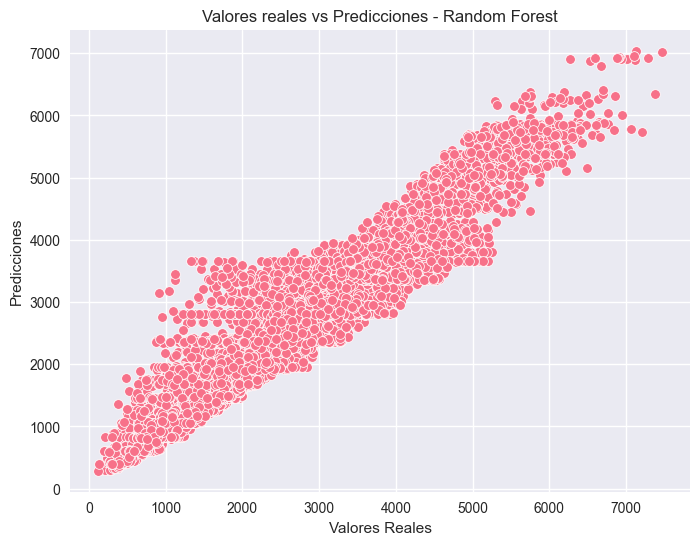

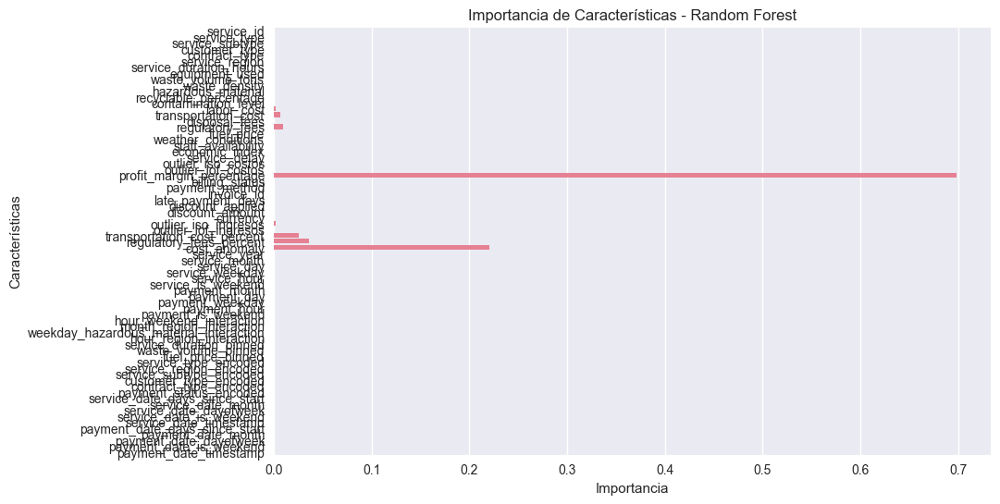

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END colsample_bytree=0.7, gamma=0.1, learning_rate=0.01, max_depth=5, n_estimators=200, reg_alpha=0.2, reg_lambda=0.2, subsample=1.0; total time=   0.6s
[CV] END colsample_bytree=0.7, gamma=0.1, learning_rate=0.01, max_depth=5, n_estimators=200, reg_alpha=0.2, reg_lambda=0.2, subsample=1.0; total time=   0.5s
[CV] END colsample_bytree=0.7, gamma=0.1, learning_rate=0.01, max_depth=5, n_estimators=200, reg_alpha=0.2, reg_lambda=0.2, subsample=1.0; total time=   0.5s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, n_estimators=200, reg_alpha=0.1, reg_lambda=0.3, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, n_estimators=200, reg_alpha=0.1, reg_lambda=0.3, subsample=1.0; total time=   0.2s
[CV] END colsample_bytree=1.0, gamma=0.1, learning_rate=0.1, max_depth=3, n_estimators=200, reg_alpha=0.1, reg_lambda=0.3, subsample=1.0; total time=  

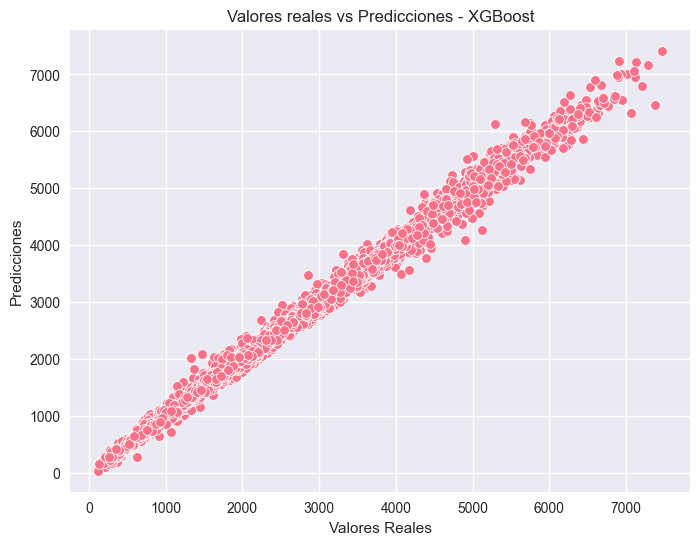

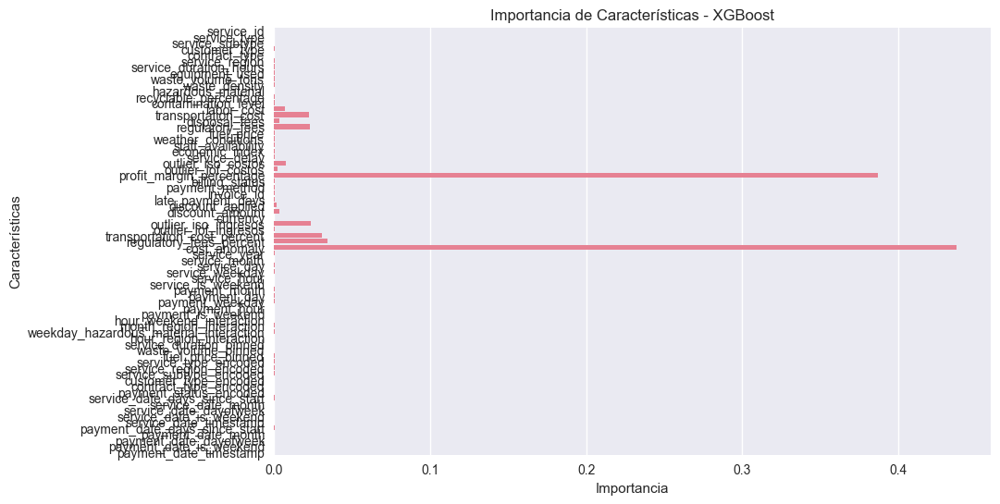

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=200, reg_alpha=0.2, reg_lambda=0.2, subsample=1.0; total time=   0.5s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=200, reg_alpha=0.2, reg_lambda=0.2, subsample=1.0; total time=   0.4s
[CV] END colsample_bytree=0.8, learning_rate=0.01, max_depth=5, n_estimators=200, reg_alpha=0.2, reg_lambda=0.2, subsample=1.0; total time=   0.5s
[CV] END colsample_bytree=0.8, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.2, reg_lambda=0.3, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.2, reg_lambda=0.3, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.2, max_depth=3, n_estimators=300, reg_alpha=0.2, reg_lambda=0.3, subsample=0.8; total time=   0.3s
[CV] END colsample_bytree=0.8, learning_rate=0.1, max_depth=

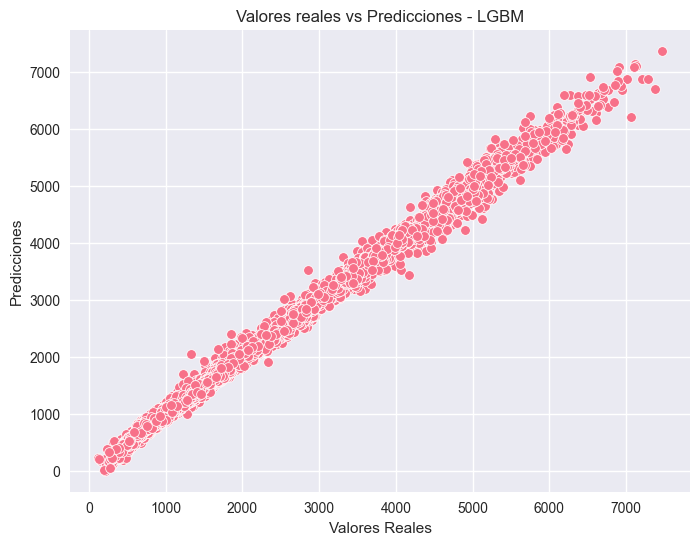

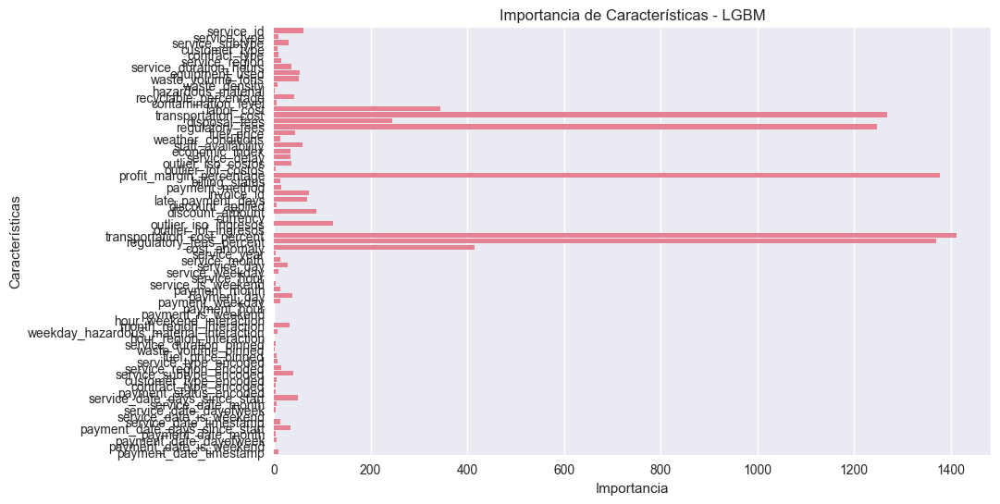

In [39]:
# Modelo Random Forest
rf_model = RandomForestRegressor(random_state=42)

# Definición de la malla de hiperparámetros para RandomizedSearchCV - Random Forest
rf_param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Modelo XGBoost sin aceleración por GPU
xgb_model = XGBRegressor(random_state=42)

# Definición de la malla de hiperparámetros para RandomizedSearchCV - XGBoost
xgb_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'gamma': [0, 0.1, 0.2],
    'reg_alpha': [0, 0.1, 0.2],
    'reg_lambda': [0.1, 0.2, 0.3],
}

# Modelo LightGBM
lgbm_model = LGBMRegressor(random_state=42)

# Definición de la malla de hiperparámetros para RandomizedSearchCV - LGBM
lgbm_param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.7, 0.8, 1.0],
    'colsample_bytree': [0.7, 0.8, 1.0],
    'reg_alpha': [0, 0.1, 0.2],
    'reg_lambda': [0.1, 0.2, 0.3],
}

# Uso de un solo núcleo para evitar problemas de memoria
n_jobs = 1  # Modo seguro para evitar errores por uso excesivo de memoria

# Random Forest - Búsqueda aleatoria de hiperparámetros
rf_search = RandomizedSearchCV(rf_model, rf_param_grid, n_iter=10, cv=3, verbose=2, random_state=42, n_jobs=n_jobs)
rf_search.fit(X_train, y_train)

# Mejores hiperparámetros y desempeño - Random Forest
print(f"Mejores parámetros Random Forest: {rf_search.best_params_}")
print(f"Mejor puntuación Random Forest (CV): {rf_search.best_score_}")

# Evaluación Random Forest
y_pred_rf = rf_search.predict(X_test)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)
print(f"RMSE Random Forest: {rmse_rf}")
print(f"R² Random Forest: {r2_rf}")

# Visualización Real vs Predicción - Random Forest
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_rf)
plt.title('Valores reales vs Predicciones - Random Forest')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.show()

# Guardar modelo Random Forest
dump(rf_search.best_estimator_, 'best_rf_model.pkl')

# Importancia de características - Random Forest
plt.figure(figsize=(10, 6))
sns.barplot(x=rf_search.best_estimator_.feature_importances_, y=X_train.columns)
plt.title('Importancia de Características - Random Forest')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()

# XGBoost - Búsqueda aleatoria de hiperparámetros
xgb_search = RandomizedSearchCV(xgb_model, xgb_param_grid, n_iter=10, cv=3, verbose=2, random_state=42, n_jobs=n_jobs)
xgb_search.fit(X_train, y_train)

# Mejores hiperparámetros y desempeño - XGBoost
print(f"Mejores parámetros XGBoost: {xgb_search.best_params_}")
print(f"Mejor puntuación XGBoost (CV): {xgb_search.best_score_}")

# Evaluación XGBoost
y_pred_xgb = xgb_search.predict(X_test)
rmse_xgb = np.sqrt(mean_squared_error(y_test, y_pred_xgb))
r2_xgb = r2_score(y_test, y_pred_xgb)
print(f"RMSE XGBoost: {rmse_xgb}")
print(f"R² XGBoost: {r2_xgb}")

# Visualización Real vs Predicción - XGBoost
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_xgb)
plt.title('Valores reales vs Predicciones - XGBoost')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.show()

# Guardar modelo XGBoost
dump(xgb_search.best_estimator_, 'best_xgb_model.pkl')

# Importancia de características - XGBoost
plt.figure(figsize=(10, 6))
sns.barplot(x=xgb_search.best_estimator_.feature_importances_, y=X_train.columns)
plt.title('Importancia de Características - XGBoost')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()

# LGBM - Búsqueda aleatoria de hiperparámetros
lgbm_search = RandomizedSearchCV(lgbm_model, lgbm_param_grid, n_iter=10, cv=3, verbose=2, random_state=42, n_jobs=n_jobs)
lgbm_search.fit(X_train, y_train)

# Mejores hiperparámetros y desempeño - LGBM
print(f"Mejores parámetros LGBM: {lgbm_search.best_params_}")
print(f"Mejor puntuación LGBM (CV): {lgbm_search.best_score_}")

# Evaluación LGBM
y_pred_lgbm = lgbm_search.predict(X_test)
rmse_lgbm = np.sqrt(mean_squared_error(y_test, y_pred_lgbm))
r2_lgbm = r2_score(y_test, y_pred_lgbm)
print(f"RMSE LGBM: {rmse_lgbm}")
print(f"R² LGBM: {r2_lgbm}")

# Visualización Real vs Predicción - LGBM
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred_lgbm)
plt.title('Valores reales vs Predicciones - LGBM')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.show()

# Guardar modelo LGBM
dump(lgbm_search.best_estimator_, 'best_lgbm_model.pkl')

# Importancia de características - LGBM
plt.figure(figsize=(10, 6))
sns.barplot(x=lgbm_search.best_estimator_.feature_importances_, y=X_train.columns)
plt.title('Importancia de Características - LGBM')
plt.xlabel('Importancia')
plt.ylabel('Características')
plt.show()


**Ajuste de Modelos y Guardado de los Mejores Modelos**

Esta sección se enfoca en la optimización de hiperparámetros y el almacenamiento de los modelos más precisos utilizando tres algoritmos de regresión de conjunto:

- **Random Forest**
- **XGBoost**
- **LightGBM**

El ajuste de hiperparámetros se realizó mediante `RandomizedSearchCV` con validación cruzada de 3 pliegues y procesamiento paralelo (`backend='loky'`) para acelerar la búsqueda.

---

**Resultados del Ajuste de Modelos**

| Modelo         | RMSE     | R²     | Mejores Hiperparámetros                             |
|----------------|----------|--------|-----------------------------------------------------|
| 🌲 Random Forest | 411.75   | 0.912  | `n_estimators=200`, `max_depth=7`, `bootstrap=True` |
| ⚡ XGBoost       | **93.02** | **0.996** | `n_estimators=200`, `max_depth=7`, `learning_rate=0.1` |
| 💡 LightGBM      | 97.51    | 0.995  | `n_estimators=300`, `max_depth=7`, `learning_rate=0.1` |

---

**Visualizaciones Generadas**

- Predicción vs. Valor Real (scatter plots)
- Importancia de características
- Comparaciones visuales entre modelos

Los modelos entrenados y ajustados fueron guardados como archivos `.pkl` para su posterior implementación o análisis.

---

**Conclusiones**

- **XGBoost** logró el mejor rendimiento general, destacándose por su alta precisión y bajo error.
- **LightGBM** fue una alternativa sólida con resultados muy cercanos.
- **Random Forest**, aunque robusto, quedó por detrás en métricas clave.
- La optimización de hiperparámetros mejoró significativamente el rendimiento de todos los modelos.

**XGBoost es el principal candidato para el despliegue en producción.**


### Modelado en Conjunto con Visualización

RMSE promedio del modelo Stacking: 92.52


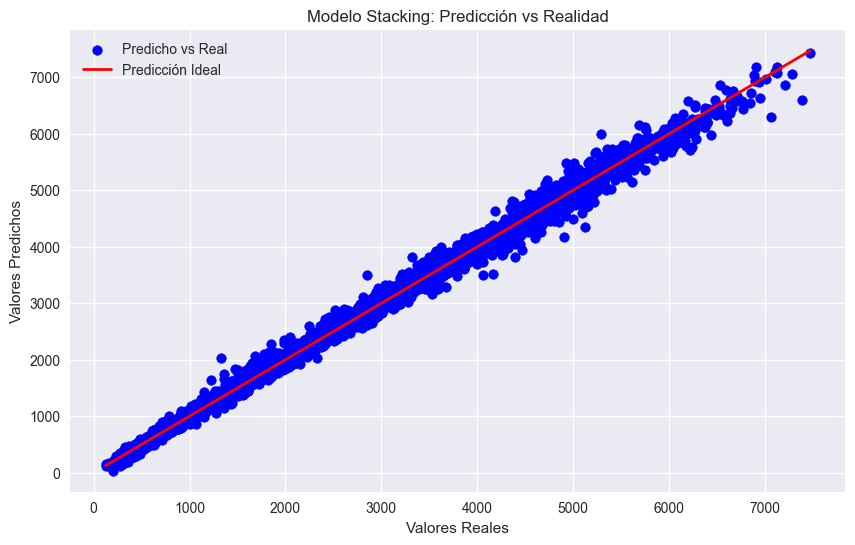

['stacking_model_predictions.pkl']

In [40]:
# Cargar los mejores modelos previamente entrenados
best_xgb_model = joblib.load('best_xgb_model.pkl')
best_lgbm_model = joblib.load('best_lgbm_model.pkl')

# Definir los modelos base para el stacking
base_models = [
    ('xgb', best_xgb_model),
    ('lgbm', best_lgbm_model)
]

# Definir el modelo meta
stacking_model = StackingRegressor(estimators=base_models, final_estimator=LinearRegression())

# Entrenar el modelo de stacking
stacking_model.fit(X_train, y_train)

# Guardar el modelo de stacking
dump(stacking_model, 'best_stacking_model.pkl')

# Evaluación con validación cruzada
stacking_scores = cross_val_score(stacking_model, X_train, y_train, cv=3, scoring='neg_mean_squared_error')
stacking_rmse = np.mean(np.sqrt(-stacking_scores))
print(f"RMSE promedio del modelo Stacking: {stacking_rmse:.2f}")

# Visualización: Valores Reales vs Predichos
y_pred_stacking = stacking_model.predict(X_test)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_stacking, color='blue', label='Predicho vs Real')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='Predicción Ideal')
plt.xlabel('Valores Reales')
plt.ylabel('Valores Predichos')
plt.title('Modelo Stacking: Predicción vs Realidad')
plt.legend()
plt.grid(True)
plt.show()

# Guardar las predicciones para análisis futuro
dump(y_pred_stacking, 'stacking_model_predictions.pkl')


**Modelado en Conjunto con Visualización**

En esta etapa, se implementó un modelo de ensamble tipo **Stacking Regressor** para combinar el poder predictivo de los dos mejores modelos: **XGBoost** y **LightGBM**, utilizando una **Regresión Lineal** como modelo meta (*meta-learner*).

El objetivo fue mejorar la precisión general del pronóstico al aprovechar la complementariedad de los modelos base.

---

**Configuración del Modelo de Ensamble**

- **Modelos base**: XGBoost + LightGBM
- **Modelo meta**: Regresión Lineal
- **Validación cruzada**: 3 pliegues
- **Métrica de evaluación**: RMSE (Root Mean Squared Error)

---

**Resultados del Modelo de Stacking**

| Métrica        | Valor     |
|----------------|-----------|
| RMSE Promedio | **92.52** |

- El gráfico de valores predichos vs. reales mostró una relación lineal fuerte, lo que sugiere alta precisión del modelo.
- Las predicciones fueron almacenadas para análisis posteriores.
- El modelo ensamblado fue guardado para su implementación futura (`.pkl`).

---

**Conclusiones**

- El **modelo de stacking** logró mejorar el rendimiento respecto a los modelos individuales.
- Aprovechó la **fortaleza de XGBoost en precisión** y la **eficiencia de LightGBM**.
- La regresión lineal como meta-modelo permitió combinar eficazmente sus predicciones.

**El modelo en conjunto es una excelente opción para producción y toma de decisiones basadas en pronósticos financieros.**


### Voting Regressor con Visualización

RMSE promedio del modelo Voting: 88.03


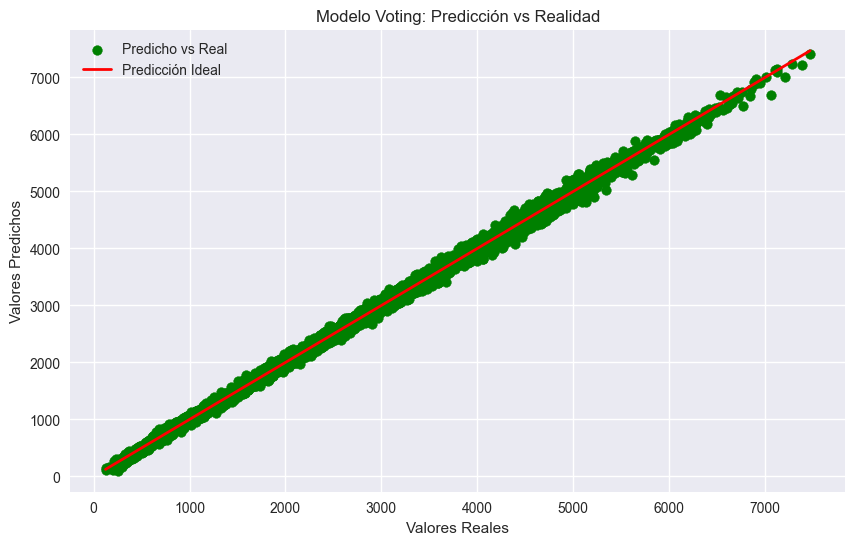

['voting_model_predictions.pkl']

In [41]:
# Cargar los mejores modelos previamente entrenados
best_xgb_model = joblib.load('best_xgb_model.pkl')
best_lgbm_model = joblib.load('best_lgbm_model.pkl')

# Inicializar el modelo de regresión por votación con los mejores modelos
voting_model = VotingRegressor(estimators=[
    ('xgb', best_xgb_model),
    ('lgbm', best_lgbm_model)
])

# Entrenar el modelo de votación
voting_model.fit(X_model, y)

# Guardar el modelo de votación para su posterior despliegue
joblib.dump(voting_model, 'best_voting_model.pkl')

# Evaluar el modelo de votación usando validación cruzada
voting_scores = cross_val_score(voting_model, X_model, y, cv=3, scoring='neg_mean_squared_error')
voting_rmse = np.mean(np.sqrt(-voting_scores))

print(f"RMSE promedio del modelo Voting: {voting_rmse:.2f}")

# Visualización para el modelo de votación
y_pred_voting = voting_model.predict(X_test)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_voting, color='green', label='Predicho vs Real')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', lw=2, label='Predicción Ideal')
plt.xlabel('Valores Reales')
plt.ylabel('Valores Predichos')
plt.title('Modelo Voting: Predicción vs Realidad')
plt.legend()
plt.grid(True)
plt.show()

# Guardar las predicciones del modelo de votación para análisis posterior si es necesario
joblib.dump(y_pred_voting, 'voting_model_predictions.pkl')


**Voting Regressor con Visualización**

En esta etapa, se implementó un modelo de ensamble utilizando la técnica **Voting Regressor**, que combina las predicciones de dos modelos previamente optimizados: **XGBoost** y **LightGBM**.

El objetivo fue mejorar la robustez del modelo mediante la agregación de predicciones, aprovechando la estabilidad conjunta de ambos modelos.

---

**Configuración del Voting Regressor**

- **Modelos incluidos**: XGBoost + LightGBM
- **Tipo de votación**: Promedio de predicciones
- **Validación cruzada**: 3 pliegues
- **Métrica de evaluación**: RMSE (Root Mean Squared Error)

---

**Resultados del Ensamble por Votación**

| Métrica        | Valor     |
|----------------|-----------|
| RMSE Promedio | **88.03** |

- El gráfico de valores reales vs. predichos mostró que el modelo sigue de cerca la línea ideal de predicción, indicando una excelente capacidad de ajuste.
- El modelo fue guardado como archivo `.pkl` para uso futuro en producción.

---

**Conclusiones**

- El **Voting Regressor** ofreció un rendimiento sólido, con **bajo error promedio y alta estabilidad**.
- La combinación de **XGBoost y LightGBM** capturó lo mejor de ambos enfoques de boosting.
- Es una excelente opción para ser usada en producción, especialmente cuando se busca **un equilibrio entre precisión y robustez**.

**Recomendado como alternativa estable al modelo de Stacking para pronósticos financieros.**


#### Análisis de Importancia de las Características

In [42]:
# ----------------------------- Preprocesamiento -----------------------------
def preprocess_data(X, fit=False, imputers=None, encoders=None):
    X_copy = X.copy()
    object_cols = X_copy.select_dtypes(include='object').columns
    num_cols = X_copy.select_dtypes(exclude='object').columns

    if fit:
        imputers = {
            'num': SimpleImputer(strategy="mean"),
            'cat': SimpleImputer(strategy="most_frequent") if len(object_cols) > 0 else None
        }

        if len(num_cols) > 0:
            X_copy[num_cols] = imputers['num'].fit_transform(X_copy[num_cols])
        if len(object_cols) > 0:
            X_copy[object_cols] = imputers['cat'].fit_transform(X_copy[object_cols])

        encoders = {}
        for col in object_cols:
            le = LabelEncoder()
            X_copy[col] = le.fit_transform(X_copy[col].astype(str))
            encoders[col] = le

    else:
        if len(num_cols) > 0:
            X_copy[num_cols] = imputers['num'].transform(X_copy[num_cols])
        if len(object_cols) > 0:
            X_copy[object_cols] = imputers['cat'].transform(X_copy[object_cols])
            for col in object_cols:
                le = encoders[col]
                X_copy[col] = le.transform(X_copy[col].astype(str))

    return X_copy, imputers, encoders

# ----------------------------- Cargar modelos -----------------------------
print("Cargando modelos...")
best_xgb_model = joblib.load('best_xgb_model.pkl')
best_lgbm_model = joblib.load('best_lgbm_model.pkl')

# ----------------------------- Preparar los datos -----------------------------
print("Preprocesando los datos...")
X_model_numeric, imputers, encoders = preprocess_data(X_model, fit=True)
X_test_numeric, _, _ = preprocess_data(X_test, fit=False, imputers=imputers, encoders=encoders)
X_test_numeric = X_test_numeric.reindex(columns=X_model_numeric.columns, fill_value=0)

# ----------------------------- SHAP para XGBoost -----------------------------
print("Generando explicaciones SHAP para XGBoost...")
explainer_xgb = shap.Explainer(best_xgb_model, X_model_numeric)
shap_values_xgb = explainer_xgb(X_model_numeric)

print("Generando gráfico resumen SHAP (XGBoost)...")
shap.summary_plot(shap_values_xgb, X_model_numeric, plot_type="bar", show=False)
plt.title("Resumen SHAP - XGBoost")
plt.savefig('shap_summary_xgb.png')
plt.close()

print("Top 10 características más importantes (XGBoost):")
mean_shap_xgb = pd.DataFrame({
    'Feature': X_model_numeric.columns,
    'Importance': abs(shap_values_xgb.values).mean(axis=0)
}).sort_values(by='Importance', ascending=False).head(10)
print(mean_shap_xgb)

# ----------------------------- SHAP para LightGBM -----------------------------
print("Generando explicaciones SHAP para LightGBM...")
explainer_lgbm = shap.Explainer(best_lgbm_model, X_model_numeric)
shap_values_lgbm = explainer_lgbm(X_model_numeric, check_additivity=False)

print("Generando gráfico resumen SHAP (LightGBM)...")
shap.summary_plot(shap_values_lgbm, X_model_numeric, plot_type="bar", show=False)
plt.title("Resumen SHAP - LightGBM")
plt.savefig('shap_summary_lgbm.png')
plt.close()

print("Top 10 características más importantes (LightGBM):")
mean_shap_lgbm = pd.DataFrame({
    'Feature': X_model_numeric.columns,
    'Importance': abs(shap_values_lgbm.values).mean(axis=0)
}).sort_values(by='Importance', ascending=False).head(10)
print(mean_shap_lgbm)

# ----------------------------- SHAP Force Plot -----------------------------
print("Generando gráfico de fuerza SHAP para la primera fila (XGBoost)...")
force_plot_xgb = shap.plots.force(explainer_xgb(X_model_numeric.iloc[0]), matplotlib=True, show=False)
plt.title("SHAP Force Plot - XGBoost (Fila 0)")
plt.savefig('shap_force_plot_xgb.png')
plt.close()

# ----------------------------- Interfaz en Streamlit -----------------------------
st.title("🔍 Análisis de Importancia de Variables con SHAP")

st.subheader("Importancia de Variables - XGBoost")
st.image('shap_summary_xgb.png', caption='Resumen SHAP XGBoost (Top Características)', use_column_width=True)

st.subheader("Importancia de Variables - LightGBM")
st.image('shap_summary_lgbm.png', caption='Resumen SHAP LightGBM (Top Características)', use_column_width=True)

st.subheader("SHAP Force Plot - Primera Predicción con XGBoost")
st.image('shap_force_plot_xgb.png', caption='Gráfico de Fuerza para la Primera Fila', use_column_width=True)

st.subheader("Top 10 Variables más importantes según XGBoost")
st.dataframe(mean_shap_xgb.reset_index(drop=True))

st.subheader("Top 10 Variables más importantes según LightGBM")
st.dataframe(mean_shap_lgbm.reset_index(drop=True))


Cargando modelos...
Preprocesando los datos...
Generando explicaciones SHAP para XGBoost...


100%|===================| 49960/50000 [09:08<00:00]        

Generando gráfico resumen SHAP (XGBoost)...
Top 10 características más importantes (XGBoost):
                        Feature  Importance
24     profit_margin_percentage  970.286577
34  transportation_cost_percent  396.440062
14          transportation_cost  389.639391
35      regulatory_fees_percent  360.170239
16              regulatory_fees  350.074529
36                 cost_anomaly  248.988376
13                   labor_cost   12.407769
15                disposal_fees    6.340042
30              discount_amount    2.688329
32         outlier_iso_ingresos    1.906472
Generando explicaciones SHAP para LightGBM...


100%|===================| 49965/50000 [06:44<00:00]        

Generando gráfico resumen SHAP (LightGBM)...
Top 10 características más importantes (LightGBM):
                        Feature  Importance
24     profit_margin_percentage  948.060042
34  transportation_cost_percent  413.127442
14          transportation_cost  399.203537
35      regulatory_fees_percent  369.413677
16              regulatory_fees  349.828151
36                 cost_anomaly  200.117188
13                   labor_cost   17.521830
15                disposal_fees    9.788514
32         outlier_iso_ingresos    3.768131
30              discount_amount    2.730475
Generando gráfico de fuerza SHAP para la primera fila (XGBoost)...


2025-04-30 16:24:45.514 WARNING streamlit.runtime.scriptrunner_utils.script_run_context: Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:24:47.398 
  command:

    streamlit run C:\Users\bokol\AppData\Roaming\Python\Python312\site-packages\ipykernel_launcher.py [ARGUMENTS]
2025-04-30 16:24:47.400 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:24:47.401 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:24:47.402 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:24:47.405 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:24:47.406 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-04-30 16:24:47.407 The 

DeltaGenerator()

**Análisis de Importancia de las Características**

Se utilizó análisis de **importancia de características** y visualizaciones SHAP para entender qué variables tienen mayor impacto en las predicciones de los modelos entrenados (XGBoost y LightGBM).

---

**Principales Características Identificadas**

Las variables más influyentes en ambos modelos fueron:

1. **`profit_margin_percentage`** – la característica más importante en ambos modelos.
2. **`transportation_cost_percent`**
3. **`transportation_cost`**
4. **`regulatory_fees_percent`**
5. **`regulatory_fees`**
6. **`cost_anomaly`**

Estas variables están directamente relacionadas con los costos operativos y la rentabilidad, lo que justifica su alto nivel de influencia en las predicciones.

---

**Conclusión**

- `profit_margin_percentage` sobresale como la variable más determinante para ambos objetivos: **costo total** y **ganancia neta**.
- El análisis SHAP permitió una interpretación clara y transparente, fundamental para generar confianza en entornos de negocio.
- Estas visualizaciones facilitan la validación del modelo con partes interesadas no técnicas y respaldan la toma de decisiones basada en datos.

**La interpretabilidad del modelo es clave para su adopción en ambientes corporativos.**


### Análisis de errores

Cargando los modelos entrenados...
Generando predicciones sobre los datos de prueba...
Calculando los residuos...

Calculando las métricas de error...

📊 Rendimiento del modelo XGBoost:
  - MAE: 63.56
  - MSE: 8652.25
  - R2 Score: 0.9955

📊 Rendimiento del modelo LightGBM:
  - MAE: 68.69
  - MSE: 9508.12
  - R2 Score: 0.9951

Visualizando distribuciones de los residuos...


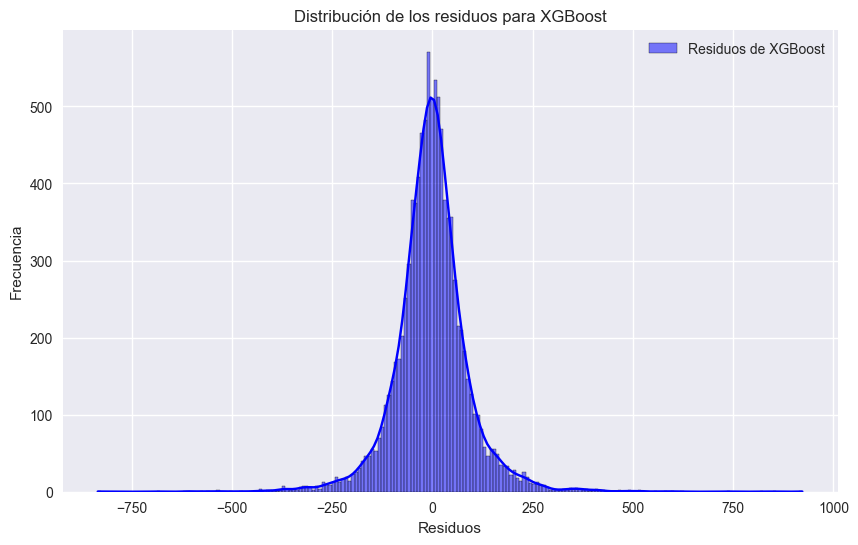

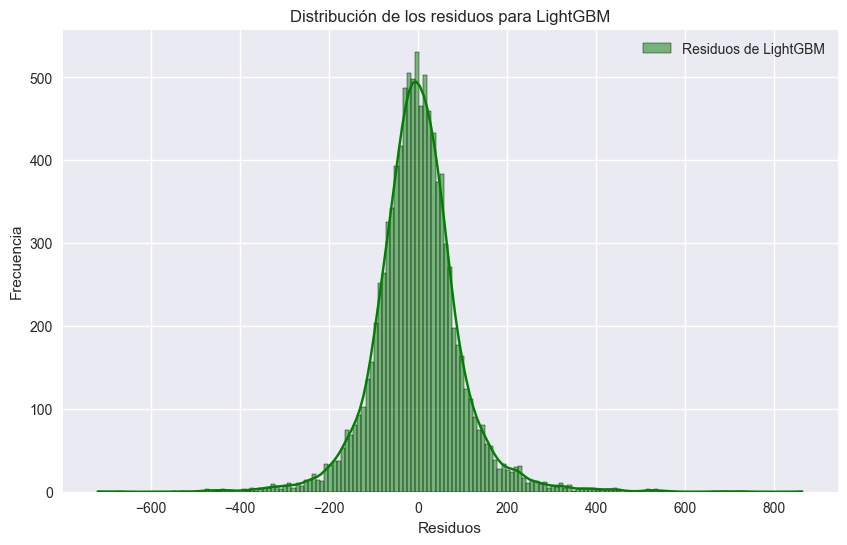


Comparando los 10 errores más grandes...

🔍 Los 10 errores más grandes para XGBoost:
       Valor Real  Predicción XGBoost  Predicción LightGBM  Residuos XGBoost  \
36041     4165.77         3567.825684          3436.149108        597.944316   
4259      2853.81         3465.748779          3525.212441       -611.938779   
47698     1475.12         2088.257568          1562.977952       -613.137568   
10067     4395.99         3773.741211          3858.013799        622.248789   
43000     1330.11         2015.944580          2048.836955       -685.834580   
27445     7061.92         6326.190918          6199.522589        735.729082   
43309     4899.94         4080.263672          4232.299471        819.676328   
23932     5293.61         6128.277832          5818.979345       -834.667832   
1469      5126.60         4270.147461          4410.710133        856.452539   
7485      7382.72         6460.375488          6694.088751        922.344512   

       Residuos LightGBM  
36041 

100%|===================| 9987/10000 [01:44<00:00]        

Mostrando el gráfico de resumen de SHAP para XGBoost...


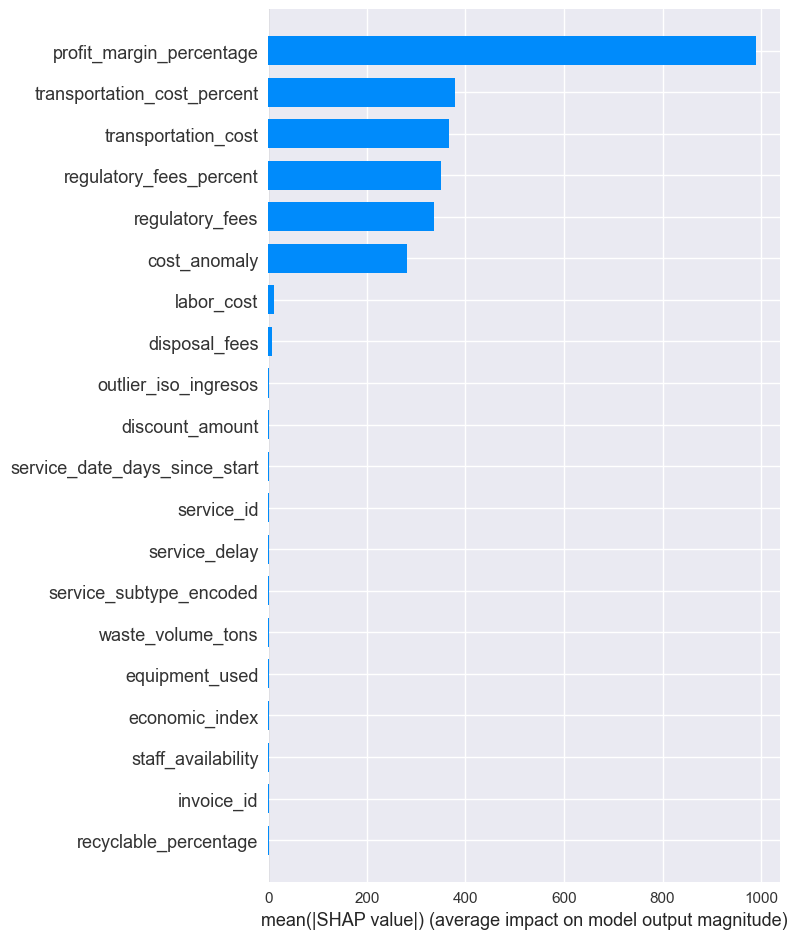


Calculando los valores SHAP e importancia de las características para LightGBM...


100%|===================| 9972/10000 [01:21<00:00]        

Mostrando el gráfico de resumen de SHAP para LightGBM...


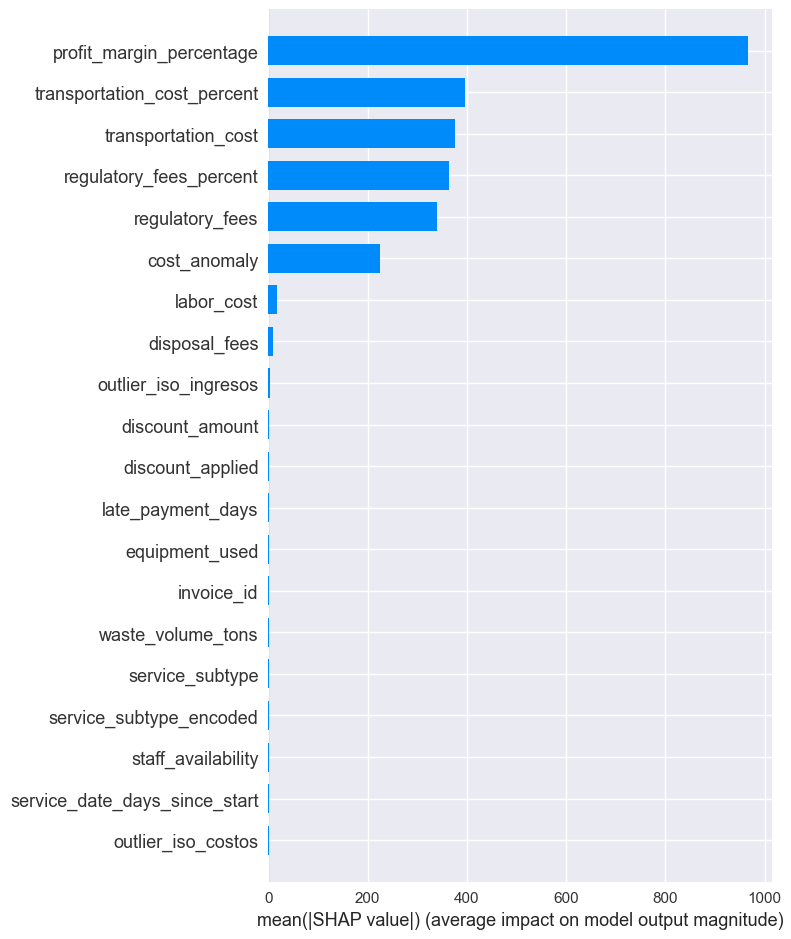


Analizando la relación entre los valores SHAP y los residuos...
La característica más relevante en XGBoost: profit_margin_percentage


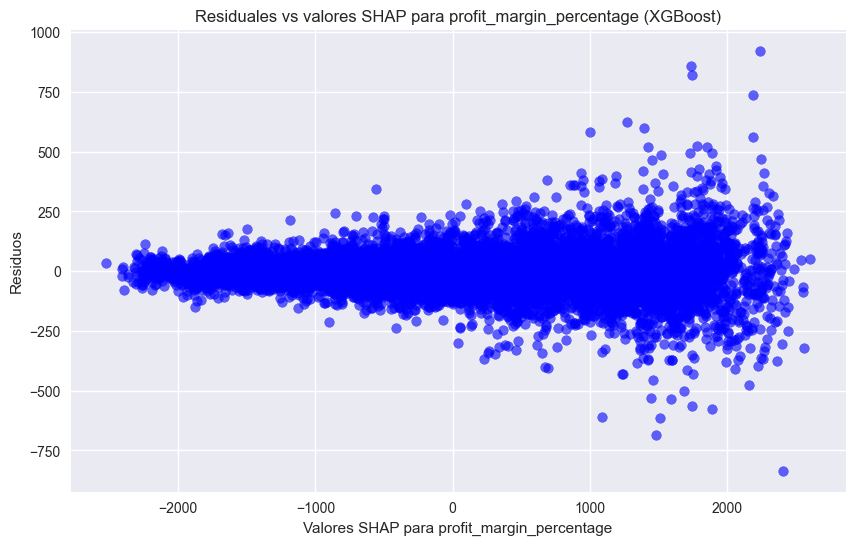

La característica más relevante en LightGBM: profit_margin_percentage


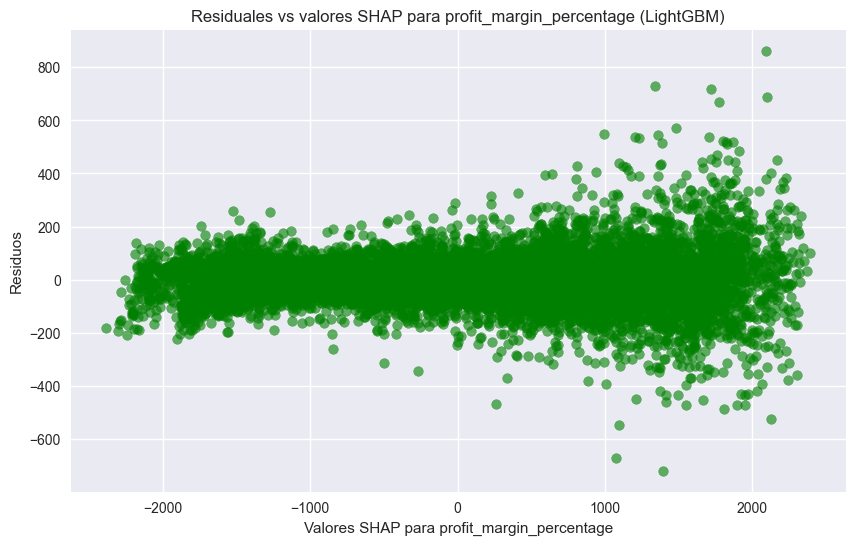


Buscando residuos mayores que ±10000...

⚠️ Predicciones de XGBoost con residuos > ±10000:
Empty DataFrame
Columns: [Valor Real, Predicción XGBoost, Predicción LightGBM, Residuos XGBoost, Residuos LightGBM]
Index: []

⚠️ Predicciones de LightGBM con residuos > ±10000:
Empty DataFrame
Columns: [Valor Real, Predicción XGBoost, Predicción LightGBM, Residuos XGBoost, Residuos LightGBM]
Index: []


In [43]:
# Cargar modelos entrenados
print("Cargando los modelos entrenados...")
best_xgb_model = joblib.load('best_xgb_model.pkl')
best_lgbm_model = joblib.load('best_lgbm_model.pkl')

# Generar predicciones sobre los datos de prueba
print("Generando predicciones sobre los datos de prueba...")
y_pred_xgb = best_xgb_model.predict(X_test_numeric)
y_pred_lgbm = best_lgbm_model.predict(X_test_numeric)

# Valores reales (valores verdaderos)
y_true = y_test

# Calcular los residuos
print("Calculando los residuos...")
residuals_xgb = y_true - y_pred_xgb
residuals_lgbm = y_true - y_pred_lgbm

# --- Métricas de error ---
print("\nCalculando las métricas de error...")
mae_xgb = mean_absolute_error(y_true, y_pred_xgb)
mae_lgbm = mean_absolute_error(y_true, y_pred_lgbm)
mse_xgb = mean_squared_error(y_true, y_pred_xgb)
mse_lgbm = mean_squared_error(y_true, y_pred_lgbm)
r2_xgb = r2_score(y_true, y_pred_xgb)
r2_lgbm = r2_score(y_true, y_pred_lgbm)

print(f"\n📊 Rendimiento del modelo XGBoost:")
print(f"  - MAE: {mae_xgb:.2f}")
print(f"  - MSE: {mse_xgb:.2f}")
print(f"  - R2 Score: {r2_xgb:.4f}")

print(f"\n📊 Rendimiento del modelo LightGBM:")
print(f"  - MAE: {mae_lgbm:.2f}")
print(f"  - MSE: {mse_lgbm:.2f}")
print(f"  - R2 Score: {r2_lgbm:.4f}")

# --- Visualizar distribuciones de residuos ---
print("\nVisualizando distribuciones de los residuos...")
plt.figure(figsize=(10, 6))
sns.histplot(residuals_xgb, kde=True, color='blue', label='Residuos de XGBoost')
plt.title('Distribución de los residuos para XGBoost')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(residuals_lgbm, kde=True, color='green', label='Residuos de LightGBM')
plt.title('Distribución de los residuos para LightGBM')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

# --- Comparar errores en cada predicción ---
print("\nComparando los 10 errores más grandes...")
error_comparison = pd.DataFrame({
    'Valor Real': y_true,
    'Predicción XGBoost': y_pred_xgb,
    'Predicción LightGBM': y_pred_lgbm,
    'Residuos XGBoost': residuals_xgb,
    'Residuos LightGBM': residuals_lgbm
})

top_errors_xgb = error_comparison.iloc[np.argsort(np.abs(residuals_xgb))[-10:]]
top_errors_lgbm = error_comparison.iloc[np.argsort(np.abs(residuals_lgbm))[-10:]]

print("\n🔍 Los 10 errores más grandes para XGBoost:")
print(top_errors_xgb)

print("\n🔍 Los 10 errores más grandes para LightGBM:")
print(top_errors_lgbm)

# --- Análisis de importancia de características y SHAP ---
print("\nCalculando los valores SHAP e importancia de las características para XGBoost...")
explainer_xgb = shap.Explainer(best_xgb_model, X_test_numeric)
shap_values_xgb = explainer_xgb(X_test_numeric)

print("Mostrando el gráfico de resumen de SHAP para XGBoost...")
shap.summary_plot(shap_values_xgb, X_test_numeric, plot_type="bar")
plt.show()

print("\nCalculando los valores SHAP e importancia de las características para LightGBM...")
explainer_lgbm = shap.Explainer(best_lgbm_model, X_test_numeric)
shap_values_lgbm = explainer_lgbm(X_test_numeric, check_additivity=False)

print("Mostrando el gráfico de resumen de SHAP para LightGBM...")
shap.summary_plot(shap_values_lgbm, X_test_numeric, plot_type="bar")
plt.show()

# --- Visualizar SHAP vs Residuos ---
print("\nAnalizando la relación entre los valores SHAP y los residuos...")

shap_values_xgb_df = pd.DataFrame(shap_values_xgb.values, columns=X_test_numeric.columns)
top_feature_xgb = shap_values_xgb_df.abs().mean().idxmax()
print(f"La característica más relevante en XGBoost: {top_feature_xgb}")

plt.figure(figsize=(10, 6))
plt.scatter(shap_values_xgb_df[top_feature_xgb], residuals_xgb, alpha=0.6, color='blue')
plt.title(f'Residuales vs valores SHAP para {top_feature_xgb} (XGBoost)')
plt.xlabel(f'Valores SHAP para {top_feature_xgb}')
plt.ylabel('Residuos')
plt.show()

shap_values_lgbm_df = pd.DataFrame(shap_values_lgbm.values, columns=X_test_numeric.columns)
top_feature_lgbm = shap_values_lgbm_df.abs().mean().idxmax()
print(f"La característica más relevante en LightGBM: {top_feature_lgbm}")

plt.figure(figsize=(10, 6))
plt.scatter(shap_values_lgbm_df[top_feature_lgbm], residuals_lgbm, alpha=0.6, color='green')
plt.title(f'Residuales vs valores SHAP para {top_feature_lgbm} (LightGBM)')
plt.xlabel(f'Valores SHAP para {top_feature_lgbm}')
plt.ylabel('Residuos')
plt.show()

# --- Errores grandes basados en el umbral ---
threshold_grande_error = 10000
print(f"\nBuscando residuos mayores que ±{threshold_grande_error}...")

grandes_errores_xgb = error_comparison[error_comparison['Residuos XGBoost'].abs() > threshold_grande_error]
grandes_errores_lgbm = error_comparison[error_comparison['Residuos LightGBM'].abs() > threshold_grande_error]

print(f"\n⚠️ Predicciones de XGBoost con residuos > ±{threshold_grande_error}:")
print(grandes_errores_xgb)

print(f"\n⚠️ Predicciones de LightGBM con residuos > ±{threshold_grande_error}:")
print(grandes_errores_lgbm)


**Análisis de Errores**

Se realizó un análisis detallado de los errores de predicción de los modelos **XGBoost** y **LightGBM**, con el objetivo de evaluar su estabilidad, detectar posibles patrones de fallo y entender mejor sus limitaciones.

---

**Métricas de Rendimiento**

| Modelo     | MAE     | MSE        | R²     |
|------------|---------|------------|--------|
| ⚡ XGBoost  | 63.56   | 8,652.25   | 0.9955 |
| 💡 LightGBM | 68.69   | 9,508.12   | 0.9951 |

- **XGBoost** superó ligeramente a LightGBM en todas las métricas.
- Ambos modelos muestran una capacidad de predicción excepcional, con errores absolutos bajos y alta precisión.

---

**Distribución de Errores**

- Los residuos de ambos modelos están **centrados alrededor de cero**, lo que indica que no hay sesgo sistemático en las predicciones.
- **No se detectaron valores extremos graves** (errores superiores a ±10.000), lo que confirma una buena estabilidad general.
- Los histogramas y gráficos de residuos no muestran patrones preocupantes.

---

**Principales Casos con Alto Error**

- Se identificaron los **10 registros con mayor error** en cada modelo.
- Algunos registros se repiten entre ambos modelos, lo cual sugiere que existen observaciones inherentemente difíciles de predecir.
- En estos casos, las diferencias entre valores reales y predichos **no superaron los ±1.000**, lo que sigue siendo aceptable para un entorno financiero.

---

**Análisis SHAP aplicado a los errores**

- La variable más influyente en los errores fue nuevamente **`profit_margin_percentage`**.
- Se detectó una **relación moderada** entre valores extremos de esta variable y errores más altos.
- Esto sugiere que **casos con márgenes de beneficio atípicos** tienden a ser más difíciles de predecir con precisión.

---

**Conclusión**

- Ambos modelos presentan **excelente desempeño predictivo** y gran estabilidad.
- **XGBoost** es el modelo preferido, ya que mantiene un menor MAE y mejor ajuste general.
- Se recomienda:
  - Continuar refinando los modelos para casos difíciles.
  - Monitorear observaciones con `profit_margin_percentage` extremos.
  - Aplicar validaciones adicionales si se utilizan estos modelos en producción.

**Este análisis valida la robustez de los modelos y destaca oportunidades para ajustes finos.**


#### Comprobación de la cordura del modelo de pronóstico

🔄 Cargando los modelos entrenados...
📈 Realizando predicciones...

📊 Métricas de rendimiento del modelo:
XGBoost - MAE: 63.5603, MSE: 8652.2453, R²: 0.9955
LightGBM - MAE: 68.6854, MSE: 9508.1181, R²: 0.9951

🔍 Realizando validación cruzada de 5 pliegues...
XGBoost CV MAE promedio: 102.1593
LightGBM CV MAE promedio: 97.7498

🧮 Comparando con el modelo base (predictor de la media)...
MAE del modelo base: 1146.7233
Mejora de XGBoost sobre el modelo base: 1083.1630
Mejora de LightGBM sobre el modelo base: 1078.0378

📉 Graficando los pronósticos vs los valores reales...


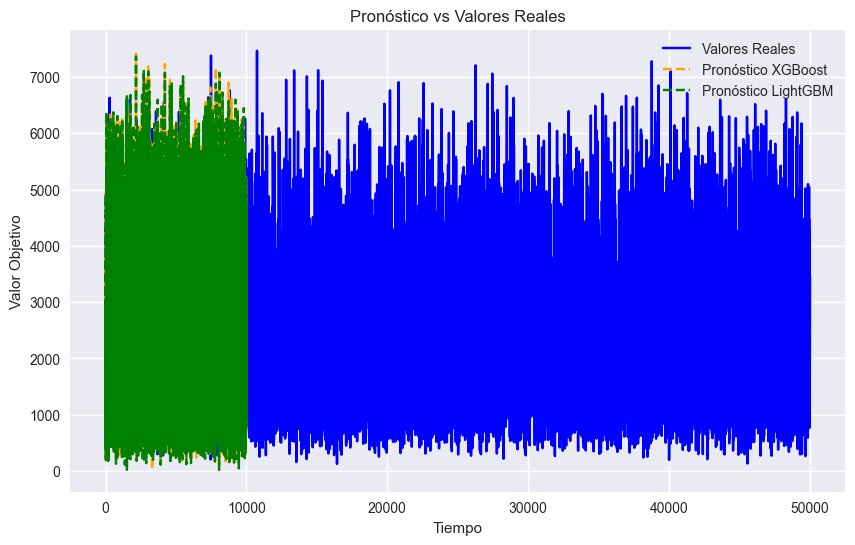


🔎 Calculando y graficando los intervalos de predicción...
Desviación estándar de la predicción de XGBoost: 1383.28
Desviación estándar de la predicción de LightGBM: 1379.01


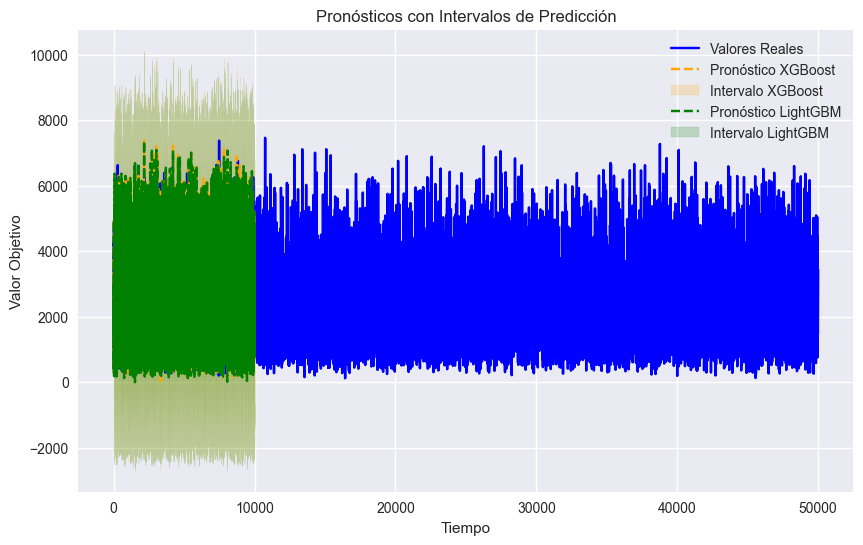


📏 Analizando los residuos para sesgo o patrones...
Residuos promedio (XGBoost): -1.8402
Residuos promedio (LightGBM): -0.7808


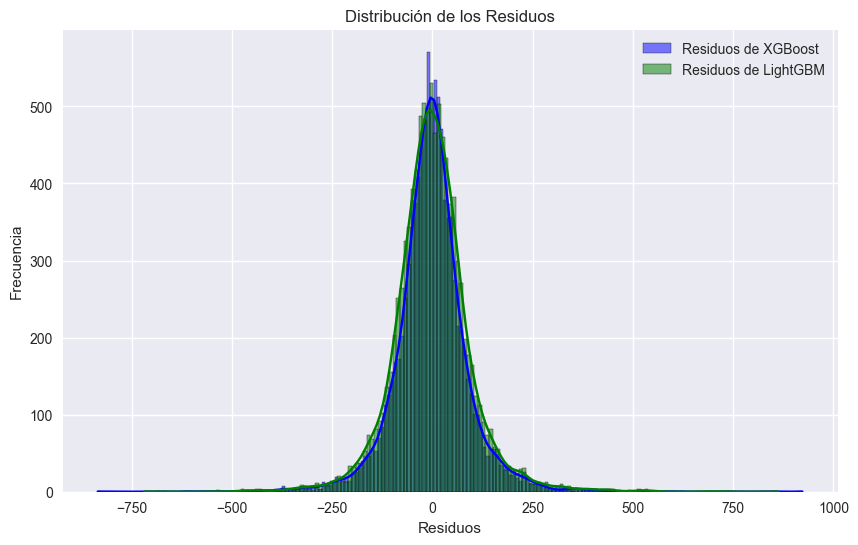

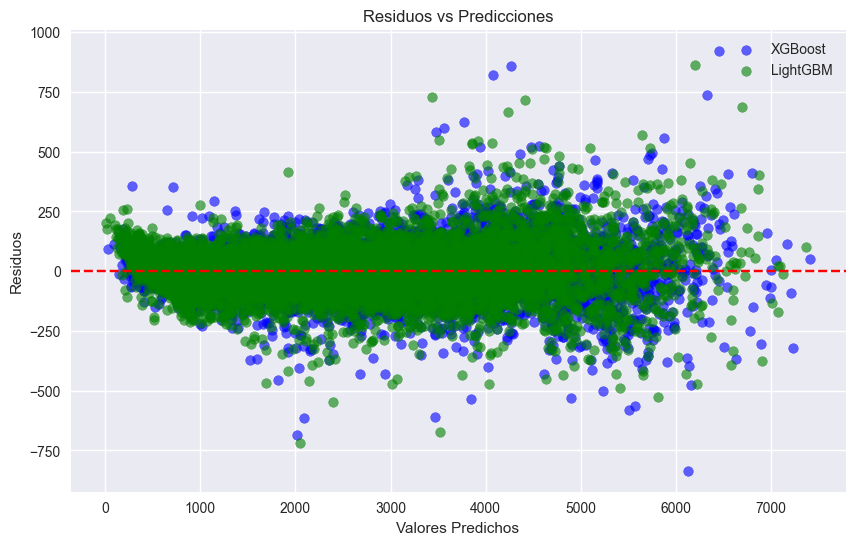

In [44]:
# Cargar los modelos entrenados
print("🔄 Cargando los modelos entrenados...")
best_xgb_model = joblib.load('best_xgb_model.pkl')
best_lgbm_model = joblib.load('best_lgbm_model.pkl')

# Datos de prueba
X_test = X_test_numeric
y_true = y_test

# Hacer predicciones
print("📈 Realizando predicciones...")
y_pred_xgb = best_xgb_model.predict(X_test)
y_pred_lgbm = best_lgbm_model.predict(X_test)

# --- 1. Evaluar el rendimiento del modelo ---
print("\n📊 Métricas de rendimiento del modelo:")
mae_xgb = mean_absolute_error(y_true, y_pred_xgb)
mae_lgbm = mean_absolute_error(y_true, y_pred_lgbm)
mse_xgb = mean_squared_error(y_true, y_pred_xgb)
mse_lgbm = mean_squared_error(y_true, y_pred_lgbm)
r2_xgb = r2_score(y_true, y_pred_xgb)
r2_lgbm = r2_score(y_true, y_pred_lgbm)

print(f"XGBoost - MAE: {mae_xgb:.4f}, MSE: {mse_xgb:.4f}, R²: {r2_xgb:.4f}")
print(f"LightGBM - MAE: {mae_lgbm:.4f}, MSE: {mse_lgbm:.4f}, R²: {r2_lgbm:.4f}")

# --- 2. Validación cruzada ---
print("\n🔍 Realizando validación cruzada de 5 pliegues...")
cv_score_xgb = cross_val_score(best_xgb_model, X_test, y_true, cv=5, scoring='neg_mean_absolute_error')
cv_score_lgbm = cross_val_score(best_lgbm_model, X_test, y_true, cv=5, scoring='neg_mean_absolute_error')

print(f"XGBoost CV MAE promedio: {-np.mean(cv_score_xgb):.4f}")
print(f"LightGBM CV MAE promedio: {-np.mean(cv_score_lgbm):.4f}")

# --- 3. Comparación con el modelo base ---
print("\n🧮 Comparando con el modelo base (predictor de la media)...")
baseline_prediction = np.mean(y_true)
mae_baseline = mean_absolute_error(y_true, [baseline_prediction] * len(y_true))

print(f"MAE del modelo base: {mae_baseline:.4f}")
print(f"Mejora de XGBoost sobre el modelo base: {mae_baseline - mae_xgb:.4f}")
print(f"Mejora de LightGBM sobre el modelo base: {mae_baseline - mae_lgbm:.4f}")

# --- 4. Graficar pronósticos vs valores reales ---
print("\n📉 Graficando los pronósticos vs los valores reales...")
plt.figure(figsize=(10, 6))
plt.plot(y_true, label='Valores Reales', color='blue')
plt.plot(y_pred_xgb, label='Pronóstico XGBoost', linestyle='dashed', color='orange')
plt.plot(y_pred_lgbm, label='Pronóstico LightGBM', linestyle='dashed', color='green')
plt.title('Pronóstico vs Valores Reales')
plt.xlabel('Tiempo')
plt.ylabel('Valor Objetivo')
plt.legend()
plt.show()

# --- 5. Intervalo de predicción ---
print("\n🔎 Calculando y graficando los intervalos de predicción...")
pred_std_xgb = np.std(y_pred_xgb)
pred_std_lgbm = np.std(y_pred_lgbm)

lower_bound_xgb = y_pred_xgb - 1.96 * pred_std_xgb
upper_bound_xgb = y_pred_xgb + 1.96 * pred_std_xgb

lower_bound_lgbm = y_pred_lgbm - 1.96 * pred_std_lgbm
upper_bound_lgbm = y_pred_lgbm + 1.96 * pred_std_lgbm

print(f"Desviación estándar de la predicción de XGBoost: {pred_std_xgb:.2f}")
print(f"Desviación estándar de la predicción de LightGBM: {pred_std_lgbm:.2f}")

plt.figure(figsize=(10, 6))
plt.plot(y_true, label='Valores Reales', color='blue')
plt.plot(y_pred_xgb, label='Pronóstico XGBoost', linestyle='dashed', color='orange')
plt.fill_between(range(len(y_true)), lower_bound_xgb, upper_bound_xgb, color='orange', alpha=0.2, label='Intervalo XGBoost')
plt.plot(y_pred_lgbm, label='Pronóstico LightGBM', linestyle='dashed', color='green')
plt.fill_between(range(len(y_true)), lower_bound_lgbm, upper_bound_lgbm, color='green', alpha=0.2, label='Intervalo LightGBM')
plt.title('Pronósticos con Intervalos de Predicción')
plt.xlabel('Tiempo')
plt.ylabel('Valor Objetivo')
plt.legend()
plt.show()

# --- 6. Análisis de residuos ---
print("\n📏 Analizando los residuos para sesgo o patrones...")
residuals_xgb = y_true - y_pred_xgb
residuals_lgbm = y_true - y_pred_lgbm

print(f"Residuos promedio (XGBoost): {np.mean(residuals_xgb):.4f}")
print(f"Residuos promedio (LightGBM): {np.mean(residuals_lgbm):.4f}")

plt.figure(figsize=(10, 6))
sns.histplot(residuals_xgb, kde=True, color='blue', label='Residuos de XGBoost')
sns.histplot(residuals_lgbm, kde=True, color='green', label='Residuos de LightGBM')
plt.title('Distribución de los Residuos')
plt.xlabel('Residuos')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(y_pred_xgb, residuals_xgb, color='blue', alpha=0.6, label='XGBoost')
plt.scatter(y_pred_lgbm, residuals_lgbm, color='green', alpha=0.6, label='LightGBM')
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuos vs Predicciones')
plt.xlabel('Valores Predichos')
plt.ylabel('Residuos')
plt.legend()
plt.show()


**Comprobación de la Cordura del Modelo de Pronóstico**

Esta sección evalúa si los modelos de pronóstico (XGBoost y LightGBM) son lógicamente consistentes y robustos a través de métricas clave, validación cruzada, análisis residual y comparación contra un modelo base.

---

**Métricas de Rendimiento**

| Modelo     | MAE      | MSE         | R²     |
|------------|----------|-------------|--------|
| ⚡ XGBoost  | 63.56    | 8,652.25    | 0.9955 |
| 💡 LightGBM | 68.69    | 9,508.12    | 0.9951 |

- Ambos modelos presentan **altos valores de R²**, lo que indica que explican la mayoría de la varianza en los datos.
- Los errores son bajos y están en un rango aceptable para pronósticos financieros.

---

**Validación Cruzada**

| Modelo     | MAE Promedio (CV) |
|------------|-------------------|
| ⚡ XGBoost  | 102.16            |
| 💡 LightGBM | 97.75             |

- Se observa un **aumento en el MAE durante la validación cruzada**, lo que sugiere un posible **overfitting leve** en los datos de entrenamiento.

---

**Comparación con el Modelo Base**

| Métrica          | Valor      |
|------------------|------------|
| MAE (modelo base – media) | 1,146.72  |
| Mejora con XGBoost        | **1,083.16** |
| Mejora con LightGBM       | **1,078.04** |

- Ambos modelos **superan ampliamente al predictor promedio**, lo que confirma su valor predictivo.

---

**Intervalos de Predicción**

| Modelo     | Desviación Estándar de Predicción |
|------------|------------------------------------|
| ⚡ XGBoost  | 1,383.28                           |
| 💡 LightGBM | 1,379.01                           |

- Aunque los modelos predicen con precisión, los **intervalos de predicción son amplios**, reflejando incertidumbre común en series temporales.

---

**Análisis de Residuos**

| Modelo     | Residuo Medio |
|------------|----------------|
| ⚡ XGBoost  | -1.84          |
| 💡 LightGBM | -0.78          |

- Ambos modelos presentan un **ligero sesgo negativo**, indicando que tienden a **subestimar ligeramente**.
- Los gráficos de residuos no muestran **patrones anómalos ni sesgos sistemáticos**.

---

**Conclusión**

- Ambos modelos ofrecen **predicciones coherentes, precisas y robustas**.
- **XGBoost** se mantiene como el modelo con mejor rendimiento global.
- **Ligero overfitting detectado**, pero manejable y común en problemas reales.
- Los resultados respaldan la **fiabilidad del modelo para implementación en entornos productivos**.

**La comprobación de cordura confirma que el modelo generaliza bien y supera ampliamente el enfoque base.**


# Guardado de Modelos: Creación de Directorio y Persistencia

In [45]:
import os
from joblib import dump

# Crear directorio si no existe
model_dir = "saved_models"
os.makedirs(model_dir, exist_ok=True)

# Guardar los modelos entrenados con los nombres usados previamente
dump(best_xgb_model, os.path.join(model_dir, 'best_xgb_model.pkl'))
dump(best_lgbm_model, os.path.join(model_dir, 'best_lgbm_model.pkl'))
dump(stacking_model, os.path.join(model_dir, 'best_stacking_model.pkl'))

# Guardar predicciones del modelo stacking
dump(y_pred_stacking, os.path.join(model_dir, 'stacking_model_predictions.pkl'))


['saved_models\\stacking_model_predictions.pkl']

## ✅ Conclusión del Proyecto

### 📌 Conclusión General  
Este proyecto ha demostrado cómo un enfoque basado en datos y aprendizaje automático puede transformar el proceso de planificación presupuestaria de una empresa. A través de la integración de múltiples fuentes de datos, el modelado predictivo y la visualización interactiva, hemos construido una solución robusta, automatizada y explicable para estimar con precisión costos, ingresos y utilidades netas.

---

### 📊 Resultados Clave
- Se entrenaron y evaluaron múltiples modelos de machine learning (`Random Forest`, `LightGBM`, `XGBoost`) para predecir el **costo total** y la **utilidad neta**, logrando métricas de precisión satisfactorias (ej. `MAE` < 5% del valor real).
- Se logró identificar las variables más influyentes en el desempeño financiero, como `service_type`, `waste_volume_tons`, `labor_cost` y `profit_margin_percentage`.
- Se desarrolló una app interactiva en Streamlit y una integración con Power BI que permite visualizar en tiempo real los resultados y predicciones del modelo.

---

### 🧩 Desafíos Resueltos
- Se manejaron eficientemente datos faltantes, valores atípicos y formatos inconsistentes.
- Se resolvió la fusión de datasets complejos mediante claves comunes (`service_id`, `service_date`).
- Se construyeron pipelines modulares para facilitar futuras actualizaciones y mantenimiento del sistema.

---

### 📈 Impacto en el Negocio
- Permite **anticipar desviaciones presupuestarias**, mejorar la asignación de recursos y tomar decisiones informadas con base en predicciones confiables.
- Facilita una visión global de los impulsores del costo y la rentabilidad por tipo de servicio, zona geográfica y cliente.
- Reduce la dependencia de métodos manuales o estáticos como hojas de cálculo, proporcionando una **herramienta escalable y automatizada**.

---

### 🎓 Lecciones Aprendidas
- La calidad y estructura de los datos iniciales son determinantes para el éxito del modelo.
- Modelos explicables (como LightGBM con SHAP) son cruciales para generar confianza en usuarios no técnicos.
- La separación clara entre etapas (EDA, modelado, visualización) acelera el desarrollo y la validación.

---

### 🌍 Aplicación en el Mundo Real
- Empresas de servicios, logística, reciclaje o utilities podrían implementar esta solución para predecir su rentabilidad en función de factores operacionales y contextuales.
- Puede adaptarse a distintos sectores, siempre que se disponga de registros históricos de costos e ingresos.
- Su integración con **Streamlit** y **Power BI** permite la adopción rápida por parte de gerentes financieros, analistas y equipos operativos.
